last updated 11 03 24

This notebook is to get the run times for each model on the highets and lowest Resolutions; to estimate an average run time.IG DICITONARY!



In [1]:
#!pip install ipython

In [2]:
# imports
import torch

import torch.nn as nn
from torchvision.models import vgg16
import torch.optim.lr_scheduler as lr_scheduler
import torch.optim as optim
from torchvision.models import vgg16
from torch.utils.data import DataLoader
#from torch.Utils.data import DataLoader
import torch.nn.functional as F
from sklearn.model_selection import train_test_split

import numpy as np
import cv2


from datetime import date
from tqdm import tqdm
import pprint
import collections
from IPython.display import clear_output
import time
import random
import cv2

import csv
import json
import pickle
import os

import wandb

import sys
sys.path.append('../.')
from functions import import_imagedata, ImageProcessor, label_oh_tf, IDSWDataSetLoader2
from fns4wandb import set_lossfn
#from architectures import sevennet, smallnet1, smallnet2, smallnet3
from architectures import PrintLayer, smallnet3
from loop_fns import loop#, loop_batch, test_loop_batch
from plotting import learning_curve, accuracy_curve, plot_confusion



#import torch.Utils.data.DataLoader as DataLoader

In [3]:
#p = torch.cuda.memory_summary(device, abbreviated=False)
#Pp = pprint.PrettyPrinter(indent=4)
#Pp.pprint(p)

In [4]:
# file paths
_save_location = r'/its/home/nn268/antvis/antvis/optics/res_big_loop_saves/models/batch/testing/' #vgg16

data_path = r'/its/home/nn268/antvis/antvis/optics/AugmentedDS_IDSW/'

gitHASH = 'test'

In [5]:
wandb.login()


wandb: Currently logged in as: naughticalnonsence (antvis). Use `wandb login --relogin` to force relogin


True

In [6]:
#!pip install datetime

d = date.today()
#print(str(d), type(str(d)))

452 144 5/452 *100 = 1%
226 72 5/226 *100 = 2%
113 36 5/113 *100 = 4% -- 2/113 *100= 1.7% ~ 2%
57 18 (56.5,) 5/57 *100 = 8% -- 2/57 *100 = 3.5% ~ 4%. 1/57 = 1.75%
29 9 (28.5,) 5/29 *100 = 17% -- 2/29 *100 = 6.89 ~ 7% 1/28 = 3.57 ~ 4%
15 5 (14.5, 4.5)
8 3 (7.5,2.5)
4, 2 (, 1.5)

In [7]:
   

Pp = pprint.PrettyPrinter(indent=4)

def save2csv_nest_dict(nested_dict, file_name, save_location:str):
    # flattern nested dictionary
    flatterend_dict = {}
    for k,v in nested_dict.items():
        if isinstance(v, dict):
            for nested_key, nested_val in v.items():
                flatterend_dict[f"{k}_{nested_key}"] = nested_val
        else:
            flatterend_dict[k] =v
    
    columns = list(flatterend_dict.keys())
    
    with open(save_location+str(file_name)+'.csv', "a+", newline="") as f:
        # using dictwriter
        writer = csv.DictWriter(f, fieldnames=columns)
        # using writeheader function
        if f.tell() == 0:
            writer.writeheader()
        writer.writerow(flatterend_dict)
        f.close()

# check dictionary values for json and csv

def check_obj4np(obj):
    if isinstance(obj, dict):
        return {key: check_obj4np(value) for key, value in obj.items()}
    if isinstance(obj,list):
        return [check_obj4np(item) for item in obj]
    if isinstance(obj,np.ndarray):
        return obj.tolist()
    if isinstance(obj, torch.Tensor):
        return obj.tolist()
    else:
        return obj

# save to json
def save2josn_nested_dict(nested_dict, file_name, save_location:str):
    nested_dict = check_obj4np(nested_dict)
    json_obj = json.dumps(nested_dict, indent=4)
    with open(save_location+str(file_name)+'.json', 'a+') as f:
        f.write(json_obj)
        f.close()

    
#save_location+str(file_name)+'.csv'
def save2csv(nested_dict, file_name, save_location:str):
    
    nested_dict = check_obj4np(nested_dict)
    
    columns = list(nested_dict.keys())
    path = os.path.join(save_location, file_name +".csv")
    try:
        with open(path, "a", newline="") as f:
            writer = csv.DictWriter(f, fieldnames=columns)
            # using dictwriter
            # using writeheader function
            if f.tell() == 0:
                writer.writeheader()
            writer.writerow(nested_dict)
            f.close()
    except IOError as e:
        print("I/O error({0}): {1}".format(e.errno, e.strerror))
    except ValueError:
              print("could not convert to string")
    except:
              print("unexpected error: ", sys.exc_info()[0])
        

def save2json(nested_dict, file_name, save_location:str):
    nested_dict = check_obj4np(nested_dict)
    #print(nested_dict)
    #print(nested_dict.items())
    json_obj = json.dumps(nested_dict, indent=4)
    #print(json_obj)
    path = os.path.join(save_location, file_name+".json")
    #print(path)
    with open(path, 'w') as f:
        f.write(json_obj)
        
        


def read_in_json(file_path, file_name):
    path = os.path.join(file_path, 'file_name')
    try:
        with open(path, 'r') as f:
            #obj = f.read()
            dj = json.load(f, object_pairs_hook= collections.OrderedDict) #obj, 
            #print(dj)
    except Exception as e:
        print("Error decoding Json")
        print(e)


class Flattern(nn.Module):
    def __init__(self):
        super(Flattern, self).__init__()
    def forward(self, x):
        #print(x.shape)
        x = x.flatten()
        return x


def choose_model(model_name, lin_lay, dropout):

    if model_name == '4c3l':
        return smallnet1(in_chan=3, f_lin_lay=int(lin_lay), l_lin_lay=11, ks= (3,5), dropout= dropout)
    elif model_name == '3c2l':
        return smallnet2(in_chan=3, f_lin_lay=int(lin_lay), l_lin_lay=11, ks = (3,5), dropout=dropout)
    elif model_name == '2c2l':
        return smallnet3(in_chan=3, f_lin_lay=int(lin_lay), l_lin_lay=11, ks= (3,5), dropout= dropout)
    elif model_name == '7c3l':
        return sevennet(in_chan=3, f_lin_lay=int(lin_lay), l_lin_lay=11, ks= (3,5), dropout= dropout)
    elif model_name == 'vgg16':
        #model_vgg16 = vgg16(weights="IMAGENET1K_V1")
        #vgg_feats = model_vgg16.features
        #vgg_classifier = model_vgg16.classifier
        #vgg_classifier.pop(6)

        #vgg = nn.Sequential(
        #    vgg_feats,
        #    Flattern(),
        #    vgg_classifier,
        #    nn.Linear(4096,11), # cheanging the output layer
        #    nn.Softmax(dim=0),    (1x1032192 and 4096x4096)
        #    )
        
        class VGG16Smaller(nn.Module):
            def __init__(self,lin_lay, num_classes=11): #64512
                super(VGG16Smaller, self).__init__()
                self.layer1 = nn.Sequential(
                    nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1),
                    nn.BatchNorm2d(64),
                    nn.ReLU())
                self.layer2 = nn.Sequential(
                    nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=1),
                    nn.BatchNorm2d(64),
                    nn.ReLU(), 
                    nn.MaxPool2d(kernel_size = 2, stride = 2))
                self.layer3 = nn.Sequential(
                    nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
                    nn.BatchNorm2d(128),
                    nn.ReLU())
                self.layer4 = nn.Sequential(
                    nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1),
                    nn.BatchNorm2d(128),
                    nn.ReLU(),
                    nn.MaxPool2d(kernel_size = 2, stride = 2))
                self.layer5 = nn.Sequential(
                    nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
                    nn.BatchNorm2d(256),
                    nn.ReLU())
                self.layer6 = nn.Sequential(
                    nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1),
                    nn.BatchNorm2d(256),
                    nn.ReLU())
                self.layer7 = nn.Sequential(
                    nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1),
                    nn.BatchNorm2d(256),
                    nn.ReLU(),
                    nn.MaxPool2d(kernel_size = 2, stride = 2))
                self.fc = nn.Sequential(
                    nn.Dropout(0.5),
                    nn.Linear(lin_lay, 4096), # 1032192 and 4096x4096)
                    nn.ReLU())
                self.fc1 = nn.Sequential(
                    nn.Dropout(0.5),
                    nn.Linear(4096, 4096),
                    nn.ReLU())
                self.fc2= nn.Sequential(
                    nn.Linear(4096, num_classes))
                
            def forward(self, x):
                out = self.layer1(x)
                out = self.layer2(out)
                out = self.layer3(out)
                out = self.layer4(out)
                out = self.layer5(out)
                out = self.layer6(out)
                out = self.layer7(out)
                PrintLayer()
                out = out.reshape(out.size(0), -1)
                out = out.flatten(start_dim=1)
                PrintLayer()
                out = self.fc(out)
                out = self.fc1(out)
                out = self.fc2(out)
                out = F.log_softmax(out, dim=1) 
                return out
        vgg = VGG16Smaller(lin_lay)
        return vgg
    else:
        print('Model Name Not Recognised')




def check_model_sizes_bits(model):
    bits = 32
    mods = list(model.modules())
    sizes = []
    total_bits = 0
    
    for i in range(1,len(mods)):
        m = mods[i]
        p = list(m.parameters())
        for j in range(len(p)):
            sizes.append(np.array(p[j].size()))
    
    for i in range(len(sizes)):
        s = sizes[i]
        bitz = np.prod(np.array(s))*bits
        total_bits += bitz
    total_bytes = total_bits/8
    total_megabytes = total_bytes/1e+6
    total_gigabytes = total_megabytes/1000
    print(total_bits, 'bits    ', total_bytes, "bytes    ", total_megabytes, "MegaBytes    ", total_gigabytes,"GigaBytes") # 148480


def ptrblk_fin_mod_size(model):
    param_size = 0
    for param in model.parameters():
        param_size += param.nelement() * param.element_size()
    buffer_size = 0
    for buffer in model.buffers():
        buffer_size += buffer.nelement() * buffer.element_size()
    
    size_all_mb = (param_size + buffer_size) / 1024**2
    size_all_gb = size_all_mb/953.674
    print('model size: {:.3f}MB'.format(size_all_mb))
    print('model size: {:.3f}GB'.format(size_all_gb))




In [8]:
# dictionaries                                                                                  * * * *   SETTINGS   * * * *

date = date.today()

model_card_vgg = {'name': 'vgg', 'model': 'vgg16',
                  'f_lin_lay':[200704,#200704,     #129024,#4096,  # (1x229376 and 25088x4096)  1x229376 and 25088x4096) 1x229376 and 25088x4096)
                             200704,      #(16x64512 and 129024x4096)    (16x200704 and 64512x4096)
                             14336,
                             3584,
                             768,
                             4096,
                             4096,
                            ],
                 'idx': 0,
                 'dropout':0.2}


model_card_7c3l = {'name': '7c3l', 'model': '7c3l', 'channels': 3, 'Ks': (3,5),
                  'f_lin_lay':[248832,    # 452 144 # p5
                            59904,      # 226 72 # p5
                            11264,      # 113 36 # p2
                            1536,       # 57 18 # p1
                            172032,           # 29 9
                            172032,          # 15 5
                            172032,         # 8 3
                              ], 
                   'idx': 1,
                  'dropout':0.2}



model_card_4c3l = {'name': '4c3l', 'model': '4c3l', 'channels': 3, 'Ks': (3,5),
                  'f_lin_lay':[539904,    # 452 144 # p5
                             141056,    # 226 72 # p5
                             304640,     # 113 36 # p2
                             9984,      # 57 18 # p1
                             2304,      # 29 9
                             512,       # 15 5
                             256],      # 8 3
                  'idx': 2,
                  'dropout':0.2}      

model_card_3c2l = {'name': '3c2l', 'model': '3c2l', 'channels': 3, 'Ks': (3,5),
                  'f_lin_lay':[1069888,    # 452 144 # p5
                             274688,     #226 72 # p5
                             68096,      # 113 36 # p2
                             17280,      # 57 18 # p1
                             3840,       # 29 9
                             960,        # 15 5
                             256],
                  'idx': 3,
                  'dropout':0.2}       # 8 3

model_card_2c2l = {'name': '2c2l', 'model': '2c2l', 'channels': 3, 'Ks': (3,5),
                  'f_lin_lay':[1055232 , #1032192,# 16883712,#33767424,    # 452 144 # p5 # (1x33767424 and 1055232x100) (1x5276160 and 15828480x100) 1x33767424 and 5276160x100)
                             267264,     #226 72 # p5                   (1x1032192 and 64512x100)
                             64512,#   1032192,#64512,      # 113 36 # p2    ### (16x1055232 and 1032192x100) ###  16x1055232 and 1032192x100)
                             15552,      # 57 18 # p1
                             3072,       # 29 9
                             640,        # 15 5
                             128],
                  'idx': 4,
                  'dropout':0.1}       # 8 3

resolution_card_452144 = {'resolution':[452,144], 'padding':5, 'index':0}
resolution_card_22672 = {'resolution':[226,72], 'padding':5, 'index':1}
resolution_card_11336 = {'resolution':[113,36], 'padding':2, 'index':2}
resolution_card_5715 = {'resolution':[57,18], 'padding':1, 'index':3}

resolution_card_299 = {'resolution':[29,9], 'padding':0, 'index':4} # 
resolution_card_155 = {'resolution':[15,5], 'padding':0, 'index':5}
resolution_card_83 = {'resolution':[8,3], 'padding':0, 'index':6}



resolution_cards = [resolution_card_452144, resolution_card_22672, resolution_card_11336, resolution_card_5715,
                    resolution_card_299, resolution_card_155, resolution_card_83]#]#
#resolution_cards = [resolution_card_11336]

#learning_rate_cards = [5e-5, 6e-5, 8e-5]
#learning_rate_cards = [8.21592E-05, 6.62E-05, 6.01E-05, 5.97E-05]
learning_rate_cards=  [0.0001,6e-5]#, 6e-5, 7e-5, 8e-5]
#wd_cards = [4e-5, 5e-5, 3.00E-05, 2.00E-05]
wd_cards =[0,4e-5]
scheduler_cards = [0]#, 0.1, 0.2]

seeds = [8,2]#,2,3] # 4, 5,6

#model_cards =[model_card_vgg, model_card_7c3l, model_card_4c3l, model_card_3c2l, model_card_2c2l]
model_cards =[model_card_2c2l]

loss_fn_cards = ['MSE','CrossEntropy' ] #,'CrossEntropy' 
                        
config = dict({'parameters': 'parameters for big loop run'})
config.update({'model_cards':model_cards})
config.update({'resolution_cards':resolution_cards})
config.update({'learning_rate_cards':learning_rate_cards})
config.update({'wd_cards':wd_cards})
config.update({'scheduler_cards':scheduler_cards})
config.update({'seeds':seeds})
config.update({'loss_fn_cards': loss_fn_cards})


config.update({'batch_size': 64})
config.update({'epochs': 2})

#print(model_card_vgg)
#print('')
#Pp.pprint(Config) # dictionary of dictionaries of lists and lists of dictionaries

In [9]:

def train_val_batch(model, train, val, loop_run_name, save_dict, lr, loss_fn, epochs, batch_size, optimizer, scheduler_value, device): #train_dl, val_dl, 
    #print("Current allocated memory (GB):", torch.cuda.memory_allocated() / 1024 ** 3) 
    model.train()

    t_loss_list = []
    v_loss_list = []
    t_predict_list = []
    v_predict_list = []
    t_accuracy_list = []
    v_accuracy_list = []
    t_label_list = []
    v_label_list = []
    #labels = []
    sample = False
    
    
    total_epochs = 0
    for epoch in tqdm(range(epochs)):

        if epoch == 1:
            sample = True
            random_value = random.randrange(0,batch_size)
        else:
            random_value = None
            sample = False
        #print(random_value)

        
        print('Training...')
        #!nvidia-smi
        #print(len(train)) #Using a target size 

        
        t_loss, train_prediction, train_targets, t_correct, model, optimizer = loop_batch(model, train, loss_fn, batch_size,sample,random_value,epoch,loop_run_name, save_dict, device, optimizer =optimizer, scheduler= scheduler_value, train =True) #, scheduler =scheduler
        print('training..  2')
        #!nvidia-smi
        
        t_loss_list.append(t_loss)
        [t_predict_list.append(pred.argmax()) for pred in train_prediction]
        wandb.log({'t_loss':t_loss})
    
        train_acc = (t_correct/(len(train)*batch_size)*100) ###
        print('train accuracy: ', train_acc )
        t_accuracy_list.append(train_acc)
        wandb.log({'train_acc':train_acc})
        
        
            
        print('validating...')
        #!nvidia-smi
        
        v_loss, val_prediction, val_targets, val_correct= loop_batch(model, val, loss_fn, batch_size,sample,random_value,epoch,loop_run_name, save_dict, device, optimizer =None, scheduler= None, train =False)

        v_loss_list.append(v_loss)
        [v_predict_list.append(pred.argmax()) for pred in val_prediction]
        wandb.log({'v_loss':v_loss})
        
        val_acc = (val_correct/(len(val)*batch_size)*100)
        v_accuracy_list.append(val_acc)
        print('validation accuracy: ', val_acc )
        wandb.log({'val_acc':val_acc})
    
        total_epochs += 1
        
    save_dict['Current_Epoch'] = epochs
    save_dict['training_samples'] = len(train)
    save_dict['validation_samples'] = len(val)
    
    save_dict['t_accuracy_list'] = t_accuracy_list 
    save_dict['v_accuracy_list'] = v_accuracy_list  #
            
    #model = best_model
    save_dict['t_loss_list'] = t_loss_list
    save_dict['v_loss_list'] = v_loss_list
    
    save_dict['t_labels'] = train_targets
    save_dict['v_labels'] = val_targets
    
    save_dict['t_predict_list'] = t_predict_list 
    save_dict['v_predict_list'] = v_predict_list  #
    
    return model, save_dict

from functions import ImageProcessor

def loop_batch(model, data, loss_fn, batch_size, sample,random_value,epoch,loop_run_name, save_dict, device, optimizer =None, scheduler= None, train =True):	# Train and Val loops. Default is train
    model = model
    total_samples = len(data)
    if train:
        model.train()
        where ='tra'
        #lr_ls = []
    else:
        model.eval()   #  (torch.Size([16, 11])) that is different to the input size (torch.Size([11]))
        where = 'val'

    predict_list = []
    total_count = 0
    num_correct = 0
    current_loss = 0
    labels =[]

    
    for i, batch in enumerate(data,0):
        #print('loop batch 1')
        #!nvidia-smi
        
        x_batch, y_batch = batch

        if sample == True:
            IP = ImageProcessor(device) #img, scale:int, save_dict;dict, epoch:int, where:str
            i = IP.view(x_batch[random_value],1, loop_run_name, save_dict, epoch, where)
            # 
            sample= False

        #print("x_batch item check ", x_batch[0].shape)
        #print("y_batch item check ", y_batch[0].shape)
        #print("-----   x batch shape   -----",x_batch.shape) #torch.Size([16, 3, 144, 462])

        #print(x_batch[0].shape) # torch.Size([3, 144, 462])
        #print(y_batch[0].shape) # torch.Size([11])

        #print('loop batch 2')
        #!nvidia-smi
        
        
        
        prediction = model.forward(x_batch)

        #print(prediction.shape)  # torch.Size([11])
        #print(y_batch.shape)     # torch.Size([16, 11])

        #print('loop batch 3')
        #!nvidia-smi
        #print("checking range nums  ", len(y_batch), len(y_batch)-1)
        #print("len x batch ", len(x_batch))
        #print("len prediction ", len(prediction))
        #print("prediction  ", prediction.argmax(), prediction.shape)
        #print("prediction[1]", prediction[1].argmax())
        #print("y batch[1]", y_batch[1].argmax(), y_batch[1].shape)

        loss = loss_fn(prediction, y_batch)
        
        #print('loop batch 4')
        #!nvidia-smi

        if train:
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        #print('loop batch 5')
        #!nvidia-smi
            
        [predict_list.append(pred.argmax()) for pred in prediction]#.argmax())
        [labels.append(y.argmax()) for y in y_batch]
        
        
        for i in range(len(y_batch)-1):
            
            #print("y ",y_batch[i].argmax())
            #print("pred ", prediction[i].argmax())
            if y_batch[i].argmax() == prediction[i].argmax():
                num_correct +=1

        """
        if y_batch[i].argmax() == prediction[i].argmax():
        IndexError: index 11 is out of bounds for dimension 0 with size 11
        """

        total_count+= batch_size
        current_loss += loss.item()

        #print('loop batch 6')
        #!nvidia-smi
        
    if scheduler and scheduler >0:
        scheduler.step()

    if train:
        return current_loss, predict_list, y_batch, num_correct, model, optimizer #, lr_ls
    else:
        return current_loss, predict_list, y_batch, num_correct


def test_loop(model, model_name, X, Y, res, pad, save_dict, loss_fn, device, av_lum, num_classes=11):
    model = model.eval()
    predict_list = []
    current_loss = 0
    total_count =0
    num_correct = 0
    correct = 0
    colour ='colour'
    size =  res

    with torch.no_grad():
        print('Testing...') 
        for idx, img in enumerate(X):

            #image pre processing
            prepro = ImageProcessor(device)
            if model_name == 'vgg16':
                tense = prepro.colour_size_tense(img, colour, size, av_lum, pad, vg=True) #[29, 9], 15, 5, [8,3]
            elif (model_name == '7c3l' and size == [29, 9]) or (model_name == '7c3l' and size == [15, 5]) or (model_name == '7c3l' and size ==[8, 3]):
                tense = prepro.colour_size_tense(img, colour, size, av_lum, pad, vg=True)
            else:
                tense = prepro.colour_size_tense(img, colour, size,av_lum,  pad)


            tense = tense.unsqueeze(dim=0)

            prediction = model.forward(tense)
            label = label_oh_tf(Y[idx], num_classes).to(device)

            label = label.unsqueeze(dim=0)

            loss = loss_fn(prediction, label)

            if prediction.argmax()==label.argmax():
                num_correct +=1
            total_count +=1
            correct +=(prediction.argmax()==label.argmax()).sum().item()

            predict_list.append(prediction.argmax())

        acc = num_correct/total_count
        accuracy = 100*(acc)
        
        
        
        current_loss += loss.item()
        
    return accuracy, predict_list, Y, current_loss

## model, data, loss_fn, device, optimizer =None, scheduler= None, train =True
def test_loop_batch(model,data, loss_fn, batch_size, device):
    model = model.eval()
    predict_list = []
    label_list = []
    total_count =0
    num_correct = 0
    correct = 0
    

    with torch.no_grad():
        for i, batch in enumerate(data,0):
            #tense = tense.to(device)
            tense, label = batch
            label = label.to(device)
            
            prediction = model.forward(tense.to(device))
            #print('p', prediction.shape, 'l ', label.shape)
            #label = label_oh_tf(Y[idx], device, num_classes)
            for i in range(len(label)-1):
                #print(len(label), label[0].argmax(), len(label)-1)
                if label[i].argmax() == prediction[i].argmax():
                    num_correct +=1
            [predict_list.append(pred.argmax()) for pred in prediction]
            [label_list.append(lab.argmax()) for lab in label]
            # label[i] == predictoin[i]. 
    
            #if prediction.argmax()==label.argmax():
            #    num_correct +=1
            total_count += batch_size
            #correct +=(prediction.argmax()==label.argmax()).sum().item()
    
        acc = num_correct/total_count
        accuracy = 100*(acc)

        print(accuracy)

        #print(len(predict_list), len(label_list))
    
        #X = list(X)
        #log_test_score(acc, accuracy, X) # test_acc,test_predict_list, y_test, test_loss 
        return accuracy, predict_list, label_list



def get_data(random_seed):
    file_path =  data_path
    #print(file_path)
    img_len = len(os.listdir(file_path))
    
    x, y = import_imagedata(file_path)
    x_train, x_test, y_train, y_test = train_test_split(x,y, test_size=0.3, train_size=0.7,
                                     random_state=random_seed, shuffle=True)
    x_train, x_val, y_train, y_val = train_test_split(x_train,y_train, test_size=0.3, train_size=0.7,
                                     random_state=random_seed, shuffle=True)

    return x_train, y_train, x_val, y_val, x_test, y_test


    
def get_lin_lay(model_card, resolution):
    if resolution == [452, 144]:
        lin_lay = model_card['f_lin_lay'][0]
    elif resolution == [226, 72]:
        lin_lay = model_card['f_lin_lay'][1]
    elif resolution == [113, 36]:
        lin_lay = model_card['f_lin_lay'][2]
    elif resolution == [57, 18]:
        lin_lay = model_card['f_lin_lay'][3]
    elif resolution == [29, 9]:
        lin_lay = model_card['f_lin_lay'][4]
    elif resolution == [15, 5]:
        lin_lay = model_card['f_lin_lay'][5]
    elif resolution == [8, 3]:
        lin_lay = model_card['f_lin_lay'][6]
    else:
        print("PARAMETER NOT FOUND: \n f_lin_lay FROM MODEL CARD")
    return lin_lay


In [10]:
device = "cuda:0" if torch.cuda.is_available() else "cpu"


def _go(config=None):
    #print('1')
    #!nvidia-smi
    
    print("Max allocated memory (GB):", torch.cuda.max_memory_allocated() / 1024 ** 3)
    
    if len(gitHASH) <1:
        print("YOU FORGET THE GIT HASH")
        return
    else:
        #print('Git Hash registered')
        pass
        
    with wandb.init(config=config, project=f"test Big Loop batching", notes="First logging test of big loop batcing . limitied data",):
        config = wandb.config
        start = time.process_time()
            
        for model_idx, model_card in enumerate(config['model_cards']):
            #print("Current allocated memory (GB):", torch.cuda.memory_allocated() / 1024 ** 3)
                    
            model_name = model_card['model']
            model_index = model_card['idx']
            dropout = model_card['dropout'] 
            for res_idx, resolution_card in enumerate(config['resolution_cards']):
                #print("Current allocated memory (GB):", torch.cuda.memory_allocated() / 1024 ** 3)
            
                resolution = resolution_card['resolution']
                pad = resolution_card['padding']
                lin_lay = get_lin_lay(model_card, resolution)
                print('lin lay', lin_lay)
            
                for lr_idx, lr in enumerate(config['learning_rate_cards']):
                    for wd_idx, wd_card in enumerate(wd_cards):
                        for sched_idx, scheduler_value in enumerate(config['scheduler_cards']):
                            for seed_idx, seed in enumerate(config['seeds']):
                                seed = seed
                                for lossfn_idx, loss in enumerate(config['loss_fn_cards']):
                                    
                                    torch.cuda.empty_cache()
                                    #print('2')
                                    #!nvidia-smi
  
                                    config['batch_size']

                                    print('Model: ', str(model_name), f" idx: {model_idx} / {len(config.model_cards)}")
                                    print('resolution: ', str(resolution), f" idx: {res_idx} / {len(config['resolution_cards'])}")
                                    print('learning rate: ', str(lr), f" idx: {lr_idx} / {len(config['learning_rate_cards'])}")
                                    print('weight decay: ', str(wd_card), f" idx: {wd_idx} / {len(config['wd_cards'])}")
                                    print('scheduler: ', str(scheduler_value), f" idx: {sched_idx} / {len(config['scheduler_cards'])}")
                                    print('seed: ', str(seed), f" idx: {seed_idx} / {len(config['seeds'])}")
                                    print('loss function: ', str(loss), f" idx: {lossfn_idx} / {len(config['loss_fn_cards'])}")
                                    print('Batch size: ', config['batch_size'])
                                    print('Training epochs: ', config['epochs'])
                                    run_start_time = time.process_time()
                                    print('start time: ',run_start_time)
   
                                    print(time.process_time() - start)

                                    epochs = config['epochs'] #40

                                    IP = ImageProcessor(device)

                                    wandb.log({'gitHash':gitHASH})
                                    wandb.log({'Epochs': epochs})
                                    
                                    #print('3')
                                    #!nvidia-smi
                                    
                                    # set save dictionary
                                    save_dict = {'Run' : f"{model_name}_{resolution}_{date}",
                                                 'Current_Epoch': 0,
                                                 'save_location' : _save_location}
          
                                    #model = choose_model(model_name, lin_lay, dropout).to(device)
                                    print("Before model init - Current allocated memory (GB):", torch.cuda.memory_allocated() / 1024 ** 3)
                                    model = smallnet3(in_chan=3, f_lin_lay=int(lin_lay), l_lin_lay=11, ks= (3,5), dropout= dropout).to(device)

                                    #print('4')
                                    #!nvidia-smi

                                    print("After model init, Before data loading - Current allocated memory (GB):", torch.cuda.memory_allocated() / 1024 ** 3)

                                    x_train, y_train, x_val, y_val, x_test, y_test = get_data(seed)
                                    av_lum = IP.new_luminance(x_train)
                                    #print("Current allocated memory (GB):", torch.cuda.memory_allocated() / 1024 ** 3)
                                    
                                    train_ds = IDSWDataSetLoader2(x_train, y_train, resolution,pad,av_lum,model_name, device)# av_lum, res,pad,
                                    train = DataLoader(train_ds, batch_size=config['batch_size'], shuffle=True, drop_last=True) #, num_workers=2

                                    
                                    test_ds = IDSWDataSetLoader2(x_test, y_test, resolution,pad,av_lum,model_name, device)
                                    test = DataLoader(test_ds, batch_size=config['batch_size'], shuffle=True, drop_last=True) #, num_workers=2
                                    #print("Current allocated memory (GB):", torch.cuda.memory_allocated() / 1024 ** 3)
                                    val_ds = IDSWDataSetLoader2(x_val, y_val, resolution,pad,av_lum,model_name, device)
                                    val = DataLoader(val_ds, batch_size=config['batch_size'], shuffle=True, drop_last=True) #, num_workers=2
                                    
                                    print("After data loading - Current allocated memory (GB):", torch.cuda.memory_allocated() / 1024 ** 3)


                                    #print('5')
                                    #!nvidia-smi

                                    loss_fn = set_lossfn(loss)
                                    
                                    # set optimizer
                                    optimizer = torch.optim.Adam(model.parameters(),lr=lr)

                                    wandb.watch(model, loss_fn, log='all', log_freq=2, idx = model_index)
                                    #print('6')
                                    #!nvidia-smi
                                    loop_run_name = f"{save_dict['Run']}_{resolution}_{lr}_{scheduler_value}_{seed}_{loss}"
         
                                    model, save_dict=  train_val_batch(model, train,val, loop_run_name,save_dict, lr, loss_fn,epochs, config['batch_size'], optimizer, scheduler_value, device)

                                    test_acc,test_predict_list, y_test = test_loop_batch(model,test, loss_fn, config['batch_size'], device) #model, model_name, X, Y, res, pad, loss_fn, device, num_classes=11
                                    
                                    #print(test_predict_list)
                                    print(' \n train Acc: ', save_dict['t_accuracy_list'][-1])
                                    print(' \n val Acc: ', save_dict['v_accuracy_list'][-1])
                                    print(' \n test Acc: ', test_acc)
                                    
                                    save_dict.update({'test_acc': test_acc})
                                    save_dict.update({'test_predict': test_predict_list})
                                    save_dict.update({'test_labels': list(y_test)})
                                    #save_dict.update({'test_loss':test_loss})

                                    


                                    learning_curve(save_dict['t_loss_list'], save_dict['v_loss_list'], save_location=save_dict['save_location'],run_name=loop_run_name)
                                    accuracy_curve(save_dict['t_accuracy_list'], save_dict['v_accuracy_list'],save_location=save_dict['save_location'],run_name=loop_run_name)
                                    test_predict_list=[pred.cpu() for pred in test_predict_list]
                                    plot_confusion(predictions= test_predict_list, actual= y_test, title = "Test Confusion matrix", run_name = loop_run_name,save_location =save_dict['save_location'])
                                    
                                    wandb.log({'test_acc': test_acc})
                                    wandb.log({'test_predict': test_predict_list})
                                    wandb.log({'test_labels': list(y_test)})
                                    #saving
                                    diction = {}
                                    d = date.today()
                                    d=str(d)
                                    diction.update({'Date':d})
                                    diction.update({'gitHASH':str(gitHASH)})
                                    diction.update({'model_name': str(model_name)})
                                    diction.update({'loss_fn': str(loss)})
                                    diction.update({'lr': str(lr)})
                                    diction.update({'wd': str(wd_card)})
                                    diction.update({'scheduler value': str(scheduler_value)})
                                    diction.update({'seed': str(seed)})
                                    diction.update({'resolution': str(resolution)})
                                    diction.update({'pad': int(pad)})
                                    diction.update({'lin_lay': int(lin_lay)})
                                    diction.update({'run time': (time.process_time() - run_start_time)})
                                    diction.update(save_dict)
                                    
                                    save_location = save_dict['save_location']
                                    title = save_dict['Run']
                                    save2json(diction, loop_run_name, save_location)
                                    save2csv(diction, title, save_location)
        
                                    diction['model.state_dict'] = model.state_dict() #to('cpu').
        
                                    with open(f"{save_location}{loop_run_name}.pkl", 'wb+') as f:
                                        pickle.dump(diction, f)
                                    
                                    #clear_output()
                                    
                                    print(f' \n END {model_name} {resolution} Run Time: ',time.process_time() - run_start_time)
                                    #!nvidia-smi
                                    torch.cuda.empty_cache()
        print('Final Run time: ',time.process_time() - start)

Max allocated memory (GB): 0.0


lin lay 1055232
Model:  2c2l  idx: 0 / 1
resolution:  [452, 144]  idx: 0 / 7
learning rate:  0.0001  idx: 0 / 2
weight decay:  0  idx: 0 / 2
scheduler:  0  idx: 0 / 1
seed:  8  idx: 0 / 2
loss function:  MSE  idx: 0 / 2
Batch size:  64
Training epochs:  2
start time:  12.441601558
0.0015586690000013448
Before model init - Current allocated memory (GB): 0.0
After model init, Before data loading - Current allocated memory (GB): 0.3932309150695801
After data loading - Current allocated memory (GB): 0.3932309150695801


  0%|                                                        | 0/2 [00:00<?, ?it/s]

Training...


/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


training..  2
train accuracy:  9.254807692307693
validating...


 50%|████████████████████████                        | 1/2 [00:06<00:06,  6.21s/it]

validation accuracy:  10.085227272727272
Training...


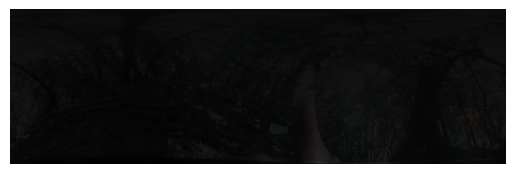

training..  2
train accuracy:  9.615384615384617
validating...


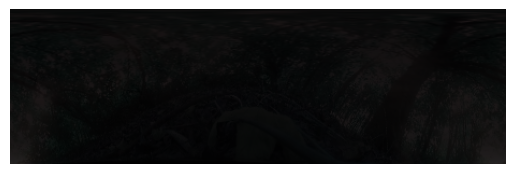

100%|████████████████████████████████████████████████| 2/2 [00:12<00:00,  6.13s/it]

validation accuracy:  9.090909090909092


7.12890625
 
 train Acc:  9.615384615384617
 
 val Acc:  9.090909090909092
 
 test Acc:  7.12890625


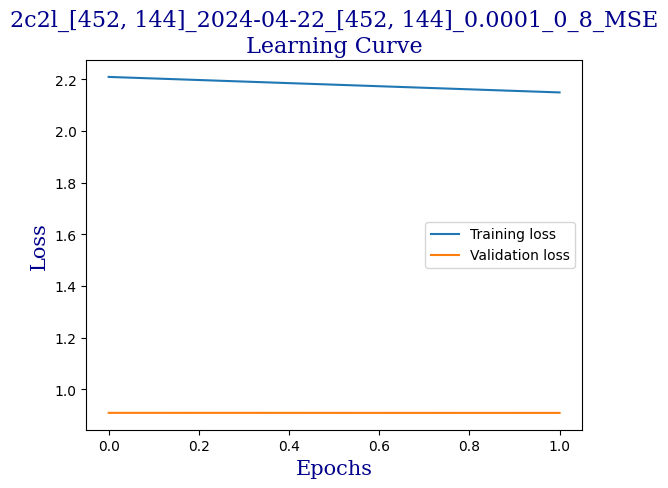

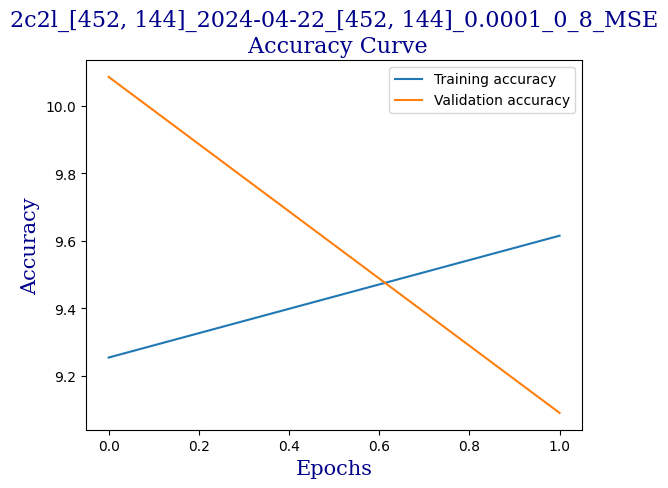

1024 1024
1024 1024


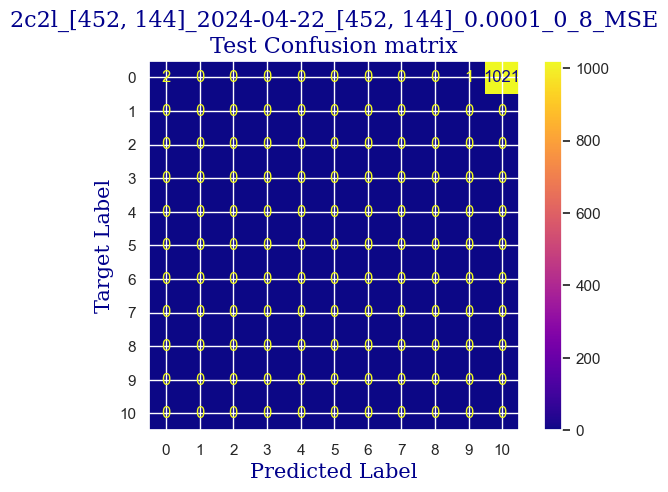

 
 END 2c2l [452, 144] Run Time:  243.306957158
Model:  2c2l  idx: 0 / 1
resolution:  [452, 144]  idx: 0 / 7
learning rate:  0.0001  idx: 0 / 2
weight decay:  0  idx: 0 / 2
scheduler:  0  idx: 0 / 1
seed:  8  idx: 0 / 2
loss function:  CrossEntropy  idx: 1 / 2
Batch size:  64
Training epochs:  2
start time:  255.792460792
243.35215543299998
Before model init - Current allocated memory (GB): 1.5920333862304688
After model init, Before data loading - Current allocated memory (GB): 1.9852643013000488
After data loading - Current allocated memory (GB): 1.9852643013000488


  0%|                                                        | 0/2 [00:00<?, ?it/s]

Training...


/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


training..  2
train accuracy:  9.795673076923077
validating...


 50%|████████████████████████                        | 1/2 [00:05<00:05,  5.88s/it]

validation accuracy:  9.943181818181818
Training...


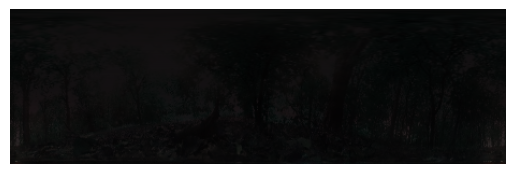

training..  2
train accuracy:  8.713942307692307
validating...


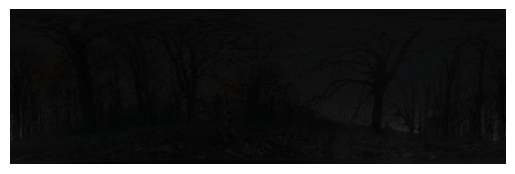

100%|████████████████████████████████████████████████| 2/2 [00:11<00:00,  5.96s/it]

validation accuracy:  9.517045454545455


9.375
 
 train Acc:  8.713942307692307
 
 val Acc:  9.517045454545455
 
 test Acc:  9.375


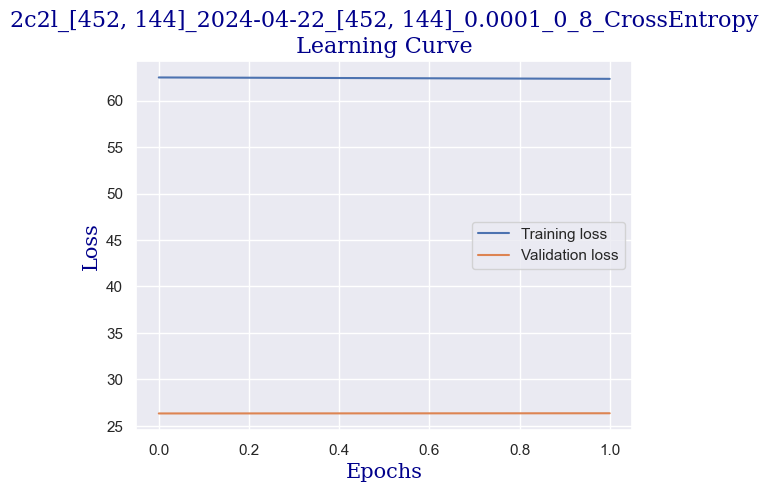

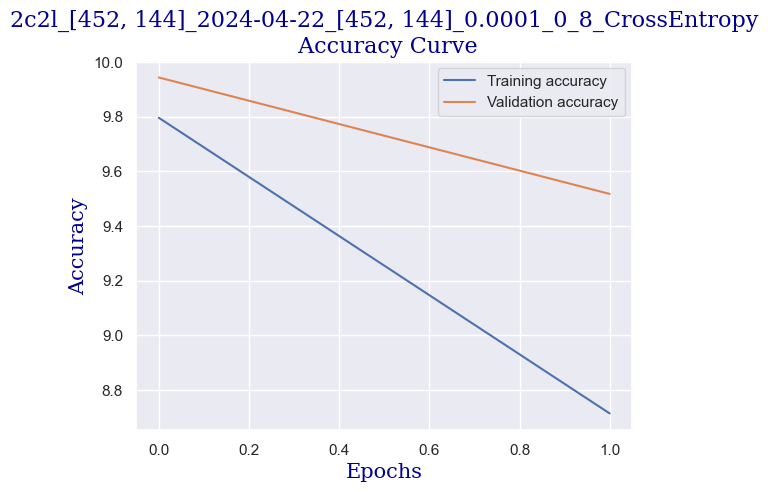

1024 1024
1024 1024


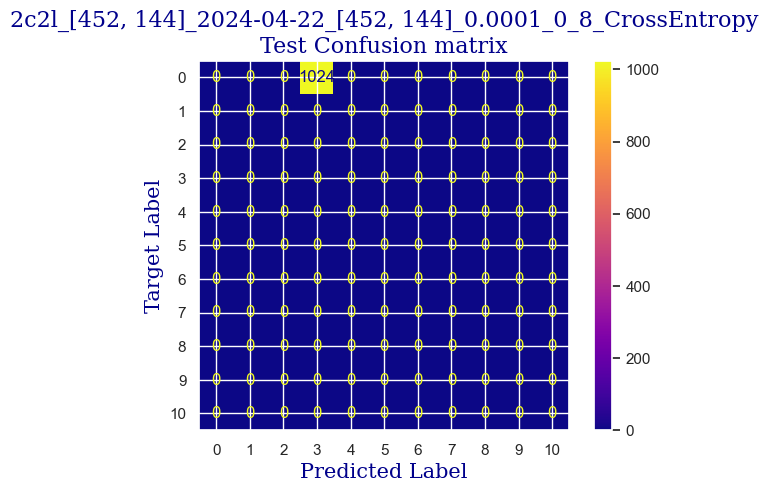

 
 END 2c2l [452, 144] Run Time:  235.10656369699998
Model:  2c2l  idx: 0 / 1
resolution:  [452, 144]  idx: 0 / 7
learning rate:  0.0001  idx: 0 / 2
weight decay:  0  idx: 0 / 2
scheduler:  0  idx: 0 / 1
seed:  2  idx: 1 / 2
loss function:  MSE  idx: 0 / 2
Batch size:  64
Training epochs:  2
start time:  490.936698909
478.49639051900004
Before model init - Current allocated memory (GB): 1.5920333862304688
After model init, Before data loading - Current allocated memory (GB): 1.9852643013000488
After data loading - Current allocated memory (GB): 1.9852643013000488


  0%|                                                        | 0/2 [00:00<?, ?it/s]

Training...


/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


training..  2
train accuracy:  8.653846153846153
validating...


 50%|████████████████████████                        | 1/2 [00:05<00:05,  5.99s/it]

validation accuracy:  8.948863636363637
Training...


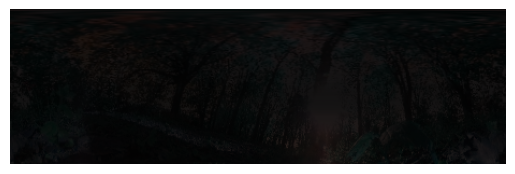

training..  2
train accuracy:  8.413461538461538
validating...


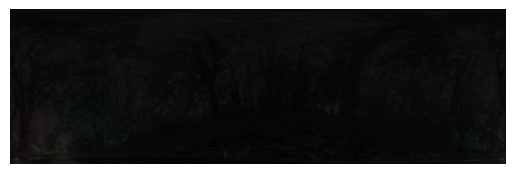

100%|████████████████████████████████████████████████| 2/2 [00:12<00:00,  6.03s/it]

validation accuracy:  8.806818181818182


9.1796875
 
 train Acc:  8.413461538461538
 
 val Acc:  8.806818181818182
 
 test Acc:  9.1796875


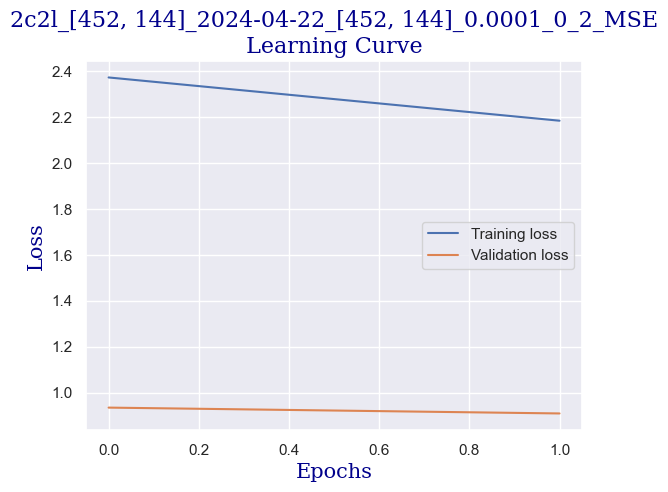

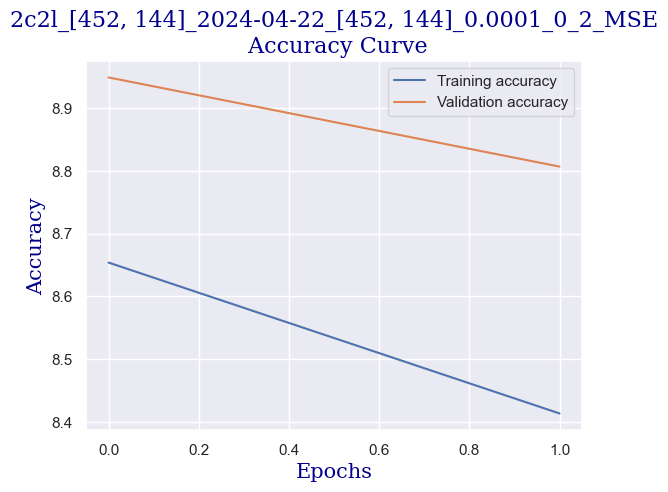

1024 1024
1024 1024


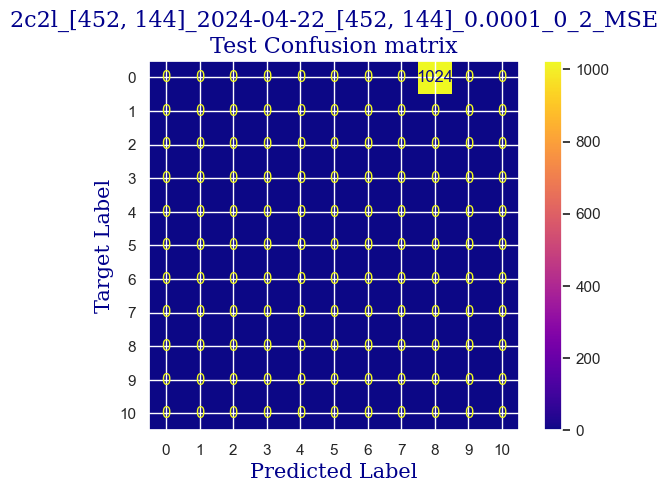

 
 END 2c2l [452, 144] Run Time:  238.50369907500004
Model:  2c2l  idx: 0 / 1
resolution:  [452, 144]  idx: 0 / 7
learning rate:  0.0001  idx: 0 / 2
weight decay:  0  idx: 0 / 2
scheduler:  0  idx: 0 / 1
seed:  2  idx: 1 / 2
loss function:  CrossEntropy  idx: 1 / 2
Batch size:  64
Training epochs:  2
start time:  729.476918933
717.036612626
Before model init - Current allocated memory (GB): 1.5920333862304688
After model init, Before data loading - Current allocated memory (GB): 1.9852643013000488
After data loading - Current allocated memory (GB): 1.9852643013000488


  0%|                                                        | 0/2 [00:00<?, ?it/s]

Training...


/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


training..  2
train accuracy:  8.774038461538462
validating...


 50%|████████████████████████                        | 1/2 [00:05<00:05,  5.91s/it]

validation accuracy:  8.522727272727272
Training...


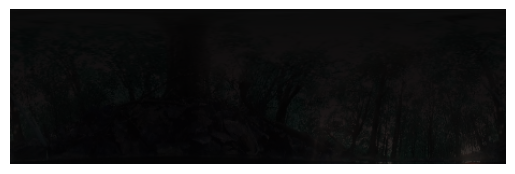

training..  2
train accuracy:  8.533653846153847
validating...


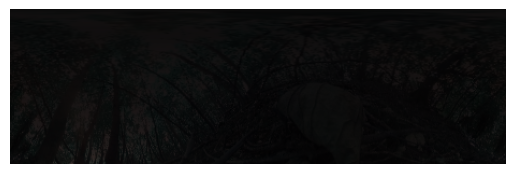

100%|████████████████████████████████████████████████| 2/2 [00:11<00:00,  6.00s/it]

validation accuracy:  8.238636363636363


8.7890625
 
 train Acc:  8.533653846153847
 
 val Acc:  8.238636363636363
 
 test Acc:  8.7890625


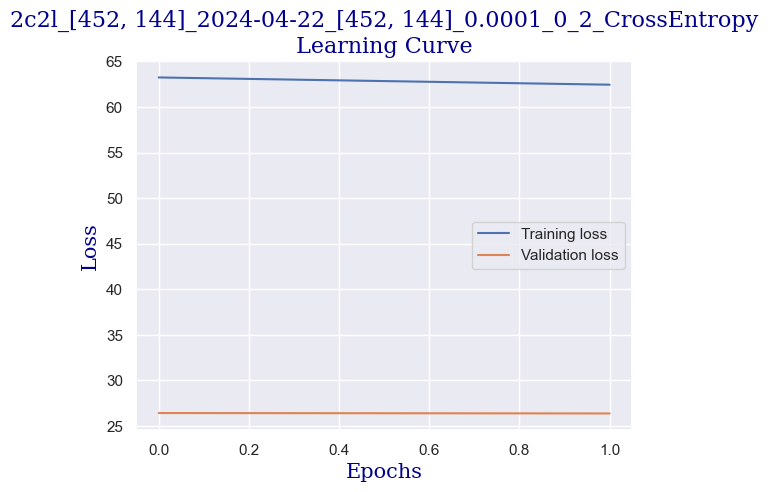

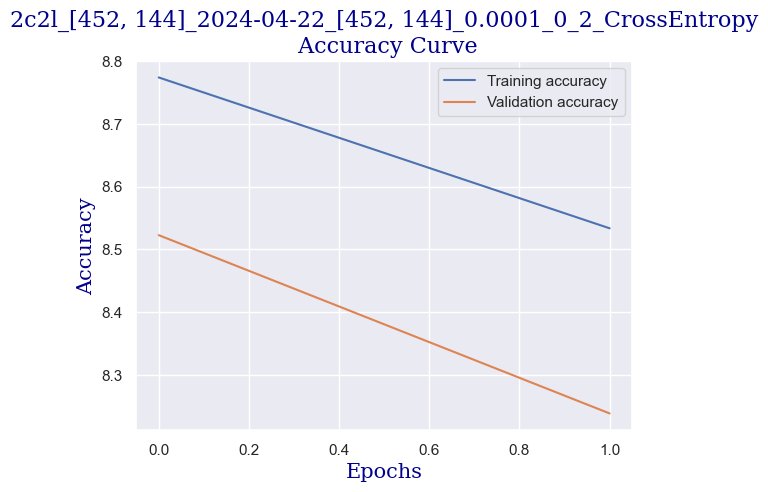

1024 1024
1024 1024


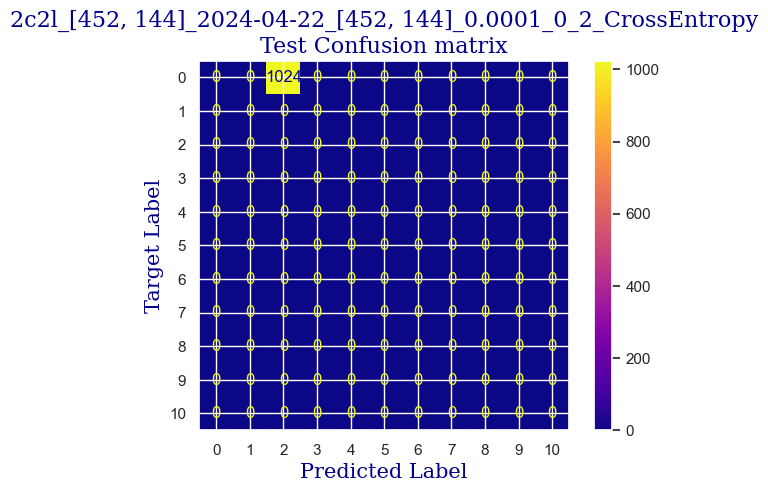

 
 END 2c2l [452, 144] Run Time:  236.74086254100007
Model:  2c2l  idx: 0 / 1
resolution:  [452, 144]  idx: 0 / 7
learning rate:  0.0001  idx: 0 / 2
weight decay:  4e-05  idx: 1 / 2
scheduler:  0  idx: 0 / 1
seed:  8  idx: 0 / 2
loss function:  MSE  idx: 0 / 2
Batch size:  64
Training epochs:  2
start time:  966.255271653
953.814963394
Before model init - Current allocated memory (GB): 1.5920333862304688
After model init, Before data loading - Current allocated memory (GB): 1.9852643013000488
After data loading - Current allocated memory (GB): 1.9852643013000488


  0%|                                                        | 0/2 [00:00<?, ?it/s]

Training...


/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


training..  2
train accuracy:  8.233173076923077
validating...


 50%|████████████████████████                        | 1/2 [00:05<00:05,  5.94s/it]

validation accuracy:  8.522727272727272
Training...


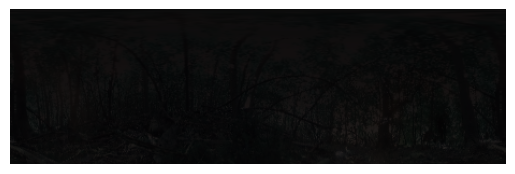

training..  2
train accuracy:  10.697115384615383
validating...


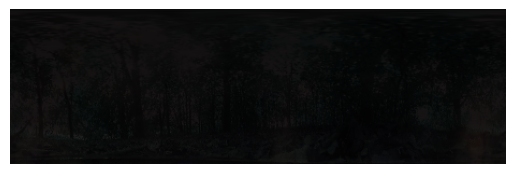

100%|████████████████████████████████████████████████| 2/2 [00:12<00:00,  6.00s/it]

validation accuracy:  8.806818181818182


9.1796875
 
 train Acc:  10.697115384615383
 
 val Acc:  8.806818181818182
 
 test Acc:  9.1796875


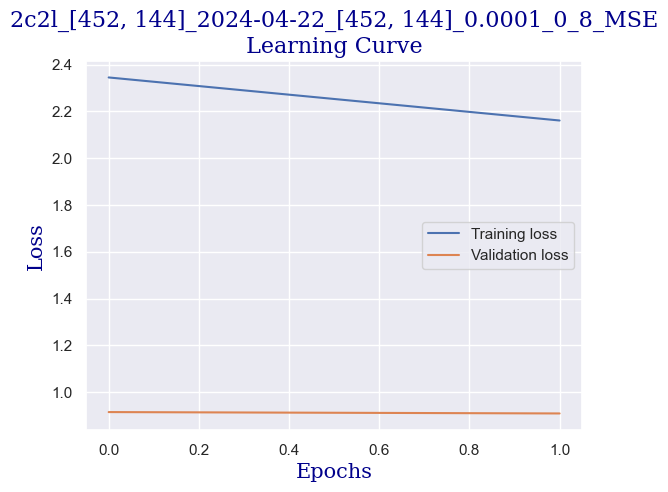

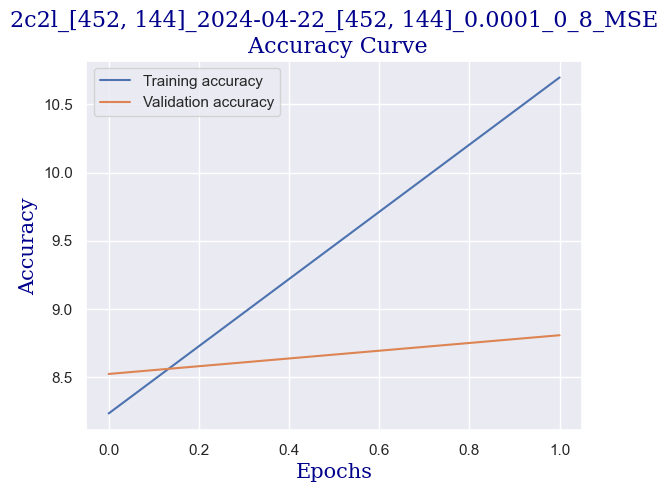

1024 1024
1024 1024


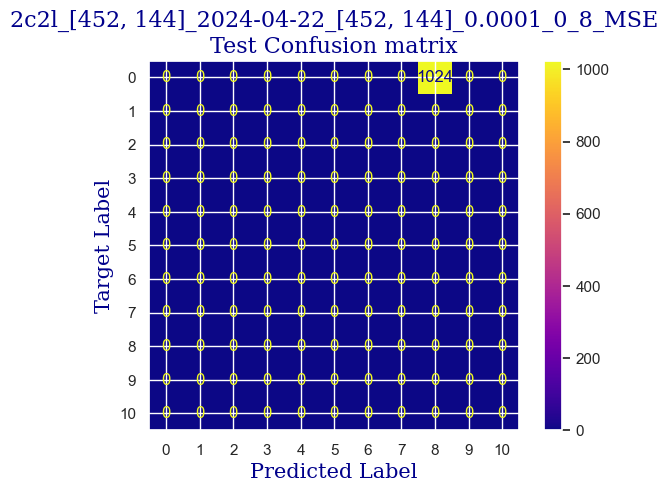

 
 END 2c2l [452, 144] Run Time:  237.426715102
Model:  2c2l  idx: 0 / 1
resolution:  [452, 144]  idx: 0 / 7
learning rate:  0.0001  idx: 0 / 2
weight decay:  4e-05  idx: 1 / 2
scheduler:  0  idx: 0 / 1
seed:  8  idx: 0 / 2
loss function:  CrossEntropy  idx: 1 / 2
Batch size:  64
Training epochs:  2
start time:  1203.713937654
1191.273630569
Before model init - Current allocated memory (GB): 1.5920333862304688
After model init, Before data loading - Current allocated memory (GB): 1.9852643013000488
After data loading - Current allocated memory (GB): 1.9852643013000488


  0%|                                                        | 0/2 [00:00<?, ?it/s]

Training...


/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


training..  2
train accuracy:  9.735576923076923
validating...


 50%|████████████████████████                        | 1/2 [00:05<00:05,  6.00s/it]

validation accuracy:  9.375
Training...


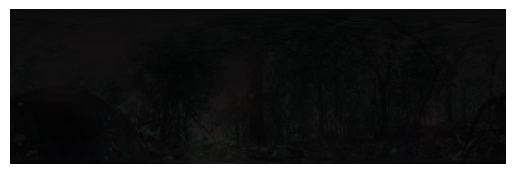

training..  2
train accuracy:  9.435096153846153
validating...


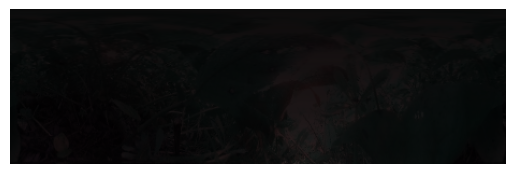

100%|████████████████████████████████████████████████| 2/2 [00:12<00:00,  6.06s/it]

validation accuracy:  8.238636363636363


8.69140625
 
 train Acc:  9.435096153846153
 
 val Acc:  8.238636363636363
 
 test Acc:  8.69140625


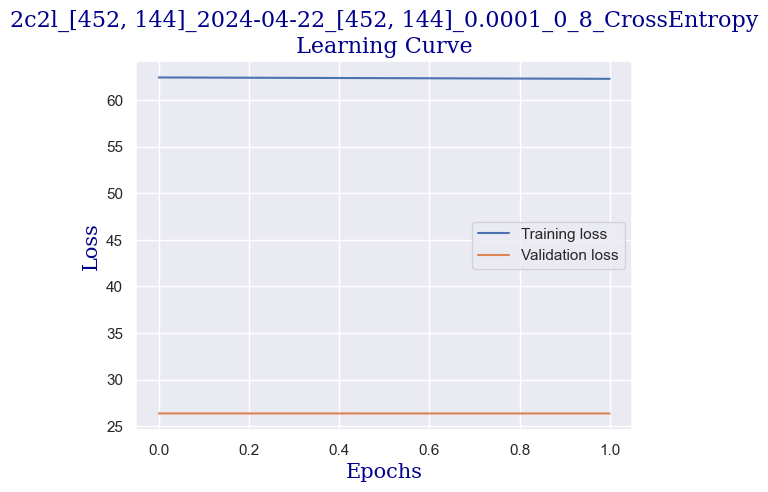

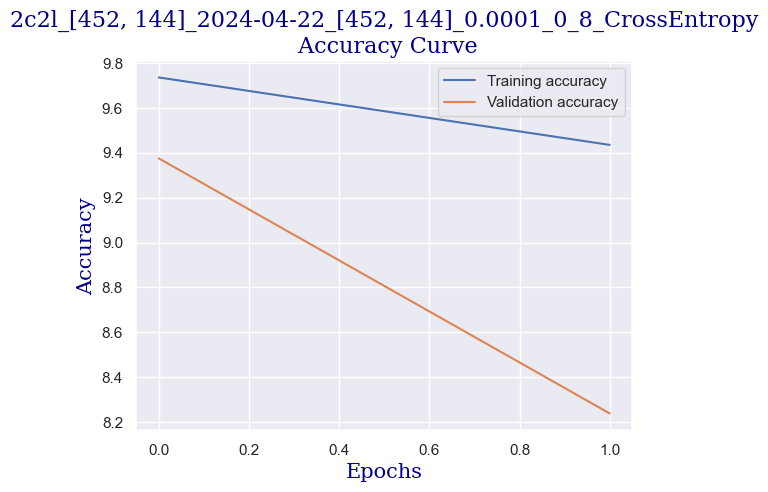

1024 1024
1024 1024


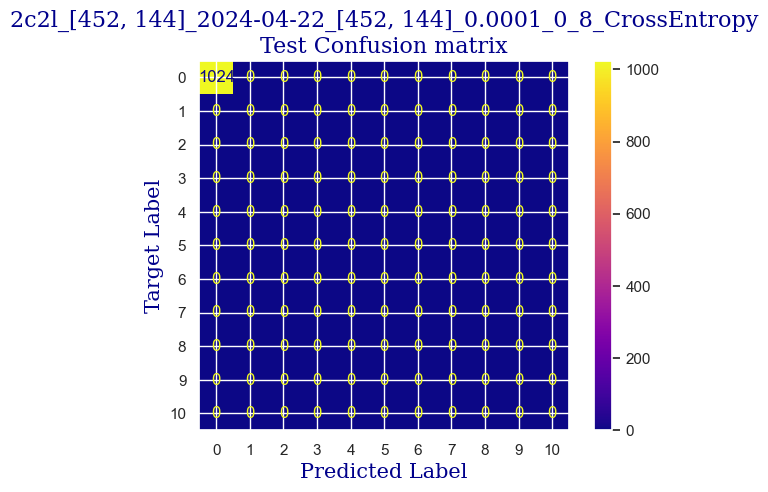

 
 END 2c2l [452, 144] Run Time:  240.43999244600013
Model:  2c2l  idx: 0 / 1
resolution:  [452, 144]  idx: 0 / 7
learning rate:  0.0001  idx: 0 / 2
weight decay:  4e-05  idx: 1 / 2
scheduler:  0  idx: 0 / 1
seed:  2  idx: 1 / 2
loss function:  MSE  idx: 0 / 2
Batch size:  64
Training epochs:  2
start time:  1444.18685635
1431.746547902
Before model init - Current allocated memory (GB): 1.5920333862304688
After model init, Before data loading - Current allocated memory (GB): 1.9852643013000488
After data loading - Current allocated memory (GB): 1.9852643013000488


  0%|                                                        | 0/2 [00:00<?, ?it/s]

Training...


/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


training..  2
train accuracy:  9.435096153846153
validating...


 50%|████████████████████████                        | 1/2 [00:06<00:06,  6.00s/it]

validation accuracy:  9.943181818181818
Training...


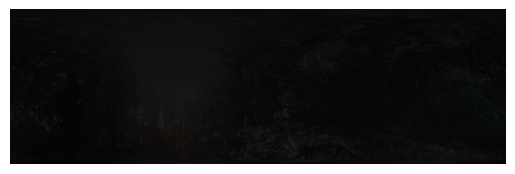

training..  2
train accuracy:  8.11298076923077
validating...


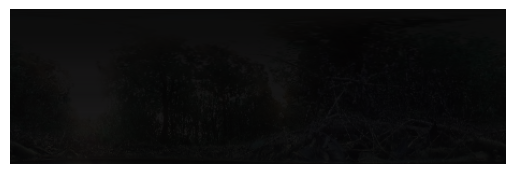

100%|████████████████████████████████████████████████| 2/2 [00:12<00:00,  6.07s/it]

validation accuracy:  9.943181818181818


10.15625
 
 train Acc:  8.11298076923077
 
 val Acc:  9.943181818181818
 
 test Acc:  10.15625


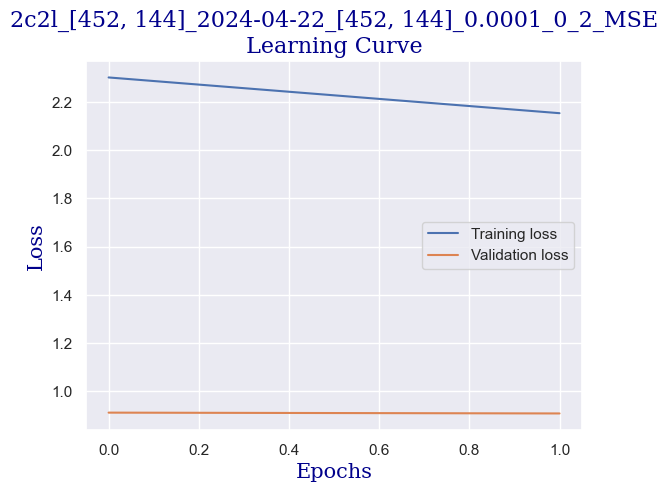

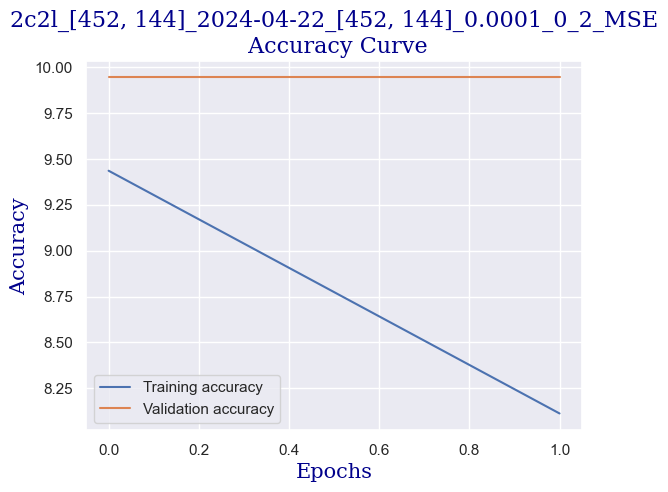

1024 1024
1024 1024


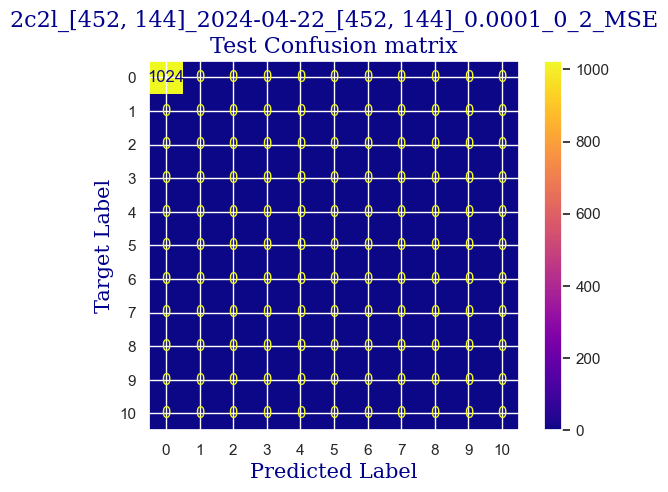

 
 END 2c2l [452, 144] Run Time:  239.86450760799994
Model:  2c2l  idx: 0 / 1
resolution:  [452, 144]  idx: 0 / 7
learning rate:  0.0001  idx: 0 / 2
weight decay:  4e-05  idx: 1 / 2
scheduler:  0  idx: 0 / 1
seed:  2  idx: 1 / 2
loss function:  CrossEntropy  idx: 1 / 2
Batch size:  64
Training epochs:  2
start time:  1684.085737098
1671.64543089
Before model init - Current allocated memory (GB): 1.5920333862304688
After model init, Before data loading - Current allocated memory (GB): 1.9852643013000488
After data loading - Current allocated memory (GB): 1.9852643013000488


  0%|                                                        | 0/2 [00:00<?, ?it/s]

Training...


/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


training..  2
train accuracy:  8.774038461538462
validating...


 50%|████████████████████████                        | 1/2 [00:05<00:05,  5.92s/it]

validation accuracy:  9.659090909090908
Training...


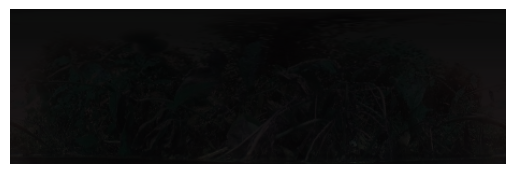

training..  2
train accuracy:  9.975961538461538
validating...


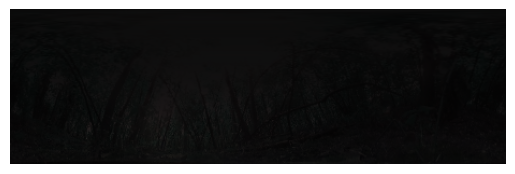

100%|████████████████████████████████████████████████| 2/2 [00:11<00:00,  5.98s/it]

validation accuracy:  8.522727272727272


8.88671875
 
 train Acc:  9.975961538461538
 
 val Acc:  8.522727272727272
 
 test Acc:  8.88671875


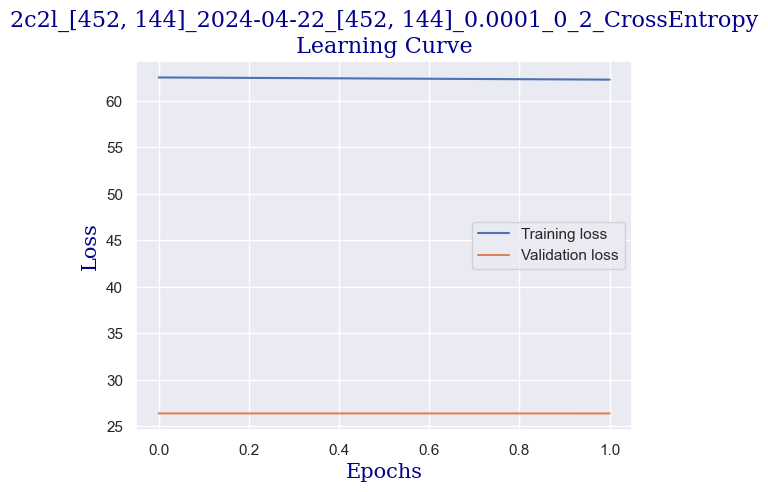

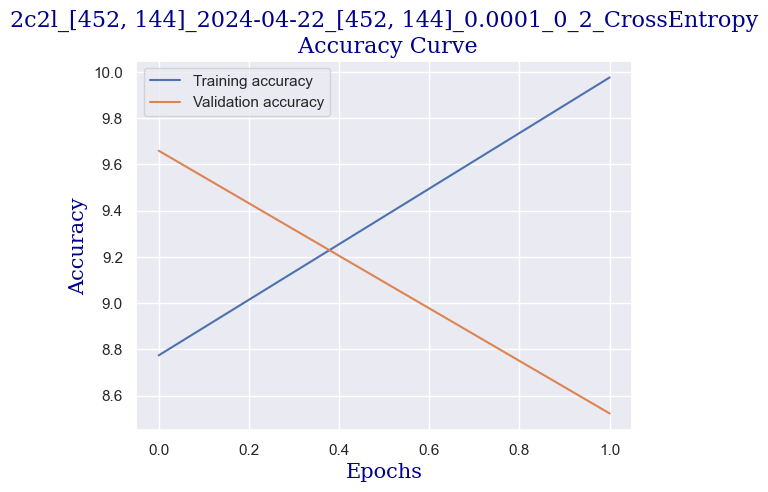

1024 1024
1024 1024


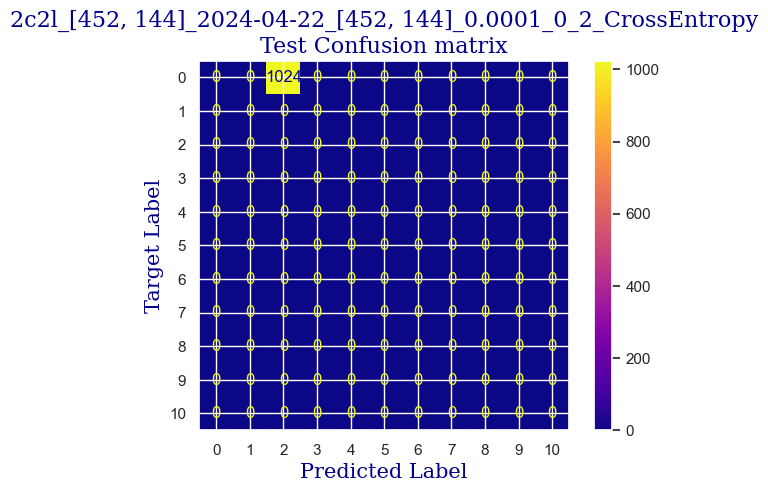

 
 END 2c2l [452, 144] Run Time:  236.03551539
Model:  2c2l  idx: 0 / 1
resolution:  [452, 144]  idx: 0 / 7
learning rate:  6e-05  idx: 1 / 2
weight decay:  0  idx: 0 / 2
scheduler:  0  idx: 0 / 1
seed:  8  idx: 0 / 2
loss function:  MSE  idx: 0 / 2
Batch size:  64
Training epochs:  2
start time:  1920.154593669
1907.714284106
Before model init - Current allocated memory (GB): 1.5920333862304688
After model init, Before data loading - Current allocated memory (GB): 1.9852643013000488
After data loading - Current allocated memory (GB): 1.9852643013000488


  0%|                                                        | 0/2 [00:00<?, ?it/s]

Training...


/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


training..  2
train accuracy:  9.375
validating...


 50%|████████████████████████                        | 1/2 [00:05<00:05,  5.91s/it]

validation accuracy:  8.664772727272728
Training...


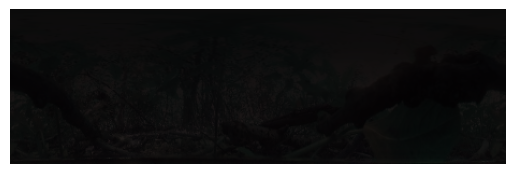

training..  2
train accuracy:  8.052884615384617
validating...


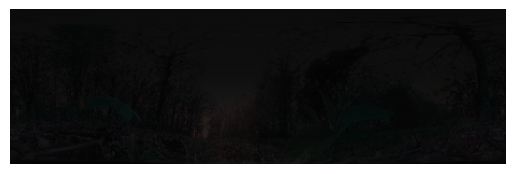

100%|████████████████████████████████████████████████| 2/2 [00:11<00:00,  5.99s/it]

validation accuracy:  6.8181818181818175


7.8125
 
 train Acc:  8.052884615384617
 
 val Acc:  6.8181818181818175
 
 test Acc:  7.8125


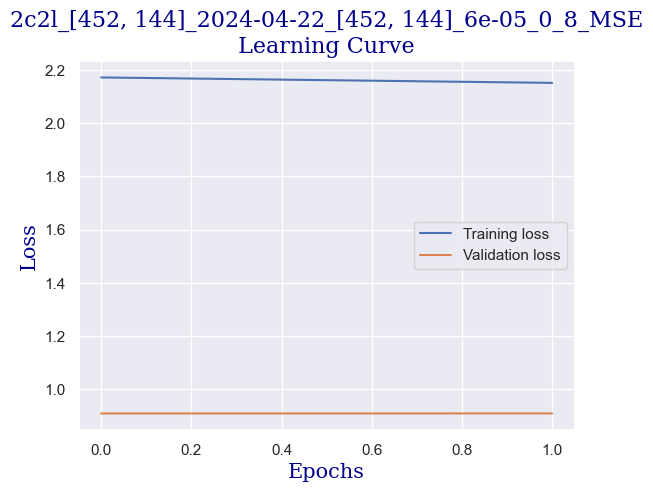

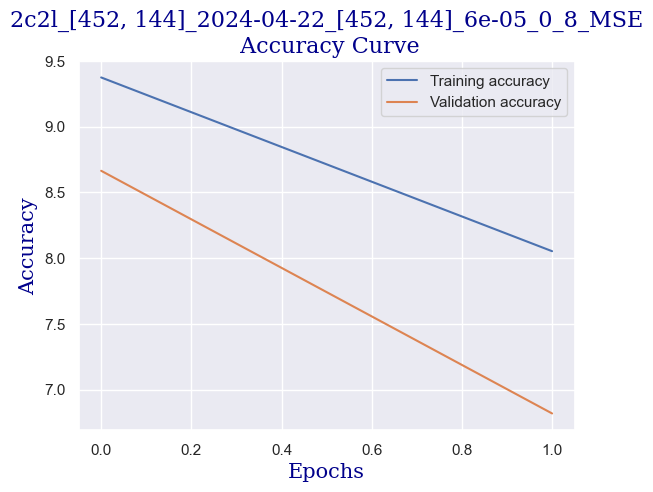

1024 1024
1024 1024


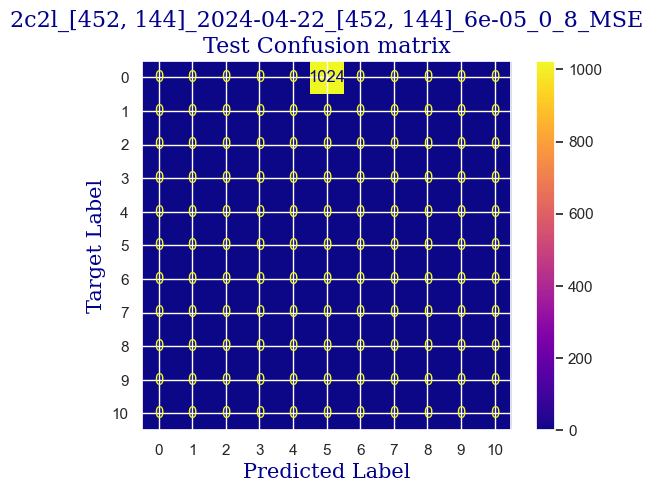

 
 END 2c2l [452, 144] Run Time:  236.15910588799989
Model:  2c2l  idx: 0 / 1
resolution:  [452, 144]  idx: 0 / 7
learning rate:  6e-05  idx: 1 / 2
weight decay:  0  idx: 0 / 2
scheduler:  0  idx: 0 / 1
seed:  8  idx: 0 / 2
loss function:  CrossEntropy  idx: 1 / 2
Batch size:  64
Training epochs:  2
start time:  2156.349142643
2143.908833978
Before model init - Current allocated memory (GB): 1.5920333862304688
After model init, Before data loading - Current allocated memory (GB): 1.9852643013000488
After data loading - Current allocated memory (GB): 1.9852643013000488


  0%|                                                        | 0/2 [00:00<?, ?it/s]

Training...


/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


training..  2
train accuracy:  8.713942307692307
validating...


 50%|████████████████████████                        | 1/2 [00:05<00:05,  5.91s/it]

validation accuracy:  10.511363636363637
Training...


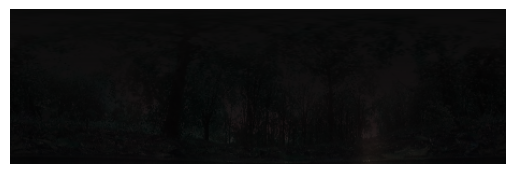

training..  2
train accuracy:  9.07451923076923
validating...


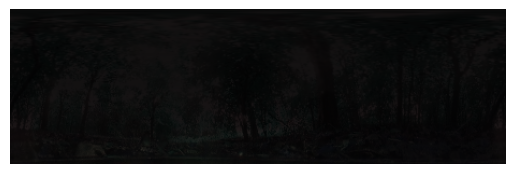

100%|████████████████████████████████████████████████| 2/2 [00:11<00:00,  5.98s/it]

validation accuracy:  9.517045454545455


9.5703125
 
 train Acc:  9.07451923076923
 
 val Acc:  9.517045454545455
 
 test Acc:  9.5703125


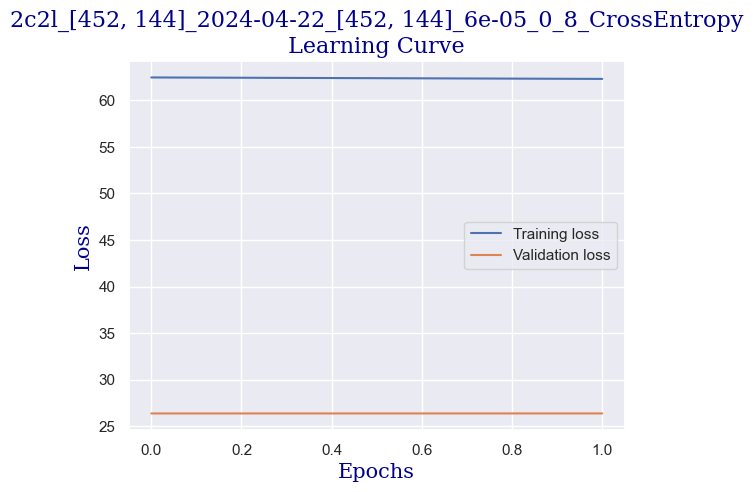

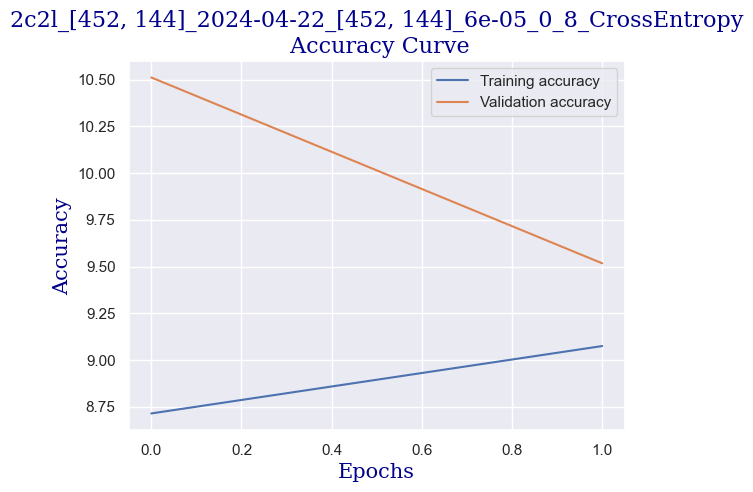

1024 1024
1024 1024


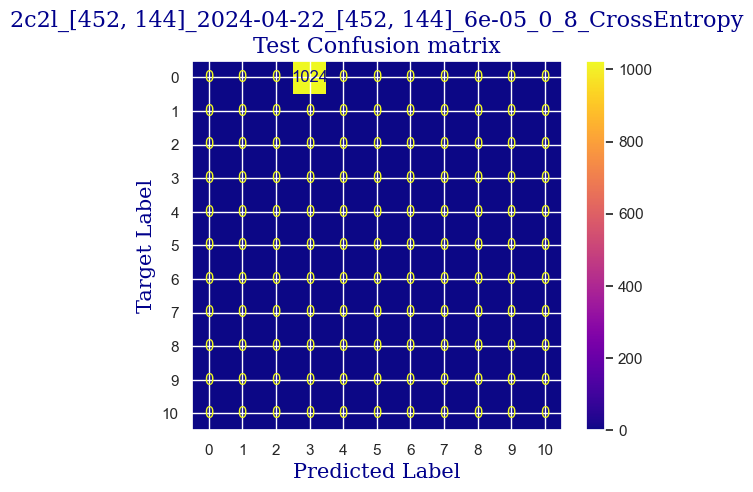

 
 END 2c2l [452, 144] Run Time:  236.38697610600002
Model:  2c2l  idx: 0 / 1
resolution:  [452, 144]  idx: 0 / 7
learning rate:  6e-05  idx: 1 / 2
weight decay:  0  idx: 0 / 2
scheduler:  0  idx: 0 / 1
seed:  2  idx: 1 / 2
loss function:  MSE  idx: 0 / 2
Batch size:  64
Training epochs:  2
start time:  2392.769689206
2380.329380998
Before model init - Current allocated memory (GB): 1.5920333862304688
After model init, Before data loading - Current allocated memory (GB): 1.9852643013000488
After data loading - Current allocated memory (GB): 1.9852643013000488


  0%|                                                        | 0/2 [00:00<?, ?it/s]

Training...


/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


training..  2
train accuracy:  9.254807692307693
validating...


 50%|████████████████████████                        | 1/2 [00:05<00:05,  5.93s/it]

validation accuracy:  8.522727272727272
Training...


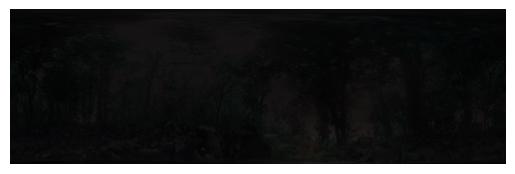

training..  2
train accuracy:  9.375
validating...


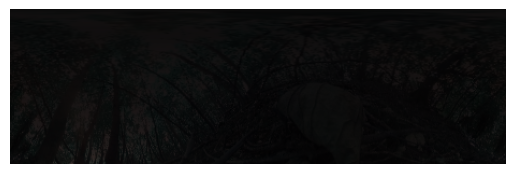

100%|████████████████████████████████████████████████| 2/2 [00:11<00:00,  5.98s/it]

validation accuracy:  8.380681818181818


9.08203125
 
 train Acc:  9.375
 
 val Acc:  8.380681818181818
 
 test Acc:  9.08203125


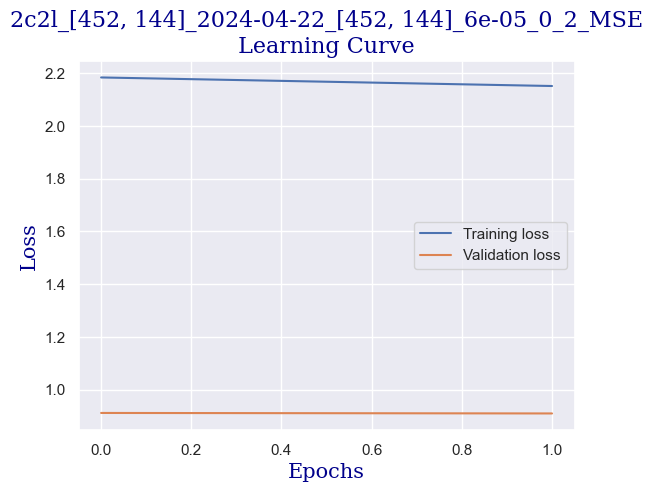

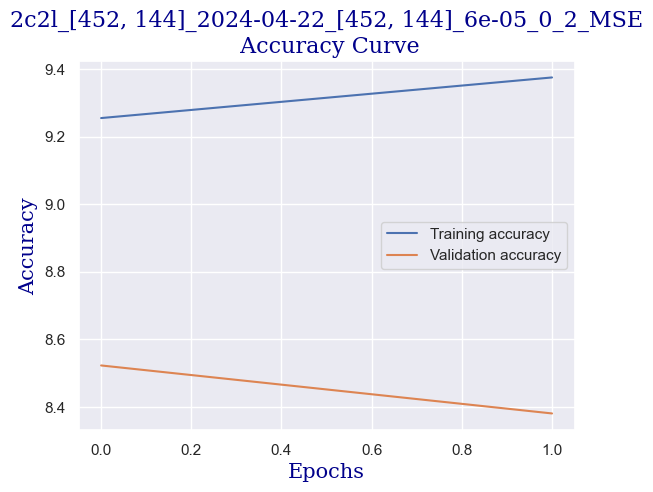

1024 1024
1024 1024


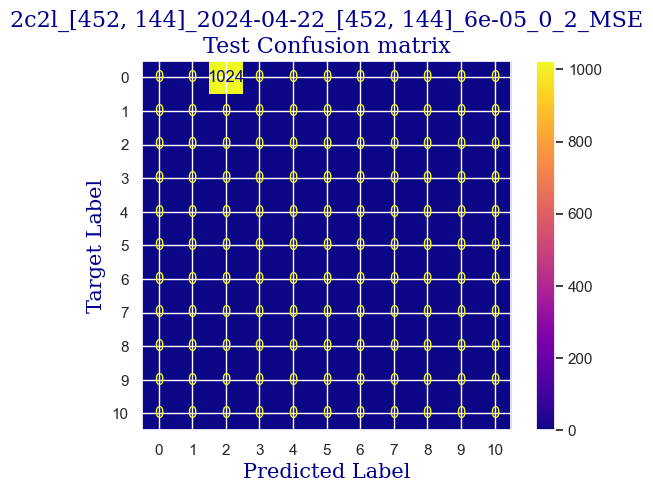

 
 END 2c2l [452, 144] Run Time:  236.31146185100033
Model:  2c2l  idx: 0 / 1
resolution:  [452, 144]  idx: 0 / 7
learning rate:  6e-05  idx: 1 / 2
weight decay:  0  idx: 0 / 2
scheduler:  0  idx: 0 / 1
seed:  2  idx: 1 / 2
loss function:  CrossEntropy  idx: 1 / 2
Batch size:  64
Training epochs:  2
start time:  2629.11453113
2616.6742208250002
Before model init - Current allocated memory (GB): 1.5920333862304688
After model init, Before data loading - Current allocated memory (GB): 1.9852643013000488
After data loading - Current allocated memory (GB): 1.9852643013000488


  0%|                                                        | 0/2 [00:00<?, ?it/s]

Training...


/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


training..  2
train accuracy:  9.975961538461538
validating...


 50%|████████████████████████                        | 1/2 [00:05<00:05,  5.96s/it]

validation accuracy:  9.943181818181818
Training...


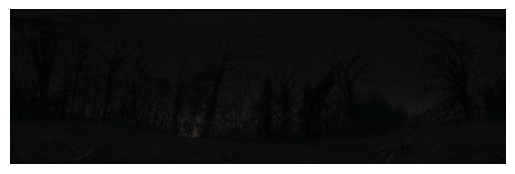

training..  2
train accuracy:  10.63701923076923
validating...


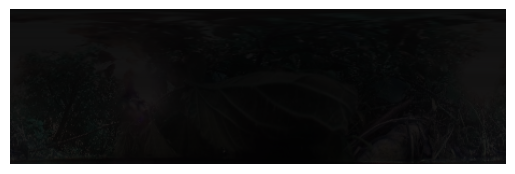

100%|████████████████████████████████████████████████| 2/2 [00:12<00:00,  6.02s/it]

validation accuracy:  8.522727272727272


9.1796875
 
 train Acc:  10.63701923076923
 
 val Acc:  8.522727272727272
 
 test Acc:  9.1796875


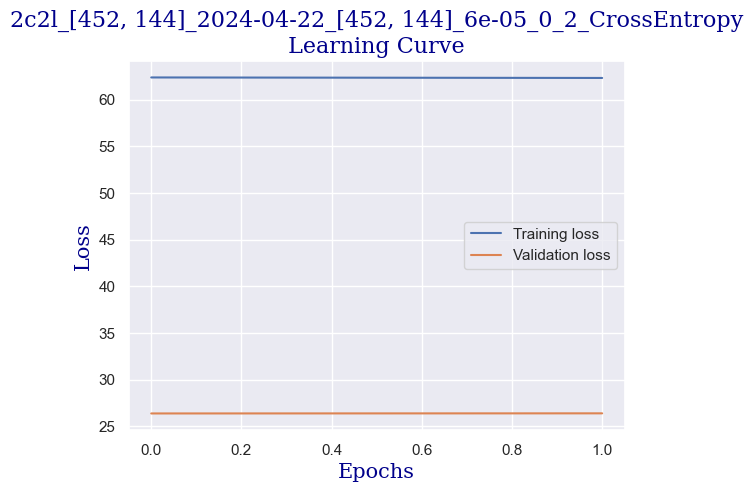

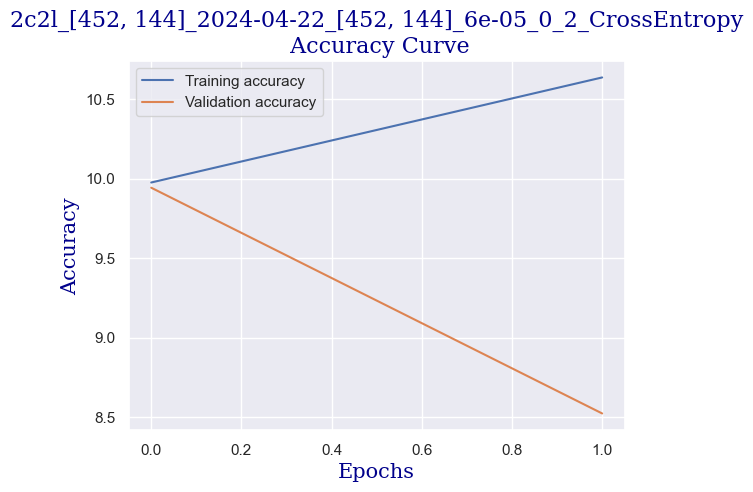

1024 1024
1024 1024


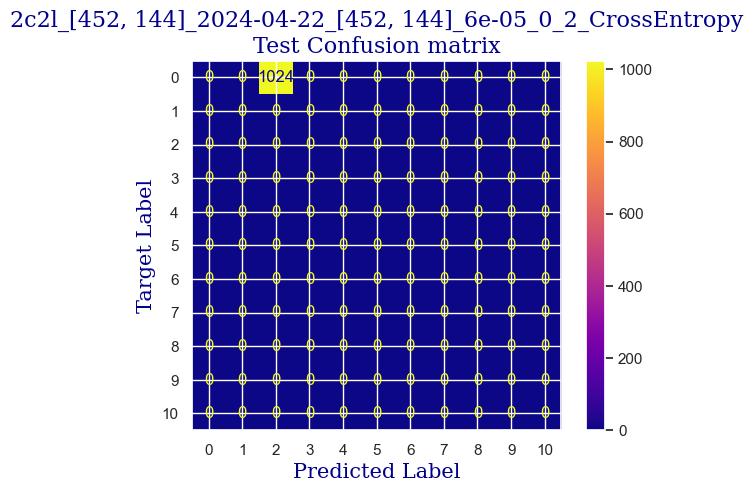

 
 END 2c2l [452, 144] Run Time:  238.10516969299988
Model:  2c2l  idx: 0 / 1
resolution:  [452, 144]  idx: 0 / 7
learning rate:  6e-05  idx: 1 / 2
weight decay:  4e-05  idx: 1 / 2
scheduler:  0  idx: 0 / 1
seed:  8  idx: 0 / 2
loss function:  MSE  idx: 0 / 2
Batch size:  64
Training epochs:  2
start time:  2867.251296649
2854.810987234
Before model init - Current allocated memory (GB): 1.5920333862304688
After model init, Before data loading - Current allocated memory (GB): 1.9852643013000488
After data loading - Current allocated memory (GB): 1.9852643013000488


  0%|                                                        | 0/2 [00:00<?, ?it/s]

Training...


/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


training..  2
train accuracy:  9.495192307692307
validating...


 50%|████████████████████████                        | 1/2 [00:05<00:05,  5.89s/it]

validation accuracy:  9.517045454545455
Training...


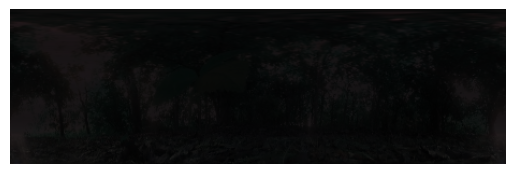

training..  2
train accuracy:  8.774038461538462
validating...


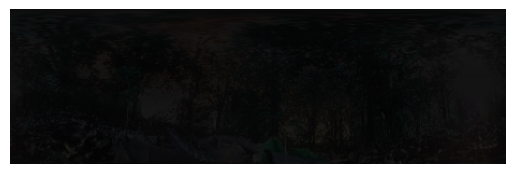

100%|████████████████████████████████████████████████| 2/2 [00:11<00:00,  5.96s/it]

validation accuracy:  9.801136363636363


12.5
 
 train Acc:  8.774038461538462
 
 val Acc:  9.801136363636363
 
 test Acc:  12.5


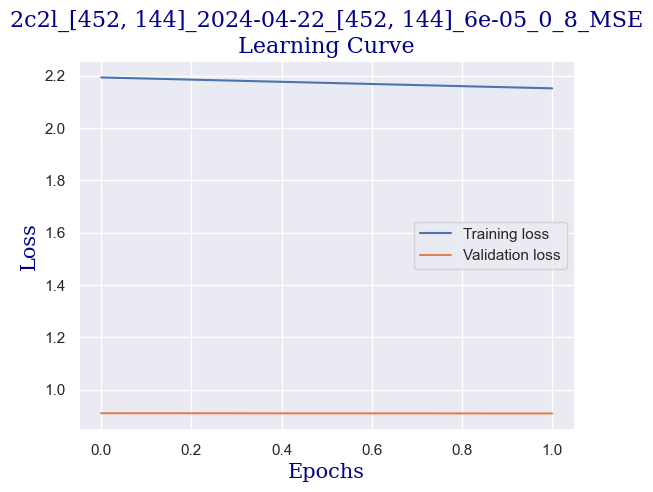

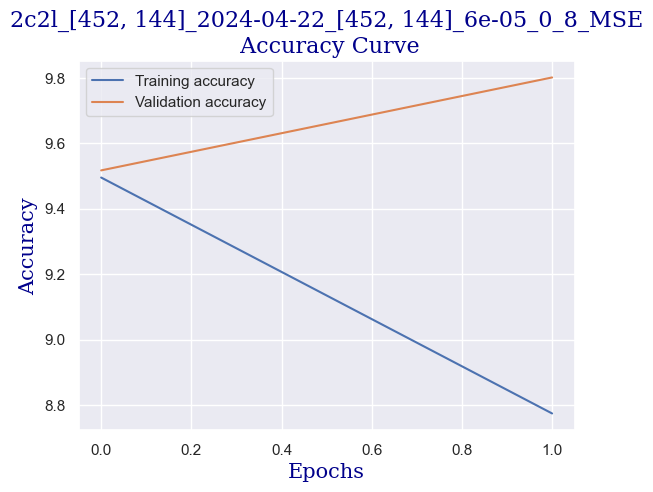

1024 1024
1024 1024


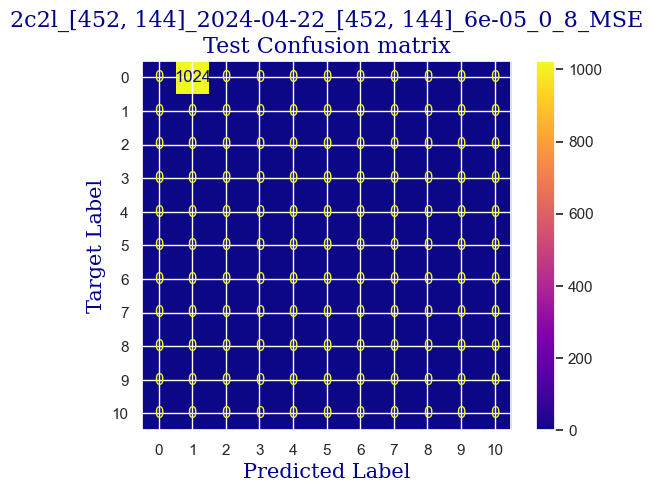

 
 END 2c2l [452, 144] Run Time:  235.29335505900008
Model:  2c2l  idx: 0 / 1
resolution:  [452, 144]  idx: 0 / 7
learning rate:  6e-05  idx: 1 / 2
weight decay:  4e-05  idx: 1 / 2
scheduler:  0  idx: 0 / 1
seed:  8  idx: 0 / 2
loss function:  CrossEntropy  idx: 1 / 2
Batch size:  64
Training epochs:  2
start time:  3102.577929753
3090.1376217240004
Before model init - Current allocated memory (GB): 1.5920333862304688
After model init, Before data loading - Current allocated memory (GB): 1.9852643013000488
After data loading - Current allocated memory (GB): 1.9852643013000488


  0%|                                                        | 0/2 [00:00<?, ?it/s]

Training...


/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


training..  2
train accuracy:  8.834134615384617
validating...


 50%|████████████████████████                        | 1/2 [00:05<00:05,  5.89s/it]

validation accuracy:  9.090909090909092
Training...


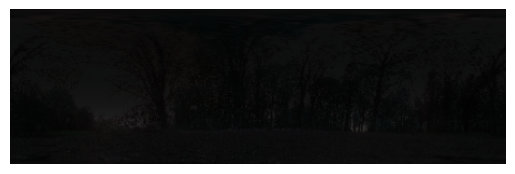

training..  2
train accuracy:  10.276442307692307
validating...


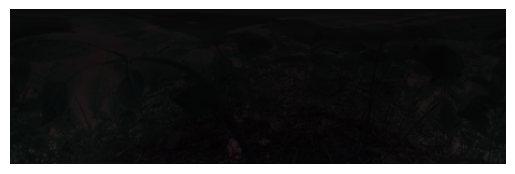

100%|████████████████████████████████████████████████| 2/2 [00:11<00:00,  5.97s/it]

validation accuracy:  8.948863636363637


9.5703125
 
 train Acc:  10.276442307692307
 
 val Acc:  8.948863636363637
 
 test Acc:  9.5703125


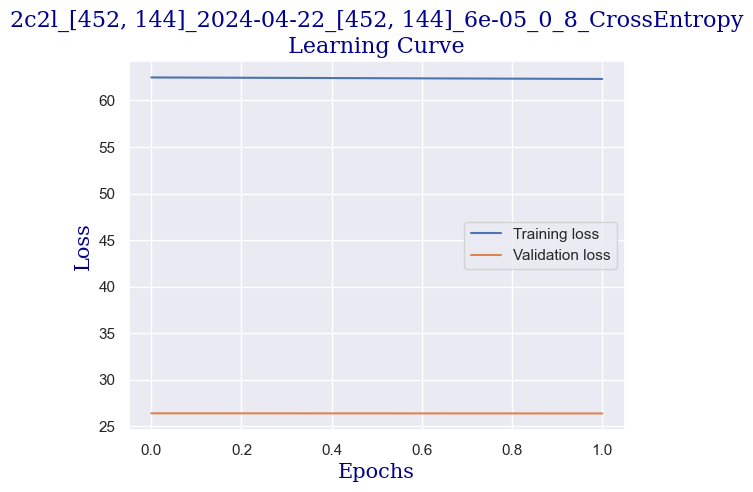

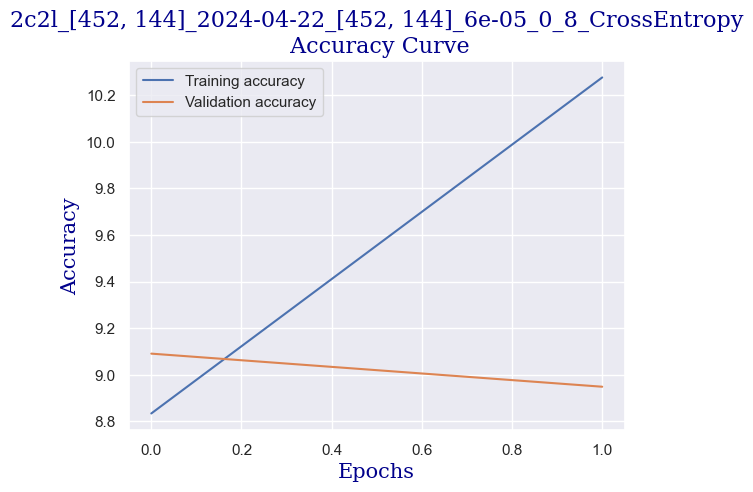

1024 1024
1024 1024


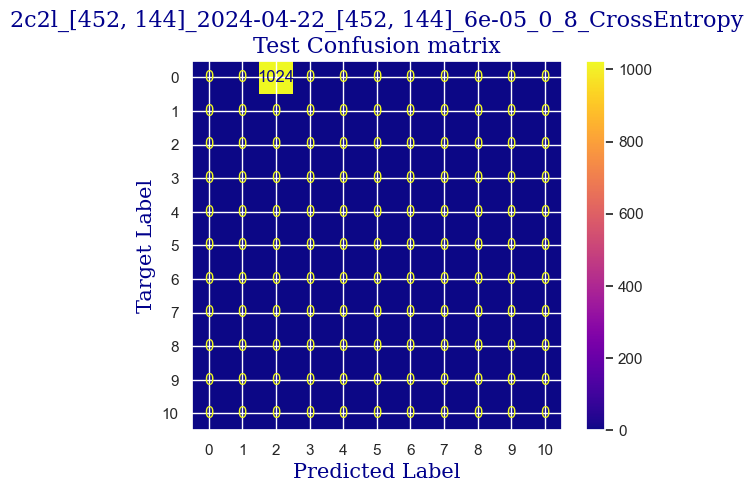

 
 END 2c2l [452, 144] Run Time:  235.68258147300003
Model:  2c2l  idx: 0 / 1
resolution:  [452, 144]  idx: 0 / 7
learning rate:  6e-05  idx: 1 / 2
weight decay:  4e-05  idx: 1 / 2
scheduler:  0  idx: 0 / 1
seed:  2  idx: 1 / 2
loss function:  MSE  idx: 0 / 2
Batch size:  64
Training epochs:  2
start time:  3338.293793142
3325.8534830860003
Before model init - Current allocated memory (GB): 1.5920333862304688
After model init, Before data loading - Current allocated memory (GB): 1.9852643013000488
After data loading - Current allocated memory (GB): 1.9852643013000488


  0%|                                                        | 0/2 [00:00<?, ?it/s]

Training...


/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


training..  2
train accuracy:  9.795673076923077
validating...


 50%|████████████████████████                        | 1/2 [00:05<00:05,  5.88s/it]

validation accuracy:  8.522727272727272
Training...


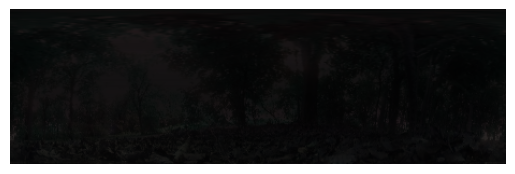

training..  2
train accuracy:  9.435096153846153
validating...


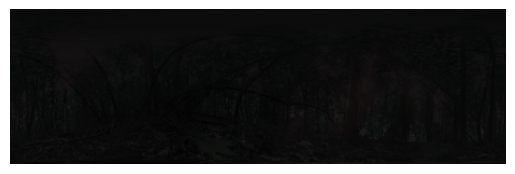

100%|████████████████████████████████████████████████| 2/2 [00:11<00:00,  5.94s/it]

validation accuracy:  9.943181818181818


10.25390625
 
 train Acc:  9.435096153846153
 
 val Acc:  9.943181818181818
 
 test Acc:  10.25390625


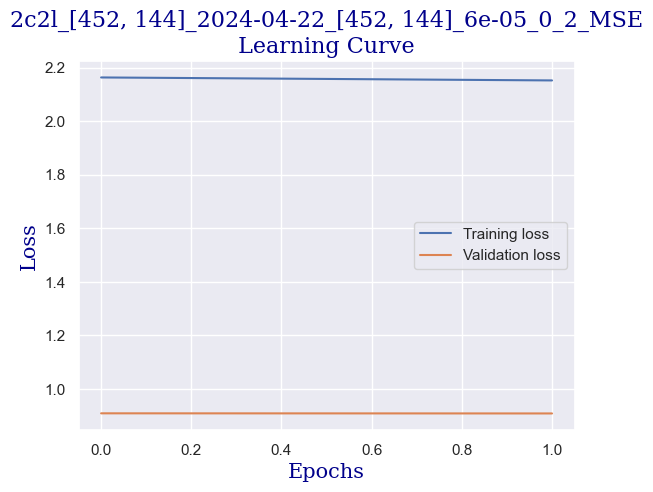

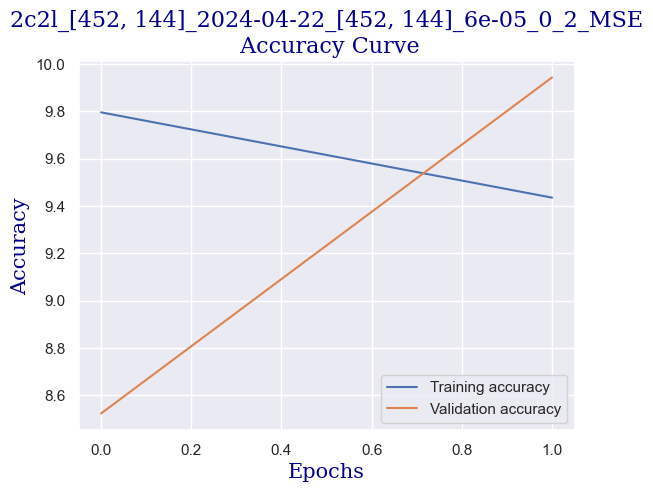

1024 1024
1024 1024


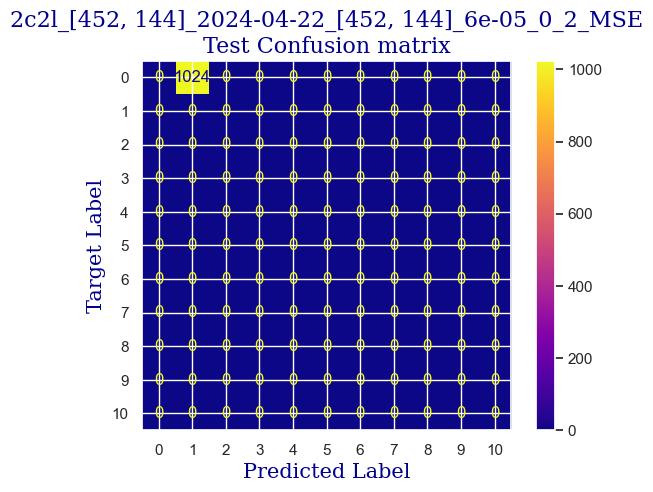

 
 END 2c2l [452, 144] Run Time:  234.30737532400008
Model:  2c2l  idx: 0 / 1
resolution:  [452, 144]  idx: 0 / 7
learning rate:  6e-05  idx: 1 / 2
weight decay:  4e-05  idx: 1 / 2
scheduler:  0  idx: 0 / 1
seed:  2  idx: 1 / 2
loss function:  CrossEntropy  idx: 1 / 2
Batch size:  64
Training epochs:  2
start time:  3572.63344294
3560.193134305
Before model init - Current allocated memory (GB): 1.5920333862304688
After model init, Before data loading - Current allocated memory (GB): 1.9852643013000488
After data loading - Current allocated memory (GB): 1.9852643013000488


  0%|                                                        | 0/2 [00:00<?, ?it/s]

Training...


/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


training..  2
train accuracy:  9.194711538461538
validating...


 50%|████████████████████████                        | 1/2 [00:05<00:05,  5.90s/it]

validation accuracy:  8.806818181818182
Training...


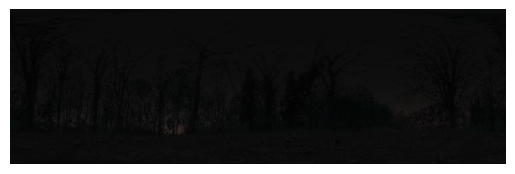

training..  2
train accuracy:  11.778846153846153
validating...


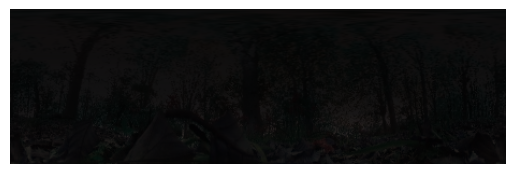

100%|████████████████████████████████████████████████| 2/2 [00:11<00:00,  5.97s/it]

validation accuracy:  8.380681818181818


8.984375
 
 train Acc:  11.778846153846153
 
 val Acc:  8.380681818181818
 
 test Acc:  8.984375


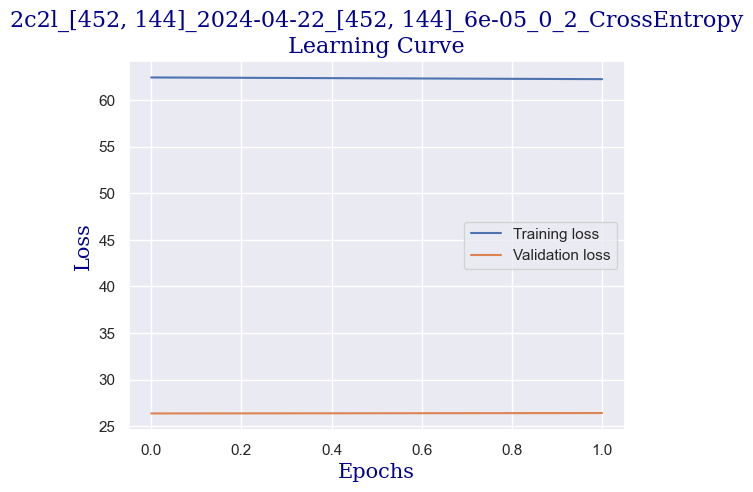

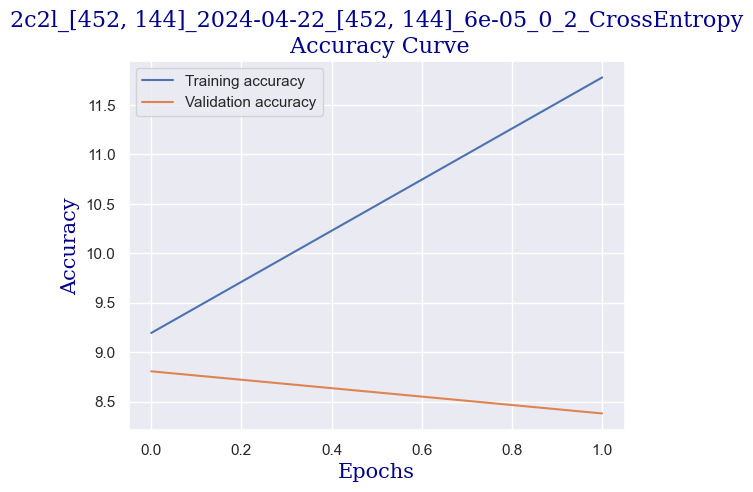

1024 1024
1024 1024


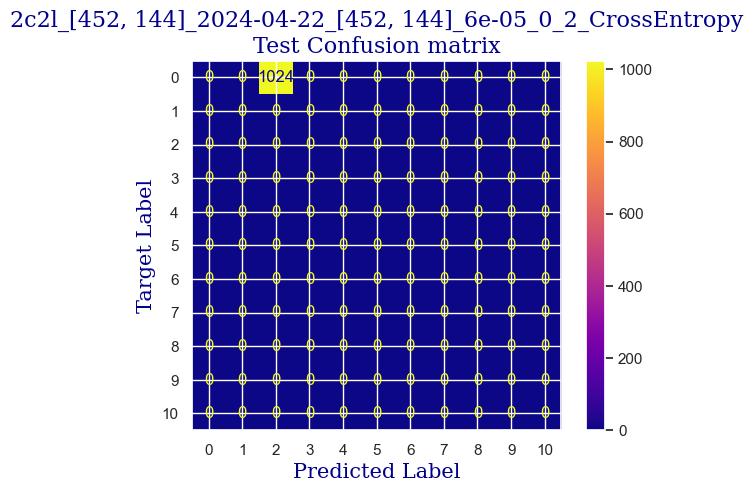

 
 END 2c2l [452, 144] Run Time:  235.987052813
lin lay 267264
Model:  2c2l  idx: 0 / 1
resolution:  [226, 72]  idx: 1 / 7
learning rate:  0.0001  idx: 0 / 2
weight decay:  0  idx: 0 / 2
scheduler:  0  idx: 0 / 1
seed:  8  idx: 0 / 2
loss function:  MSE  idx: 0 / 2
Batch size:  64
Training epochs:  2
start time:  3808.654991233
3796.2146820000003
Before model init - Current allocated memory (GB): 1.5920333862304688
After model init, Before data loading - Current allocated memory (GB): 1.691723346710205
After data loading - Current allocated memory (GB): 1.691723346710205


  0%|                                                        | 0/2 [00:00<?, ?it/s]

Training...


/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


training..  2
train accuracy:  9.435096153846153
validating...


 50%|████████████████████████                        | 1/2 [00:03<00:03,  3.48s/it]

validation accuracy:  9.232954545454545
Training...


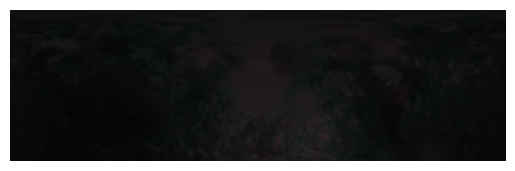

training..  2
train accuracy:  8.89423076923077
validating...


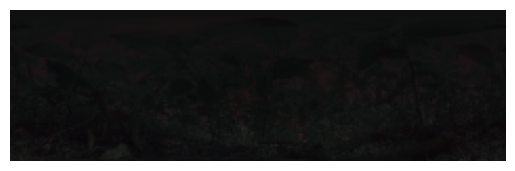

100%|████████████████████████████████████████████████| 2/2 [00:07<00:00,  3.53s/it]

validation accuracy:  9.090909090909092


9.765625
 
 train Acc:  8.89423076923077
 
 val Acc:  9.090909090909092
 
 test Acc:  9.765625


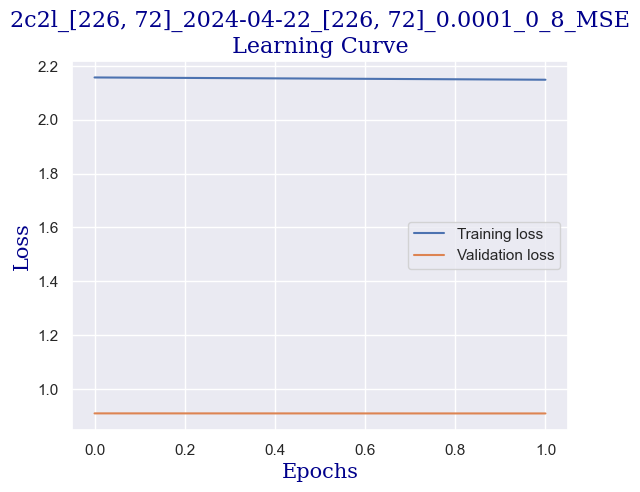

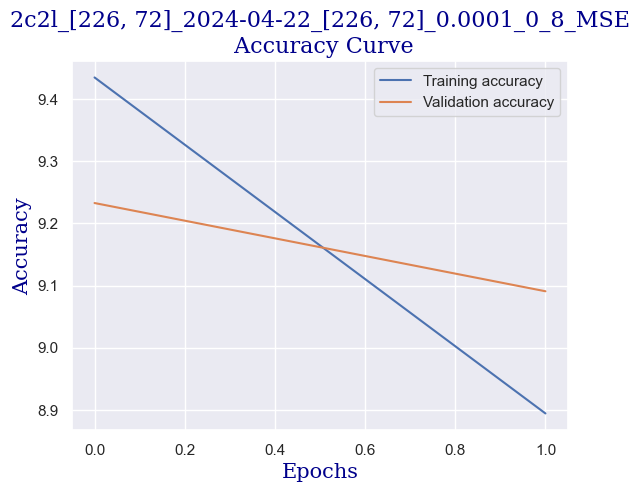

1024 1024
1024 1024


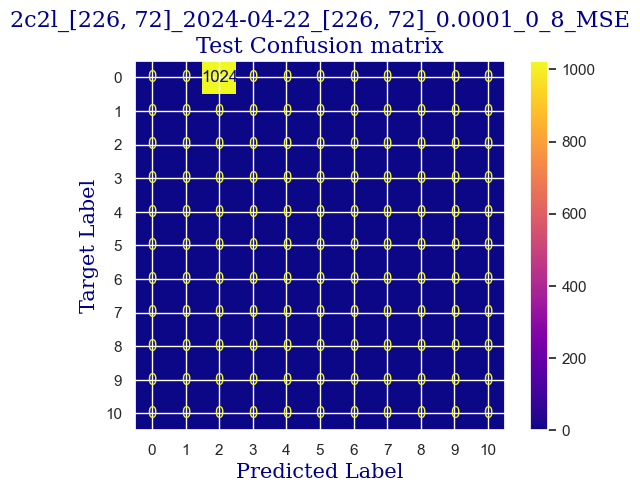

 
 END 2c2l [226, 72] Run Time:  174.63571486399997
Model:  2c2l  idx: 0 / 1
resolution:  [226, 72]  idx: 1 / 7
learning rate:  0.0001  idx: 0 / 2
weight decay:  0  idx: 0 / 2
scheduler:  0  idx: 0 / 1
seed:  8  idx: 0 / 2
loss function:  CrossEntropy  idx: 1 / 2
Batch size:  64
Training epochs:  2
start time:  3983.293971459
3970.853662385
Before model init - Current allocated memory (GB): 0.41786956787109375
After model init, Before data loading - Current allocated memory (GB): 0.5175595283508301
After data loading - Current allocated memory (GB): 0.5175595283508301


  0%|                                                        | 0/2 [00:00<?, ?it/s]

Training...


/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


training..  2
train accuracy:  8.89423076923077
validating...


 50%|████████████████████████                        | 1/2 [00:03<00:03,  3.52s/it]

validation accuracy:  8.664772727272728
Training...


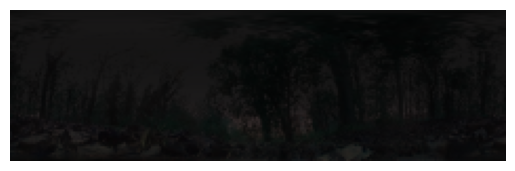

training..  2
train accuracy:  9.795673076923077
validating...


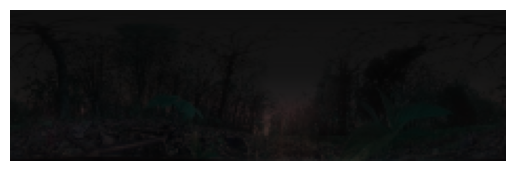

100%|████████████████████████████████████████████████| 2/2 [00:07<00:00,  3.58s/it]

validation accuracy:  9.090909090909092


9.765625
 
 train Acc:  9.795673076923077
 
 val Acc:  9.090909090909092
 
 test Acc:  9.765625


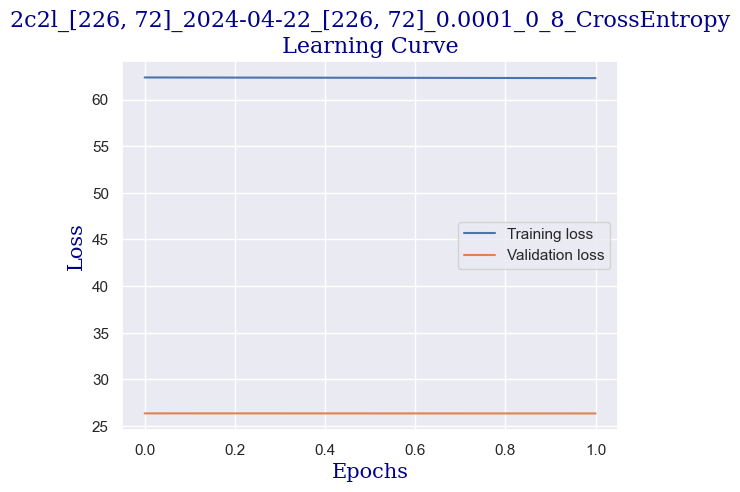

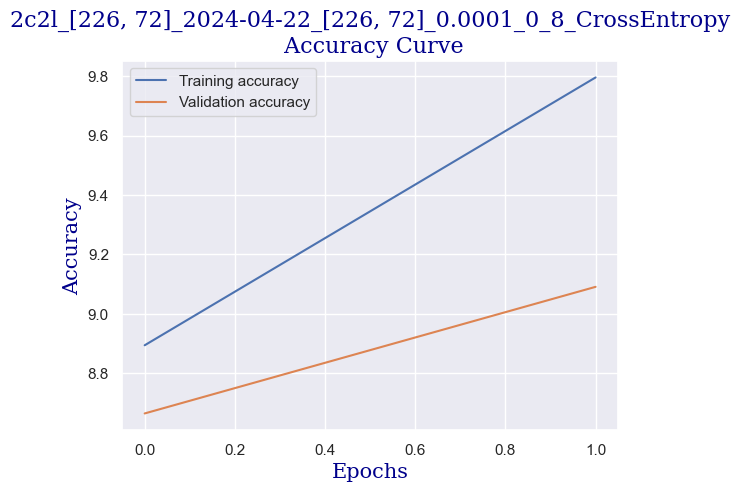

1024 1024
1024 1024


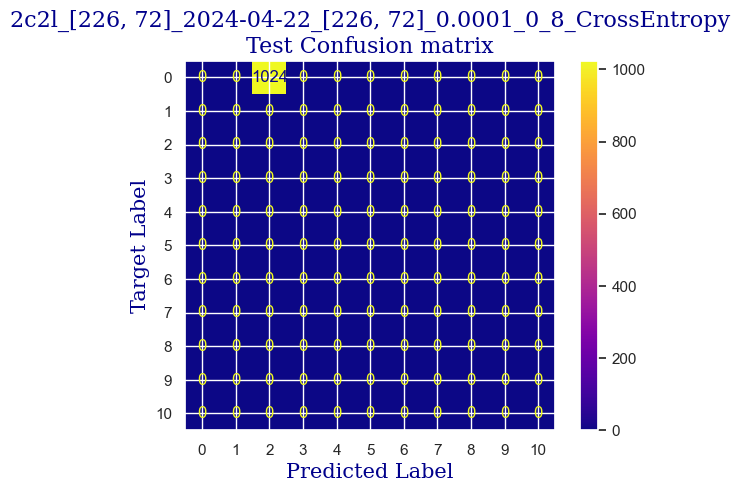

 
 END 2c2l [226, 72] Run Time:  176.74926810299985
Model:  2c2l  idx: 0 / 1
resolution:  [226, 72]  idx: 1 / 7
learning rate:  0.0001  idx: 0 / 2
weight decay:  0  idx: 0 / 2
scheduler:  0  idx: 0 / 1
seed:  2  idx: 1 / 2
loss function:  MSE  idx: 0 / 2
Batch size:  64
Training epochs:  2
start time:  4160.04943606
4147.6091301470005
Before model init - Current allocated memory (GB): 0.41786956787109375
After model init, Before data loading - Current allocated memory (GB): 0.5175595283508301
After data loading - Current allocated memory (GB): 0.5175595283508301


  0%|                                                        | 0/2 [00:00<?, ?it/s]

Training...


/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


training..  2
train accuracy:  9.85576923076923
validating...


 50%|████████████████████████                        | 1/2 [00:03<00:03,  3.50s/it]

validation accuracy:  8.380681818181818
Training...


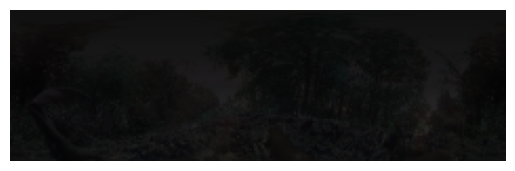

training..  2
train accuracy:  10.697115384615383
validating...


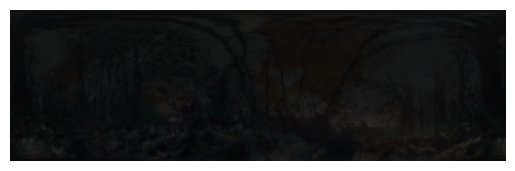

100%|████████████████████████████████████████████████| 2/2 [00:07<00:00,  3.56s/it]

validation accuracy:  8.664772727272728


9.08203125
 
 train Acc:  10.697115384615383
 
 val Acc:  8.664772727272728
 
 test Acc:  9.08203125


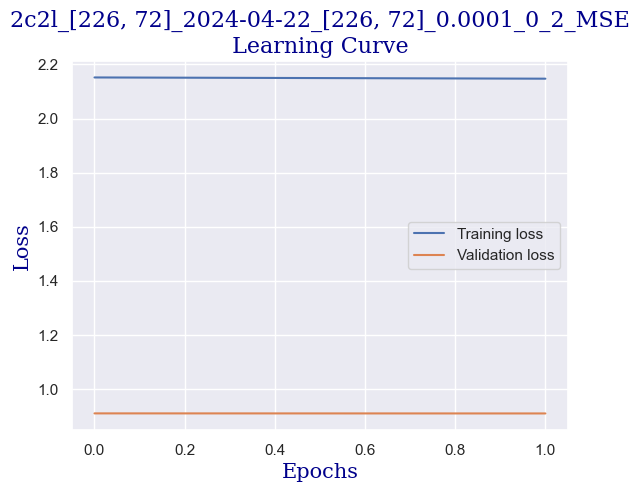

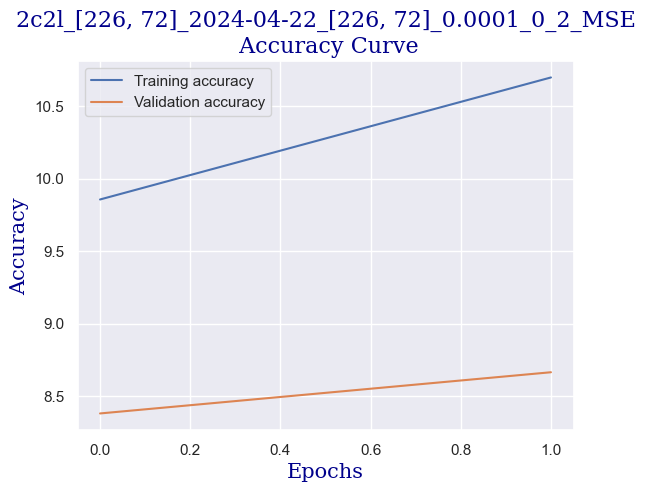

1024 1024
1024 1024


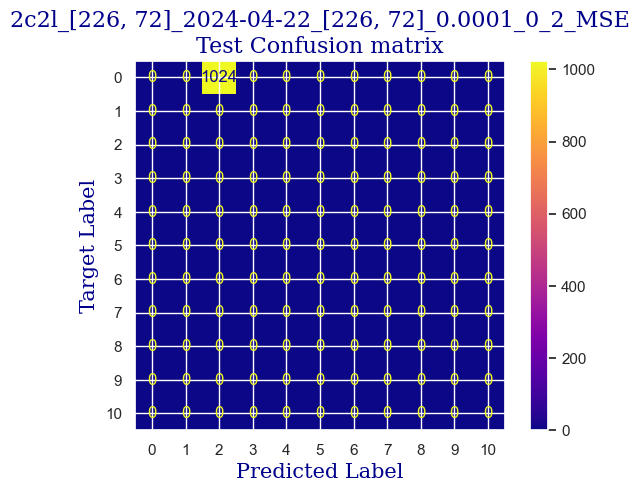

 
 END 2c2l [226, 72] Run Time:  176.40312302300026
Model:  2c2l  idx: 0 / 1
resolution:  [226, 72]  idx: 1 / 7
learning rate:  0.0001  idx: 0 / 2
weight decay:  0  idx: 0 / 2
scheduler:  0  idx: 0 / 1
seed:  2  idx: 1 / 2
loss function:  CrossEntropy  idx: 1 / 2
Batch size:  64
Training epochs:  2
start time:  4336.461496158
4324.021189351
Before model init - Current allocated memory (GB): 0.41786956787109375
After model init, Before data loading - Current allocated memory (GB): 0.5175595283508301
After data loading - Current allocated memory (GB): 0.5175595283508301


  0%|                                                        | 0/2 [00:00<?, ?it/s]

Training...


/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


training..  2
train accuracy:  9.795673076923077
validating...


 50%|████████████████████████                        | 1/2 [00:03<00:03,  3.53s/it]

validation accuracy:  8.522727272727272
Training...


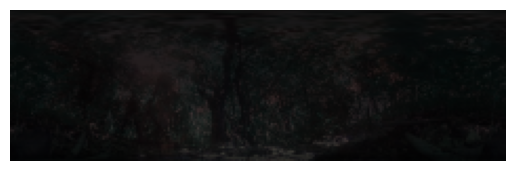

training..  2
train accuracy:  10.15625
validating...


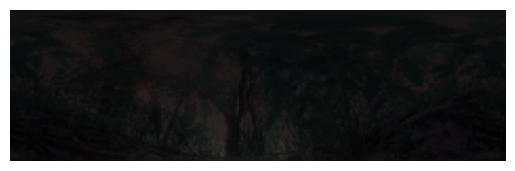

100%|████████████████████████████████████████████████| 2/2 [00:07<00:00,  3.57s/it]

validation accuracy:  9.801136363636363


10.25390625
 
 train Acc:  10.15625
 
 val Acc:  9.801136363636363
 
 test Acc:  10.25390625


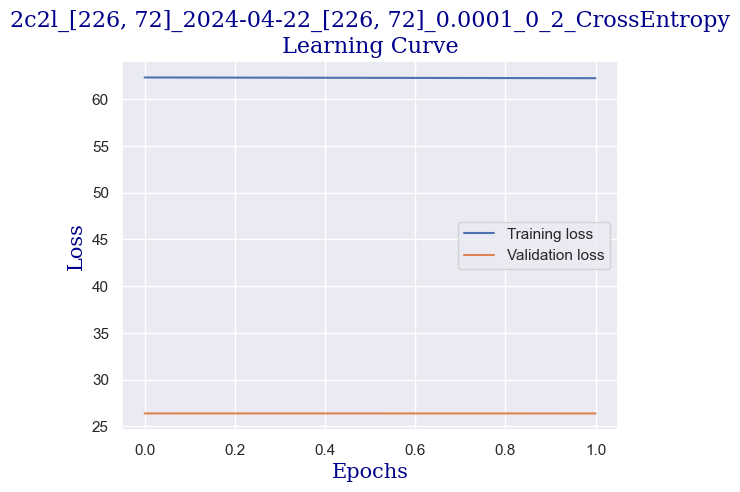

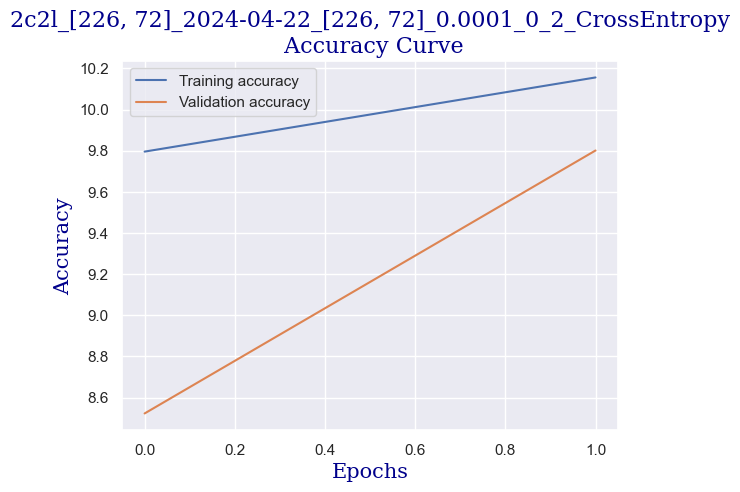

1024 1024
1024 1024


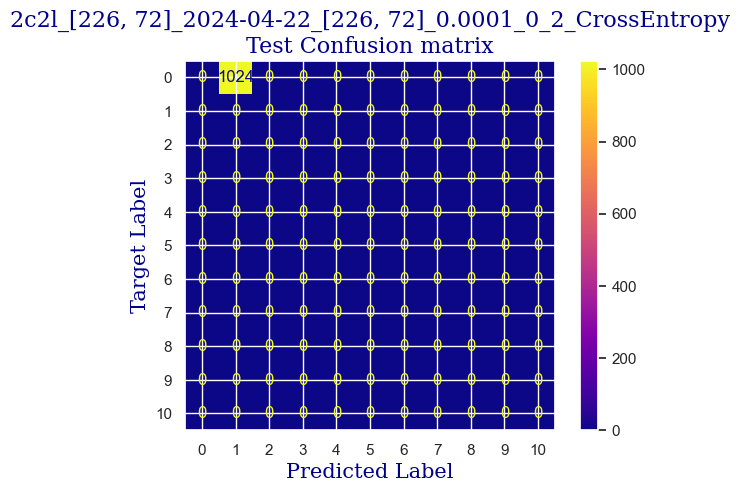

 
 END 2c2l [226, 72] Run Time:  176.08140208500026
Model:  2c2l  idx: 0 / 1
resolution:  [226, 72]  idx: 1 / 7
learning rate:  0.0001  idx: 0 / 2
weight decay:  4e-05  idx: 1 / 2
scheduler:  0  idx: 0 / 1
seed:  8  idx: 0 / 2
loss function:  MSE  idx: 0 / 2
Batch size:  64
Training epochs:  2
start time:  4512.551871782
4500.1115858620005
Before model init - Current allocated memory (GB): 0.41786956787109375
After model init, Before data loading - Current allocated memory (GB): 0.5175595283508301
After data loading - Current allocated memory (GB): 0.5175595283508301


  0%|                                                        | 0/2 [00:00<?, ?it/s]

Training...


/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


training..  2
train accuracy:  8.713942307692307
validating...


 50%|████████████████████████                        | 1/2 [00:03<00:03,  3.51s/it]

validation accuracy:  9.090909090909092
Training...


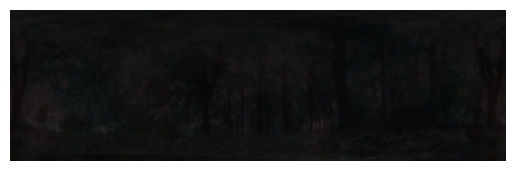

training..  2
train accuracy:  10.396634615384617
validating...


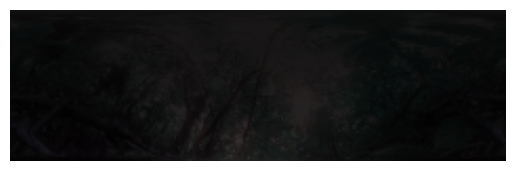

100%|████████████████████████████████████████████████| 2/2 [00:07<00:00,  3.56s/it]

validation accuracy:  9.375


9.66796875
 
 train Acc:  10.396634615384617
 
 val Acc:  9.375
 
 test Acc:  9.66796875


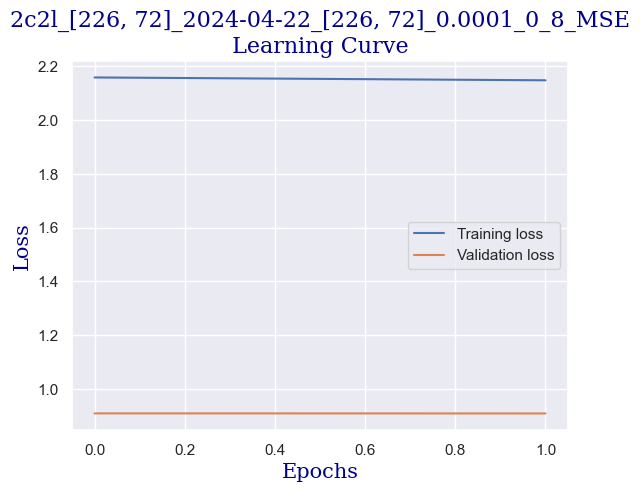

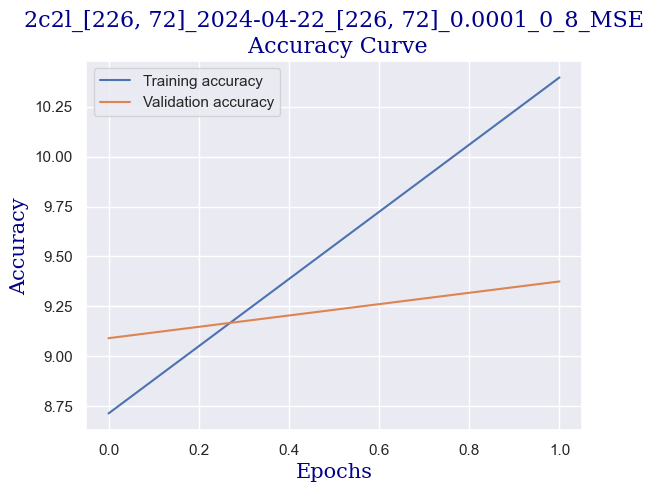

1024 1024
1024 1024


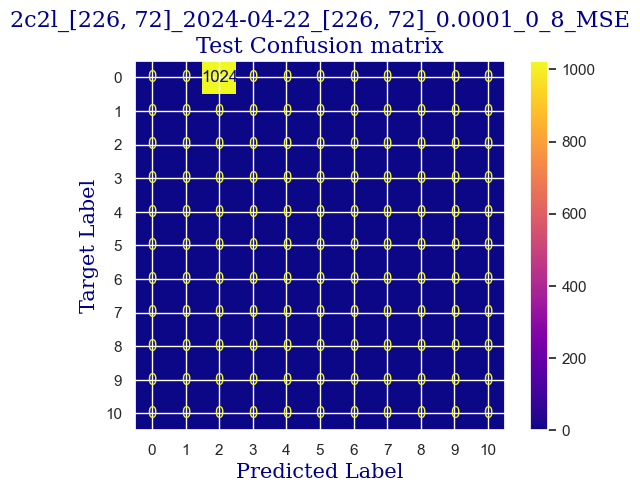

 
 END 2c2l [226, 72] Run Time:  175.83508026600066
Model:  2c2l  idx: 0 / 1
resolution:  [226, 72]  idx: 1 / 7
learning rate:  0.0001  idx: 0 / 2
weight decay:  4e-05  idx: 1 / 2
scheduler:  0  idx: 0 / 1
seed:  8  idx: 0 / 2
loss function:  CrossEntropy  idx: 1 / 2
Batch size:  64
Training epochs:  2
start time:  4688.396054034
4675.9557455760005
Before model init - Current allocated memory (GB): 0.41786956787109375
After model init, Before data loading - Current allocated memory (GB): 0.5175595283508301
After data loading - Current allocated memory (GB): 0.5175595283508301


  0%|                                                        | 0/2 [00:00<?, ?it/s]

Training...


/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


training..  2
train accuracy:  9.435096153846153
validating...


 50%|████████████████████████                        | 1/2 [00:03<00:03,  3.60s/it]

validation accuracy:  8.664772727272728
Training...


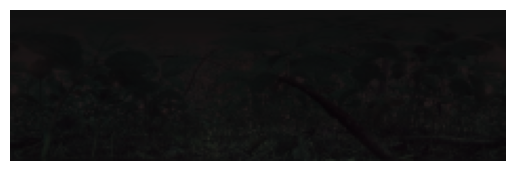

training..  2
train accuracy:  10.276442307692307
validating...


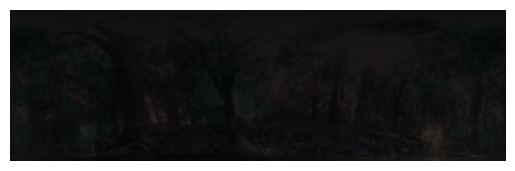

100%|████████████████████████████████████████████████| 2/2 [00:07<00:00,  3.61s/it]

validation accuracy:  9.232954545454545


9.9609375
 
 train Acc:  10.276442307692307
 
 val Acc:  9.232954545454545
 
 test Acc:  9.9609375


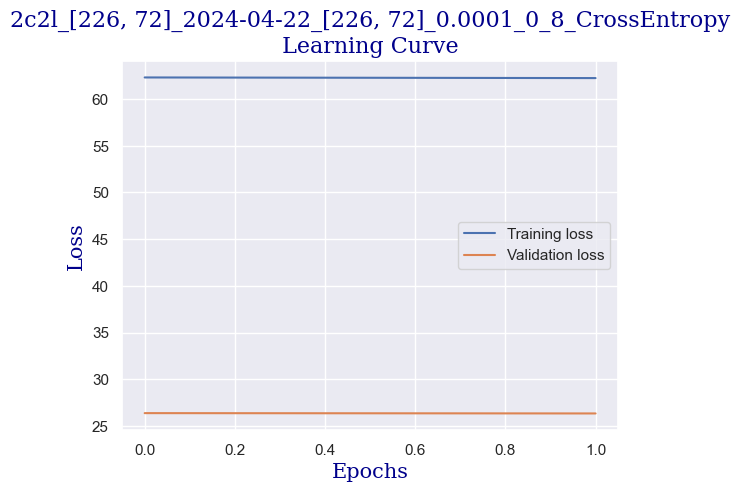

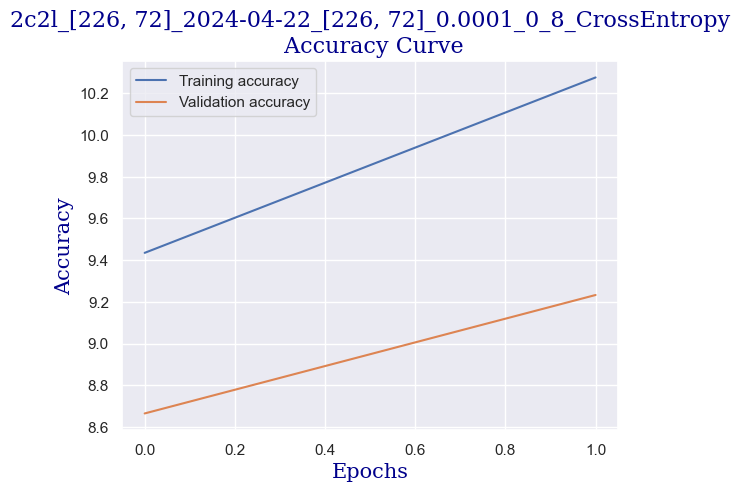

1024 1024
1024 1024


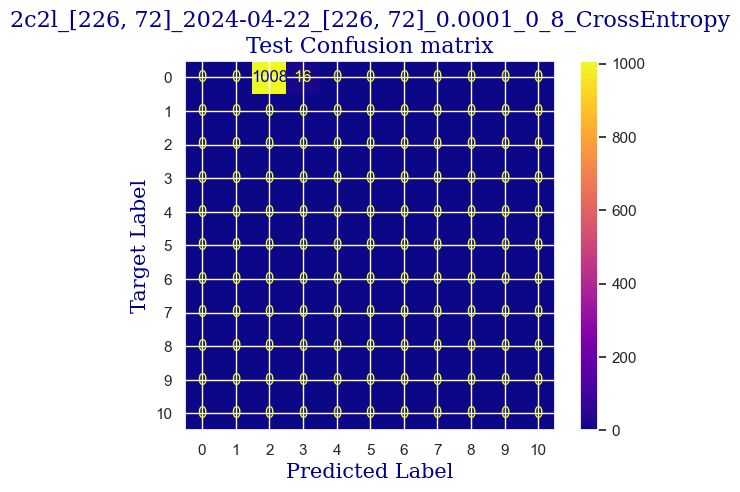

 
 END 2c2l [226, 72] Run Time:  175.6629938219994
Model:  2c2l  idx: 0 / 1
resolution:  [226, 72]  idx: 1 / 7
learning rate:  0.0001  idx: 0 / 2
weight decay:  4e-05  idx: 1 / 2
scheduler:  0  idx: 0 / 1
seed:  2  idx: 1 / 2
loss function:  MSE  idx: 0 / 2
Batch size:  64
Training epochs:  2
start time:  4864.068054549
4851.627744083
Before model init - Current allocated memory (GB): 0.41786956787109375
After model init, Before data loading - Current allocated memory (GB): 0.5175595283508301
After data loading - Current allocated memory (GB): 0.5175595283508301


  0%|                                                        | 0/2 [00:00<?, ?it/s]

Training...


/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


training..  2
train accuracy:  10.216346153846153
validating...


 50%|████████████████████████                        | 1/2 [00:03<00:03,  3.51s/it]

validation accuracy:  8.664772727272728
Training...


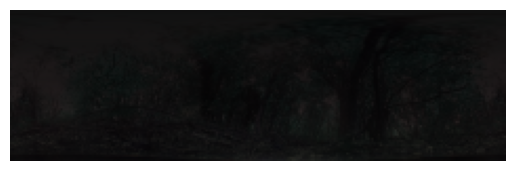

training..  2
train accuracy:  10.817307692307693
validating...


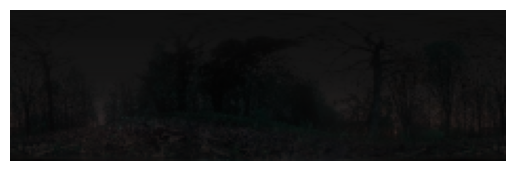

100%|████████████████████████████████████████████████| 2/2 [00:07<00:00,  3.57s/it]

validation accuracy:  8.238636363636363


8.984375
 
 train Acc:  10.817307692307693
 
 val Acc:  8.238636363636363
 
 test Acc:  8.984375


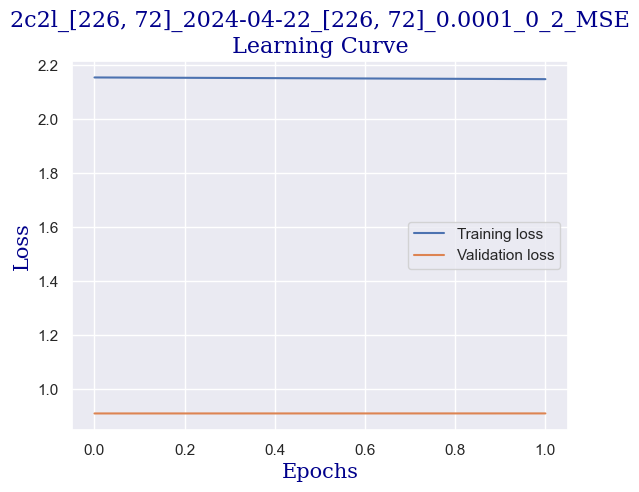

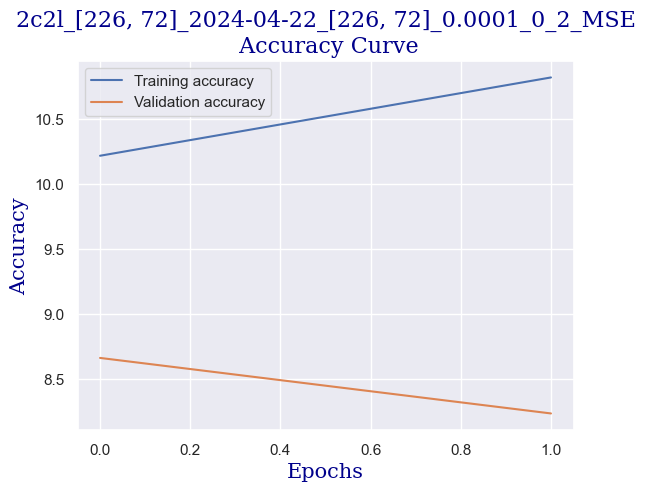

1024 1024
1024 1024


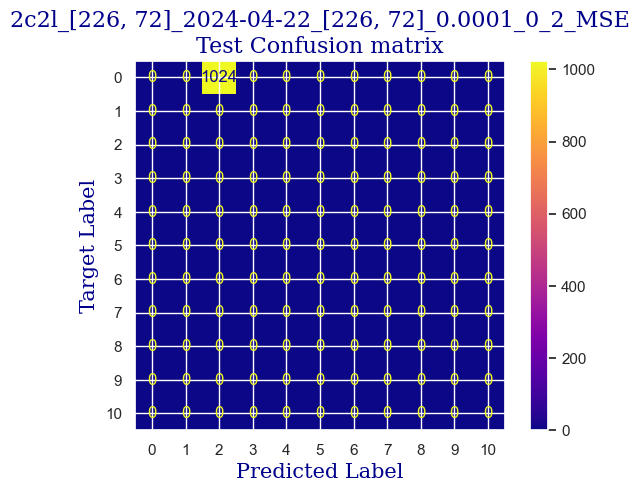

 
 END 2c2l [226, 72] Run Time:  176.01276947599945
Model:  2c2l  idx: 0 / 1
resolution:  [226, 72]  idx: 1 / 7
learning rate:  0.0001  idx: 0 / 2
weight decay:  4e-05  idx: 1 / 2
scheduler:  0  idx: 0 / 1
seed:  2  idx: 1 / 2
loss function:  CrossEntropy  idx: 1 / 2
Batch size:  64
Training epochs:  2
start time:  5040.09010562
5027.649797290001
Before model init - Current allocated memory (GB): 0.41786956787109375
After model init, Before data loading - Current allocated memory (GB): 0.5175595283508301
After data loading - Current allocated memory (GB): 0.5175595283508301


  0%|                                                        | 0/2 [00:00<?, ?it/s]

Training...


/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


training..  2
train accuracy:  9.975961538461538
validating...


 50%|████████████████████████                        | 1/2 [00:03<00:03,  3.50s/it]

validation accuracy:  8.238636363636363
Training...


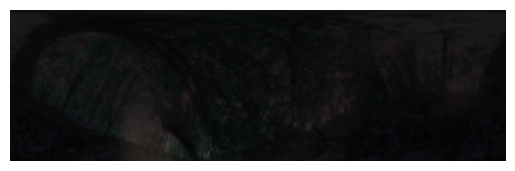

training..  2
train accuracy:  11.23798076923077
validating...


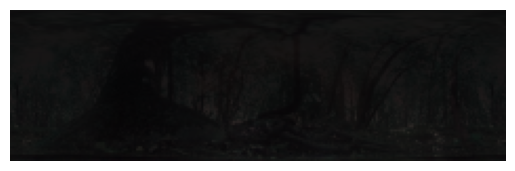

100%|████████████████████████████████████████████████| 2/2 [00:07<00:00,  3.59s/it]

validation accuracy:  8.522727272727272


8.7890625
 
 train Acc:  11.23798076923077
 
 val Acc:  8.522727272727272
 
 test Acc:  8.7890625


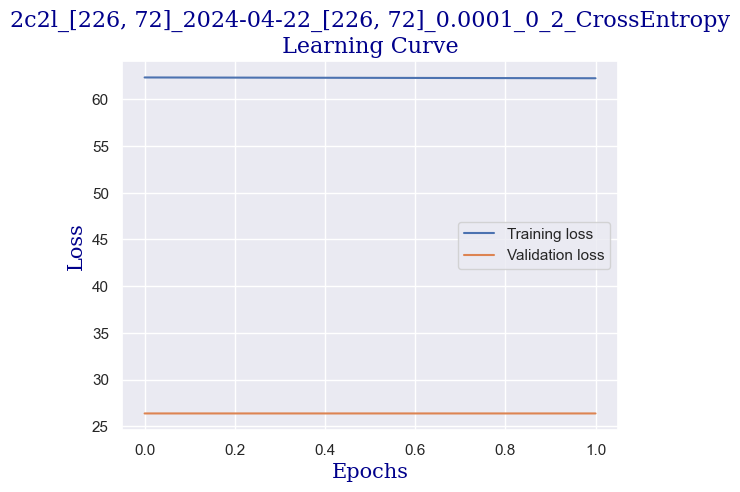

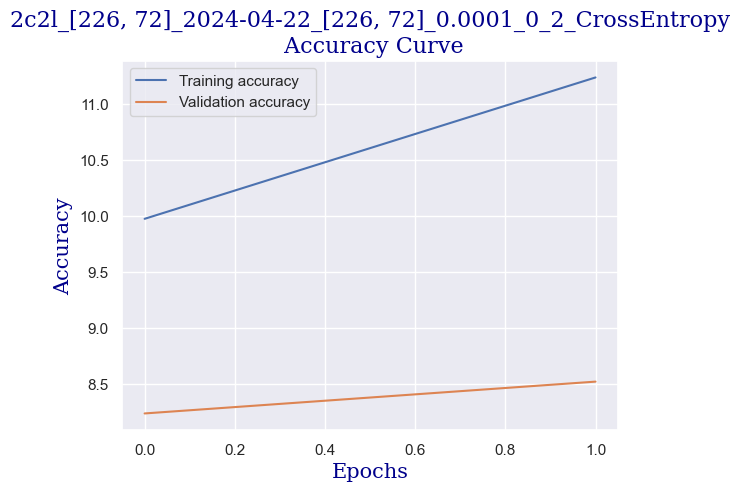

1024 1024
1024 1024


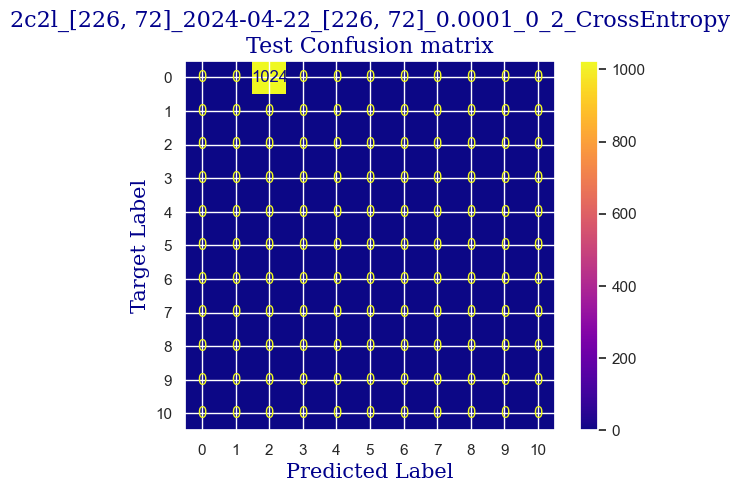

 
 END 2c2l [226, 72] Run Time:  177.24028590800026
Model:  2c2l  idx: 0 / 1
resolution:  [226, 72]  idx: 1 / 7
learning rate:  6e-05  idx: 1 / 2
weight decay:  0  idx: 0 / 2
scheduler:  0  idx: 0 / 1
seed:  8  idx: 0 / 2
loss function:  MSE  idx: 0 / 2
Batch size:  64
Training epochs:  2
start time:  5217.344536687
5204.904393586
Before model init - Current allocated memory (GB): 0.41786956787109375
After model init, Before data loading - Current allocated memory (GB): 0.5175595283508301
After data loading - Current allocated memory (GB): 0.5175595283508301


  0%|                                                        | 0/2 [00:00<?, ?it/s]

Training...


/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


training..  2
train accuracy:  9.134615384615383
validating...


 50%|████████████████████████                        | 1/2 [00:03<00:03,  3.47s/it]

validation accuracy:  9.090909090909092
Training...


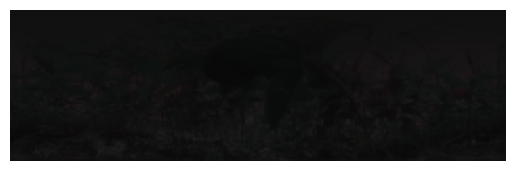

training..  2
train accuracy:  8.59375
validating...


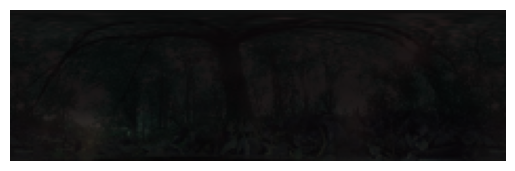

100%|████████████████████████████████████████████████| 2/2 [00:07<00:00,  3.53s/it]

validation accuracy:  9.801136363636363


9.1796875
 
 train Acc:  8.59375
 
 val Acc:  9.801136363636363
 
 test Acc:  9.1796875


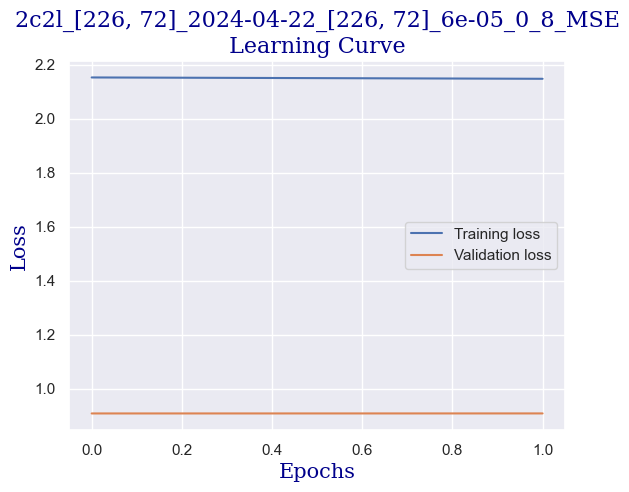

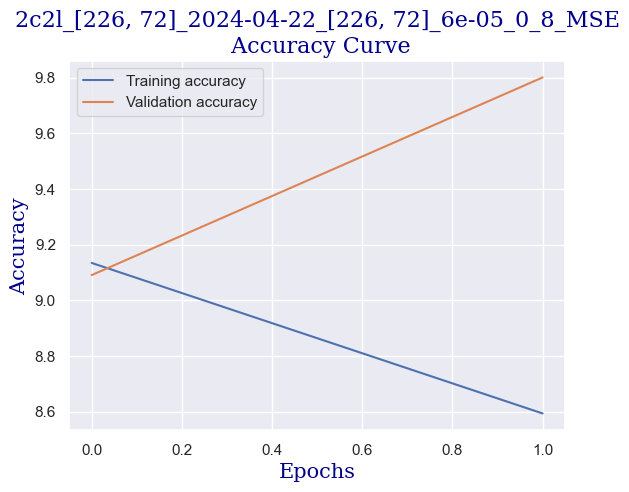

1024 1024
1024 1024


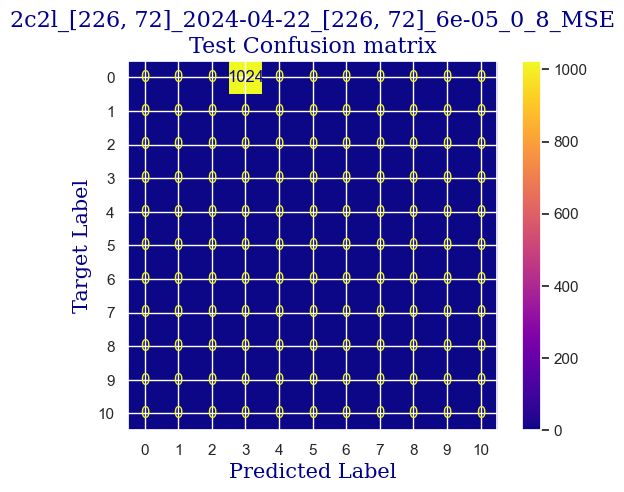

 
 END 2c2l [226, 72] Run Time:  174.7481778399997
Model:  2c2l  idx: 0 / 1
resolution:  [226, 72]  idx: 1 / 7
learning rate:  6e-05  idx: 1 / 2
weight decay:  0  idx: 0 / 2
scheduler:  0  idx: 0 / 1
seed:  8  idx: 0 / 2
loss function:  CrossEntropy  idx: 1 / 2
Batch size:  64
Training epochs:  2
start time:  5392.106065602
5379.665759173
Before model init - Current allocated memory (GB): 0.41786956787109375
After model init, Before data loading - Current allocated memory (GB): 0.5175595283508301
After data loading - Current allocated memory (GB): 0.5175595283508301


  0%|                                                        | 0/2 [00:00<?, ?it/s]

Training...


/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


training..  2
train accuracy:  9.735576923076923
validating...


 50%|████████████████████████                        | 1/2 [00:03<00:03,  3.49s/it]

validation accuracy:  9.090909090909092
Training...


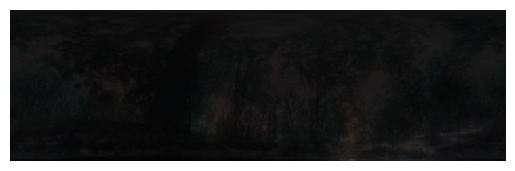

training..  2
train accuracy:  10.336538461538462
validating...


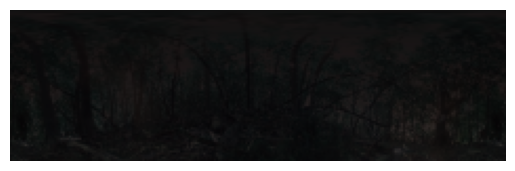

100%|████████████████████████████████████████████████| 2/2 [00:07<00:00,  3.56s/it]

validation accuracy:  8.948863636363637


9.765625
 
 train Acc:  10.336538461538462
 
 val Acc:  8.948863636363637
 
 test Acc:  9.765625


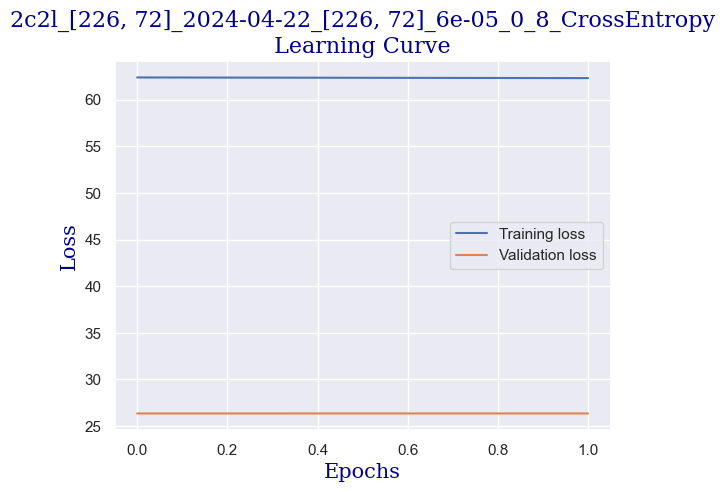

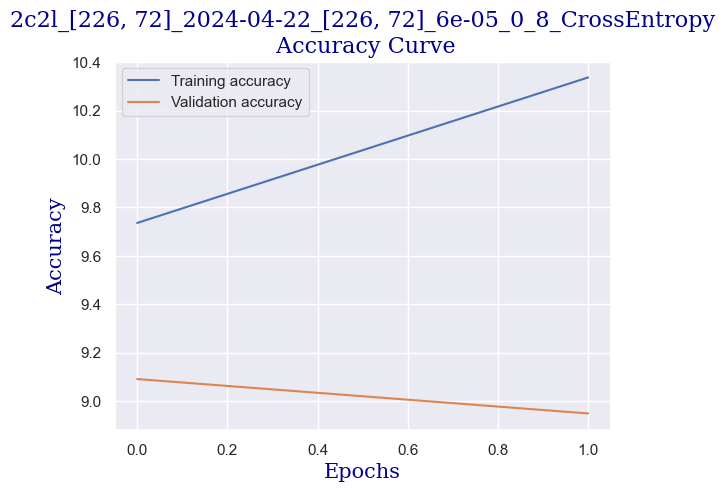

1024 1024
1024 1024


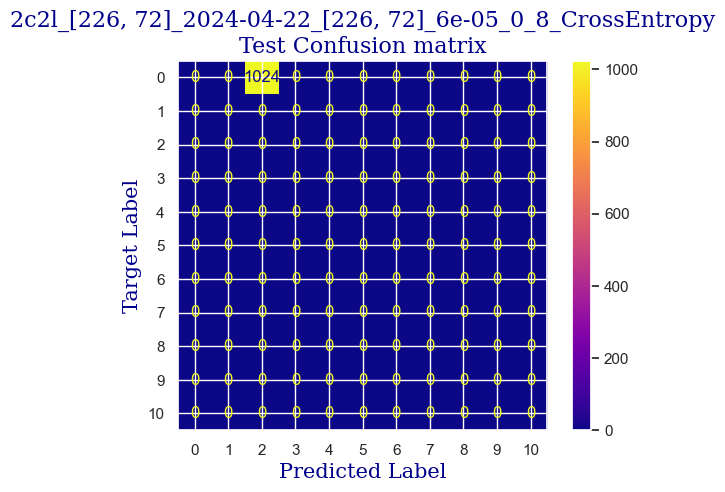

 
 END 2c2l [226, 72] Run Time:  175.51993631500045
Model:  2c2l  idx: 0 / 1
resolution:  [226, 72]  idx: 1 / 7
learning rate:  6e-05  idx: 1 / 2
weight decay:  0  idx: 0 / 2
scheduler:  0  idx: 0 / 1
seed:  2  idx: 1 / 2
loss function:  MSE  idx: 0 / 2
Batch size:  64
Training epochs:  2
start time:  5567.635609724
5555.195298338001
Before model init - Current allocated memory (GB): 0.41786956787109375
After model init, Before data loading - Current allocated memory (GB): 0.5175595283508301
After data loading - Current allocated memory (GB): 0.5175595283508301


  0%|                                                        | 0/2 [00:00<?, ?it/s]

Training...


/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


training..  2
train accuracy:  9.375
validating...


 50%|████████████████████████                        | 1/2 [00:03<00:03,  3.48s/it]

validation accuracy:  8.806818181818182
Training...


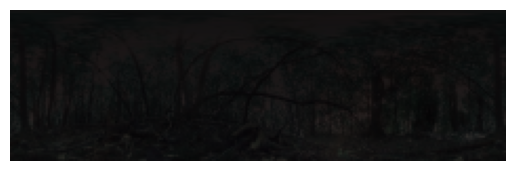

training..  2
train accuracy:  10.096153846153847
validating...


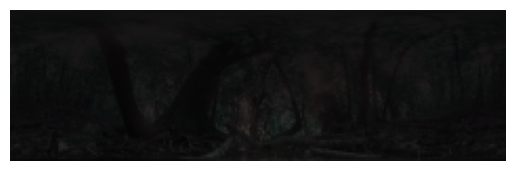

100%|████████████████████████████████████████████████| 2/2 [00:07<00:00,  3.54s/it]

validation accuracy:  8.664772727272728


9.08203125
 
 train Acc:  10.096153846153847
 
 val Acc:  8.664772727272728
 
 test Acc:  9.08203125


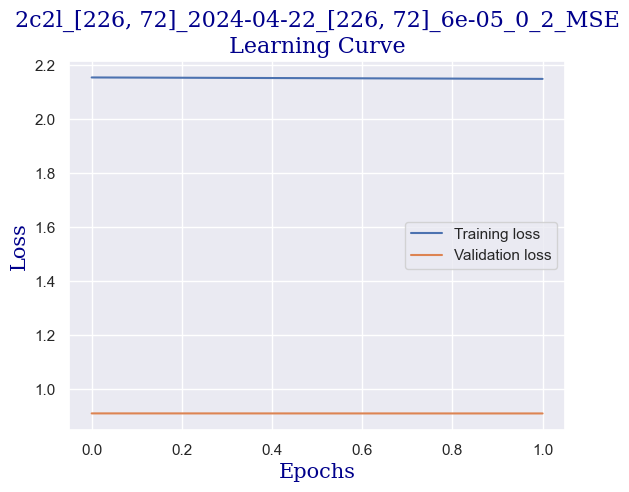

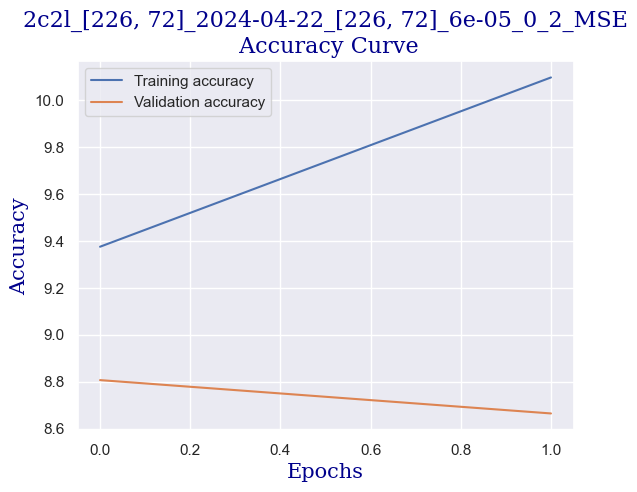

1024 1024
1024 1024


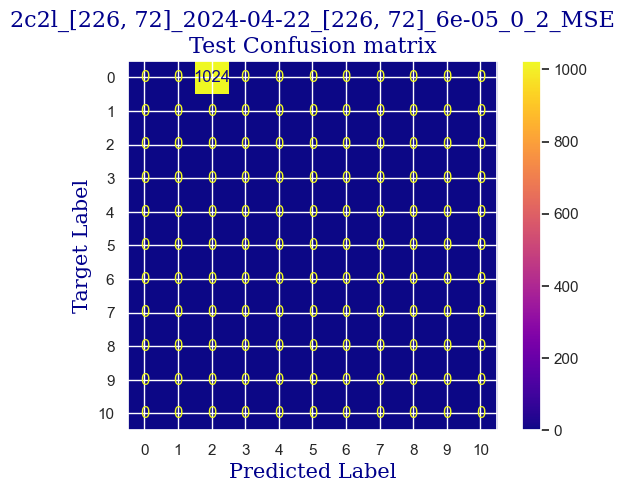

 
 END 2c2l [226, 72] Run Time:  174.71757875000003
Model:  2c2l  idx: 0 / 1
resolution:  [226, 72]  idx: 1 / 7
learning rate:  6e-05  idx: 1 / 2
weight decay:  0  idx: 0 / 2
scheduler:  0  idx: 0 / 1
seed:  2  idx: 1 / 2
loss function:  CrossEntropy  idx: 1 / 2
Batch size:  64
Training epochs:  2
start time:  5742.362199204
5729.921887466
Before model init - Current allocated memory (GB): 0.41786956787109375
After model init, Before data loading - Current allocated memory (GB): 0.5175595283508301
After data loading - Current allocated memory (GB): 0.5175595283508301


  0%|                                                        | 0/2 [00:00<?, ?it/s]

Training...


/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


training..  2
train accuracy:  10.216346153846153
validating...


 50%|████████████████████████                        | 1/2 [00:03<00:03,  3.53s/it]

validation accuracy:  9.659090909090908
Training...


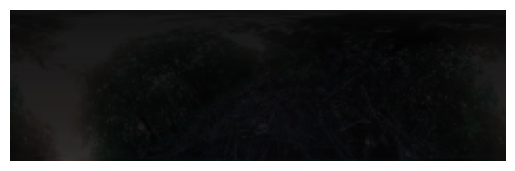

training..  2
train accuracy:  10.45673076923077
validating...


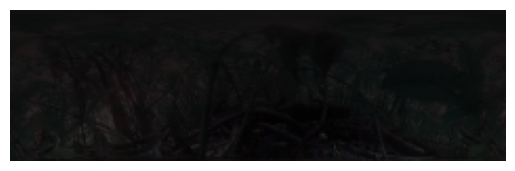

100%|████████████████████████████████████████████████| 2/2 [00:07<00:00,  3.59s/it]

validation accuracy:  8.238636363636363


8.984375
 
 train Acc:  10.45673076923077
 
 val Acc:  8.238636363636363
 
 test Acc:  8.984375


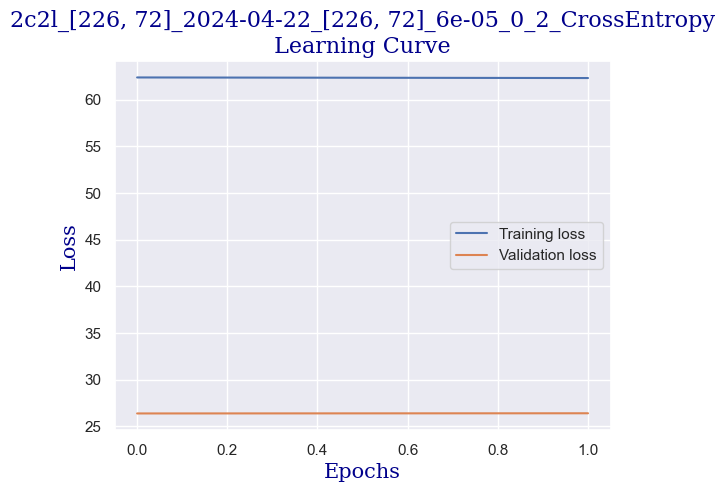

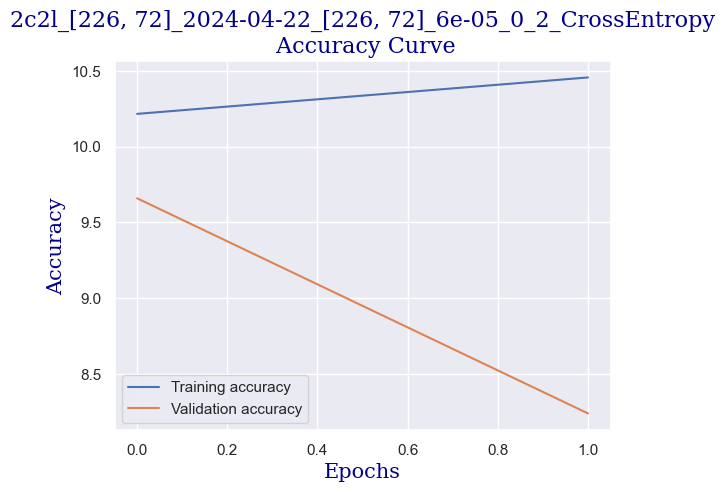

1024 1024
1024 1024


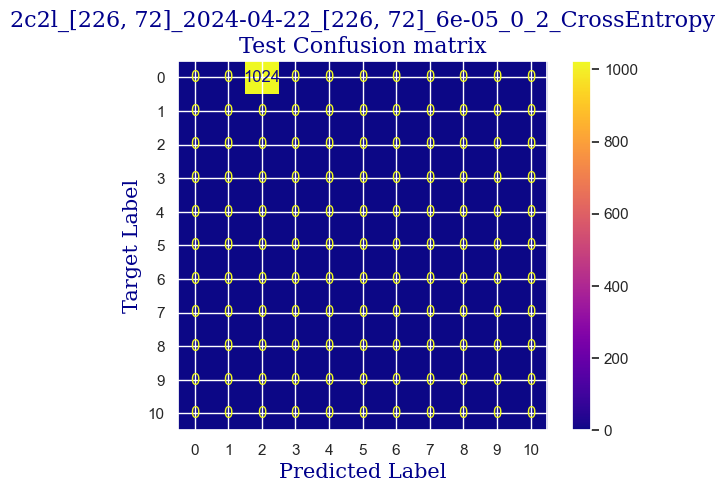

 
 END 2c2l [226, 72] Run Time:  176.81744050700036
Model:  2c2l  idx: 0 / 1
resolution:  [226, 72]  idx: 1 / 7
learning rate:  6e-05  idx: 1 / 2
weight decay:  4e-05  idx: 1 / 2
scheduler:  0  idx: 0 / 1
seed:  8  idx: 0 / 2
loss function:  MSE  idx: 0 / 2
Batch size:  64
Training epochs:  2
start time:  5919.190416996
5906.750111427
Before model init - Current allocated memory (GB): 0.41786956787109375
After model init, Before data loading - Current allocated memory (GB): 0.5175595283508301
After data loading - Current allocated memory (GB): 0.5175595283508301


  0%|                                                        | 0/2 [00:00<?, ?it/s]

Training...


/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


training..  2
train accuracy:  9.254807692307693
validating...


 50%|████████████████████████                        | 1/2 [00:03<00:03,  3.49s/it]

validation accuracy:  8.522727272727272
Training...


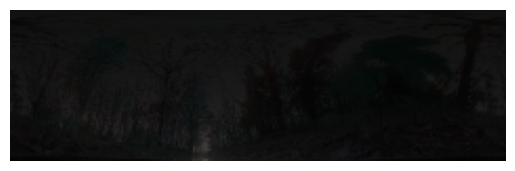

training..  2
train accuracy:  9.134615384615383
validating...


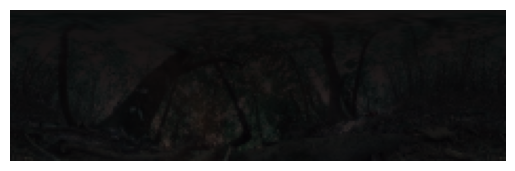

100%|████████████████████████████████████████████████| 2/2 [00:07<00:00,  3.59s/it]

validation accuracy:  8.806818181818182


9.66796875
 
 train Acc:  9.134615384615383
 
 val Acc:  8.806818181818182
 
 test Acc:  9.66796875


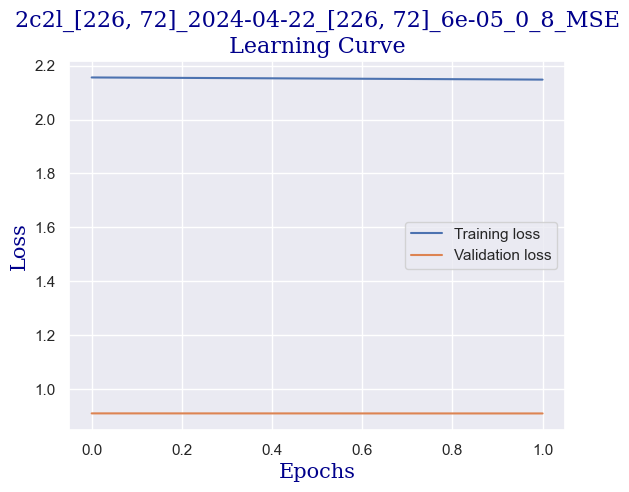

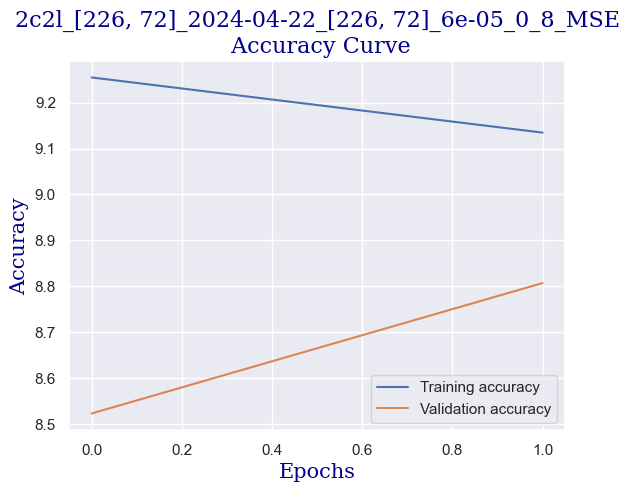

1024 1024
1024 1024


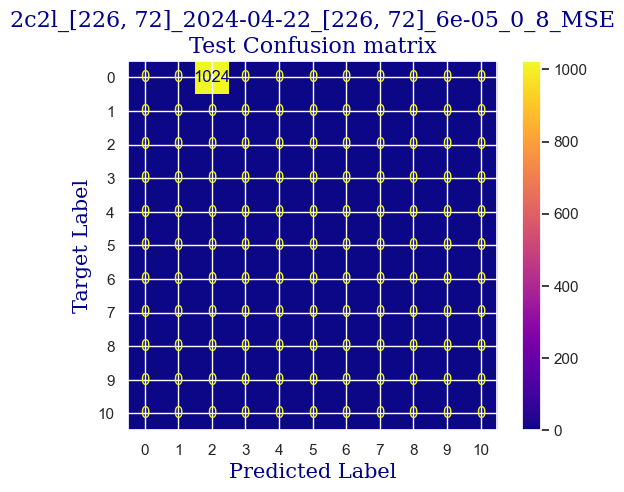

 
 END 2c2l [226, 72] Run Time:  176.96777487800045
Model:  2c2l  idx: 0 / 1
resolution:  [226, 72]  idx: 1 / 7
learning rate:  6e-05  idx: 1 / 2
weight decay:  4e-05  idx: 1 / 2
scheduler:  0  idx: 0 / 1
seed:  8  idx: 0 / 2
loss function:  CrossEntropy  idx: 1 / 2
Batch size:  64
Training epochs:  2
start time:  6096.168101738
6083.7277956180005
Before model init - Current allocated memory (GB): 0.41786956787109375
After model init, Before data loading - Current allocated memory (GB): 0.5175595283508301
After data loading - Current allocated memory (GB): 0.5175595283508301


  0%|                                                        | 0/2 [00:00<?, ?it/s]

Training...


/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


training..  2
train accuracy:  8.653846153846153
validating...


 50%|████████████████████████                        | 1/2 [00:03<00:03,  3.46s/it]

validation accuracy:  9.517045454545455
Training...


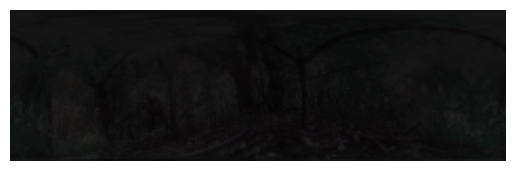

training..  2
train accuracy:  7.872596153846153
validating...


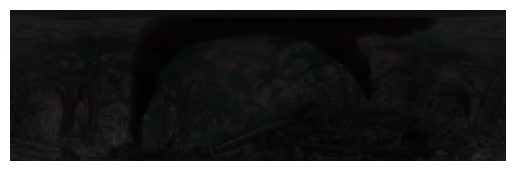

100%|████████████████████████████████████████████████| 2/2 [00:07<00:00,  3.54s/it]

validation accuracy:  9.090909090909092


9.765625
 
 train Acc:  7.872596153846153
 
 val Acc:  9.090909090909092
 
 test Acc:  9.765625


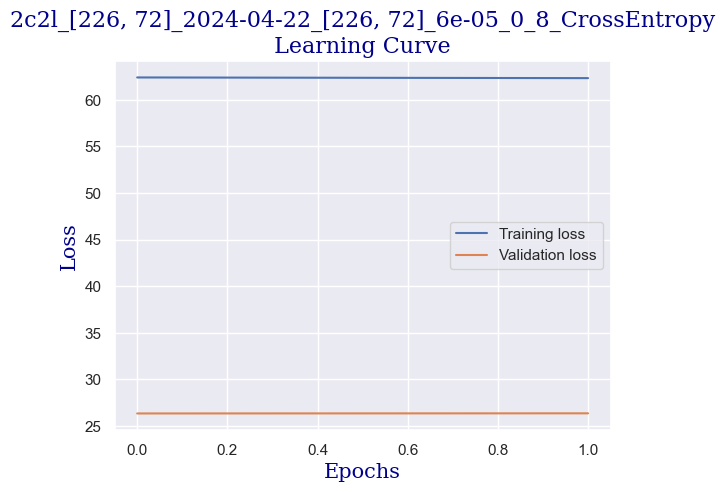

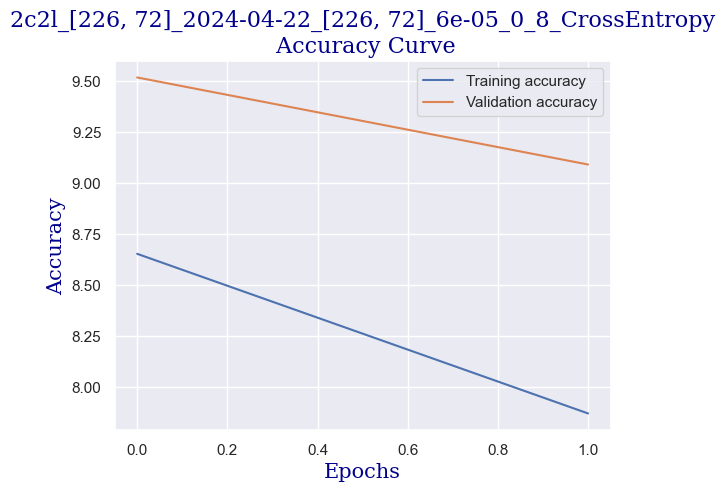

1024 1024
1024 1024


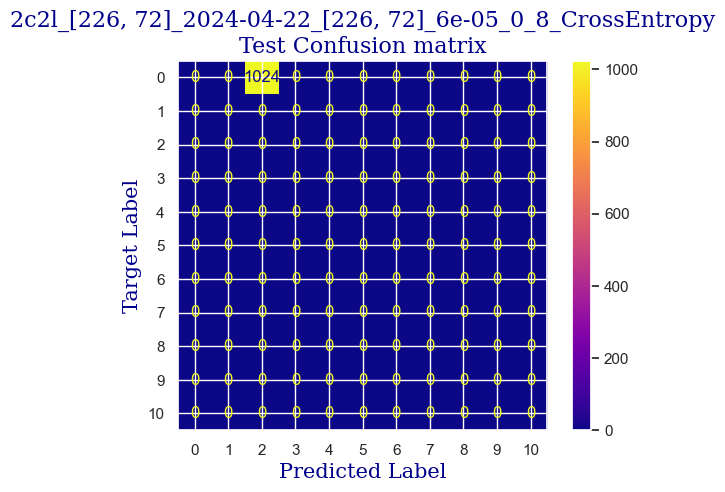

 
 END 2c2l [226, 72] Run Time:  174.90372853900044
Model:  2c2l  idx: 0 / 1
resolution:  [226, 72]  idx: 1 / 7
learning rate:  6e-05  idx: 1 / 2
weight decay:  4e-05  idx: 1 / 2
scheduler:  0  idx: 0 / 1
seed:  2  idx: 1 / 2
loss function:  MSE  idx: 0 / 2
Batch size:  64
Training epochs:  2
start time:  6271.082978115
6258.642674298
Before model init - Current allocated memory (GB): 0.41786956787109375
After model init, Before data loading - Current allocated memory (GB): 0.5175595283508301
After data loading - Current allocated memory (GB): 0.5175595283508301


  0%|                                                        | 0/2 [00:00<?, ?it/s]

Training...


/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


training..  2
train accuracy:  9.735576923076923
validating...


 50%|████████████████████████                        | 1/2 [00:03<00:03,  3.46s/it]

validation accuracy:  8.664772727272728
Training...


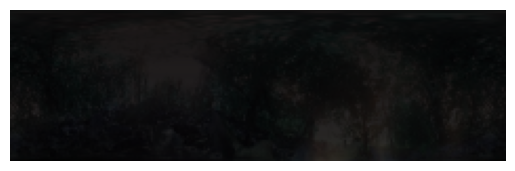

training..  2
train accuracy:  9.495192307692307
validating...


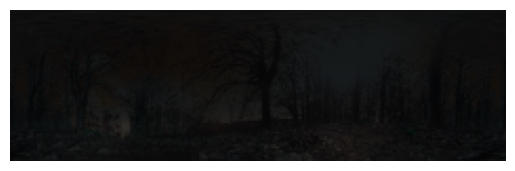

100%|████████████████████████████████████████████████| 2/2 [00:07<00:00,  3.55s/it]

validation accuracy:  8.664772727272728


8.7890625
 
 train Acc:  9.495192307692307
 
 val Acc:  8.664772727272728
 
 test Acc:  8.7890625


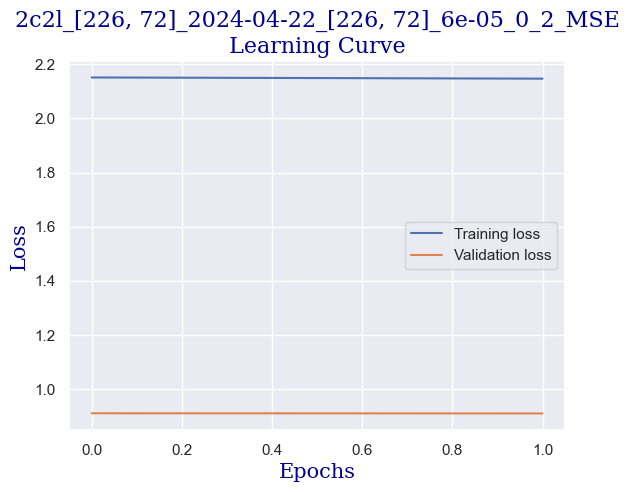

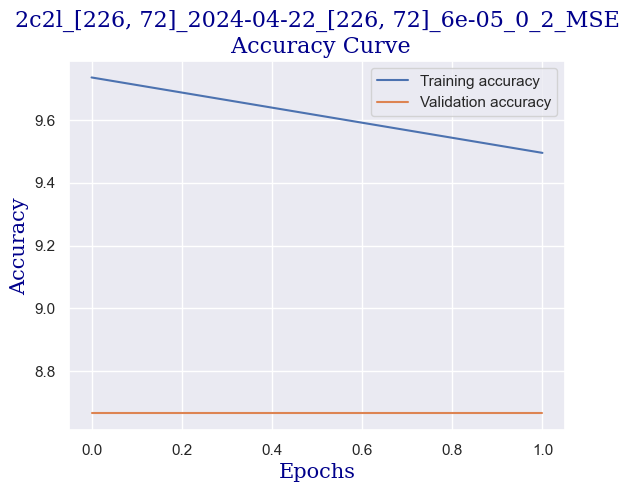

1024 1024
1024 1024


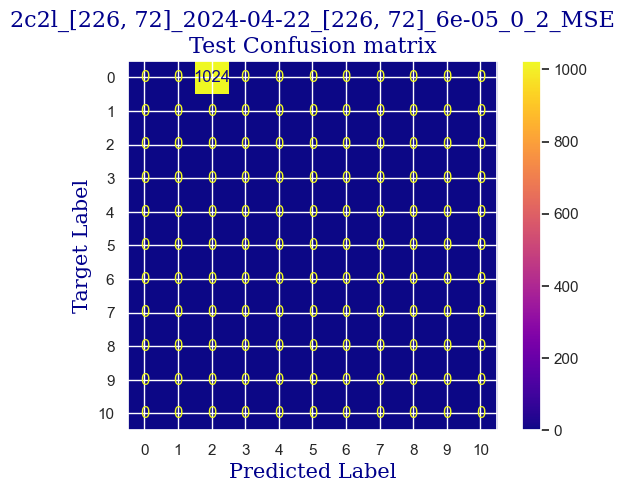

 
 END 2c2l [226, 72] Run Time:  174.90285353000036
Model:  2c2l  idx: 0 / 1
resolution:  [226, 72]  idx: 1 / 7
learning rate:  6e-05  idx: 1 / 2
weight decay:  4e-05  idx: 1 / 2
scheduler:  0  idx: 0 / 1
seed:  2  idx: 1 / 2
loss function:  CrossEntropy  idx: 1 / 2
Batch size:  64
Training epochs:  2
start time:  6445.99577
6433.555458359
Before model init - Current allocated memory (GB): 0.41786956787109375
After model init, Before data loading - Current allocated memory (GB): 0.5175595283508301
After data loading - Current allocated memory (GB): 0.5175595283508301


  0%|                                                        | 0/2 [00:00<?, ?it/s]

Training...


/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


training..  2
train accuracy:  9.555288461538462
validating...


 50%|████████████████████████                        | 1/2 [00:03<00:03,  3.54s/it]

validation accuracy:  8.380681818181818
Training...


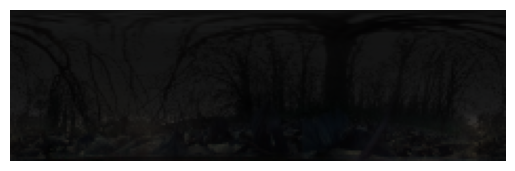

training..  2
train accuracy:  10.9375
validating...


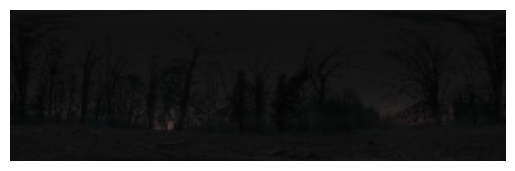

100%|████████████████████████████████████████████████| 2/2 [00:07<00:00,  3.59s/it]

validation accuracy:  8.238636363636363


8.7890625
 
 train Acc:  10.9375
 
 val Acc:  8.238636363636363
 
 test Acc:  8.7890625


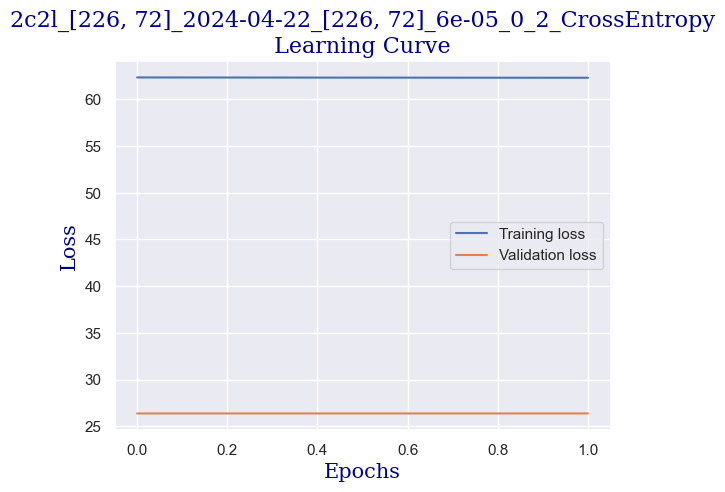

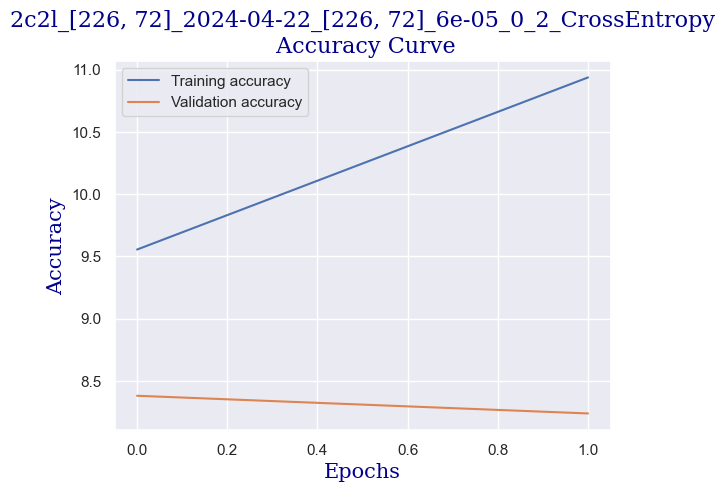

1024 1024
1024 1024


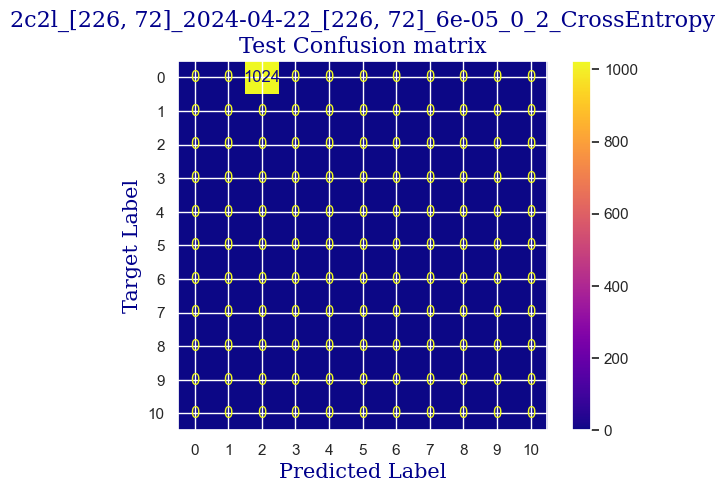

 
 END 2c2l [226, 72] Run Time:  177.2457277249996
lin lay 64512
Model:  2c2l  idx: 0 / 1
resolution:  [113, 36]  idx: 2 / 7
learning rate:  0.0001  idx: 0 / 2
weight decay:  0  idx: 0 / 2
scheduler:  0  idx: 0 / 1
seed:  8  idx: 0 / 2
loss function:  MSE  idx: 0 / 2
Batch size:  64
Training epochs:  2
start time:  6623.251495783
6610.81118836
Before model init - Current allocated memory (GB): 0.41786956787109375
After model init, Before data loading - Current allocated memory (GB): 0.4420285224914551
After data loading - Current allocated memory (GB): 0.4420285224914551


  0%|                                                        | 0/2 [00:00<?, ?it/s]

Training...


/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


training..  2
train accuracy:  8.413461538461538
validating...


 50%|████████████████████████                        | 1/2 [00:01<00:01,  1.96s/it]

validation accuracy:  9.232954545454545
Training...


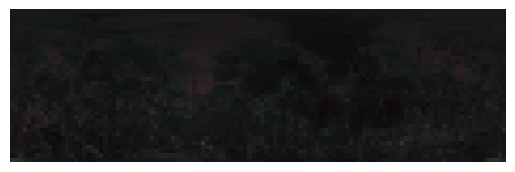

training..  2
train accuracy:  9.254807692307693
validating...


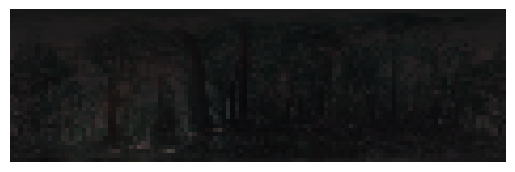

100%|████████████████████████████████████████████████| 2/2 [00:04<00:00,  2.02s/it]

validation accuracy:  9.517045454545455


9.27734375
 
 train Acc:  9.254807692307693
 
 val Acc:  9.517045454545455
 
 test Acc:  9.27734375


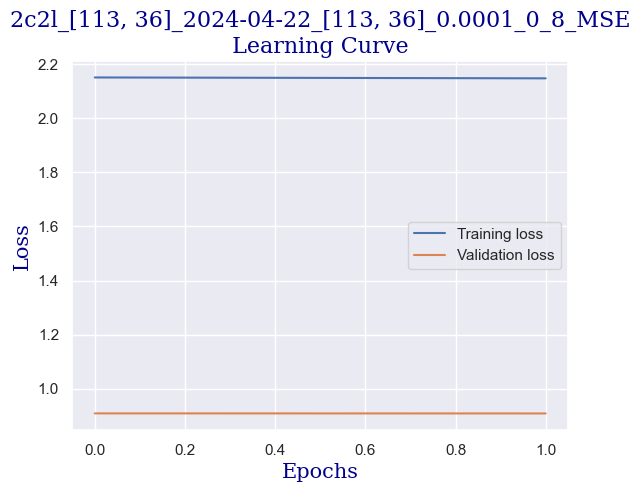

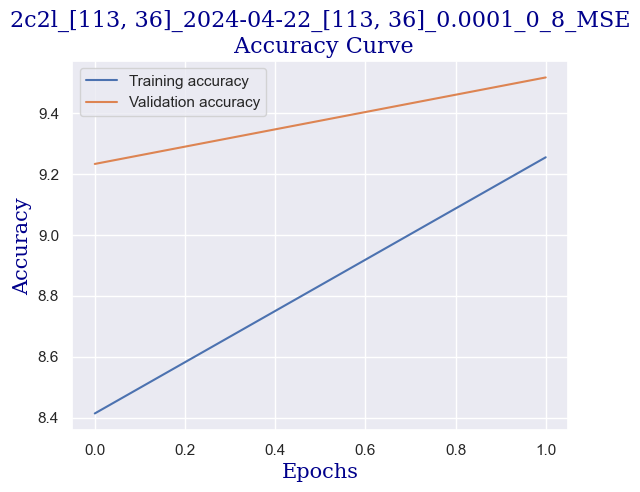

1024 1024
1024 1024


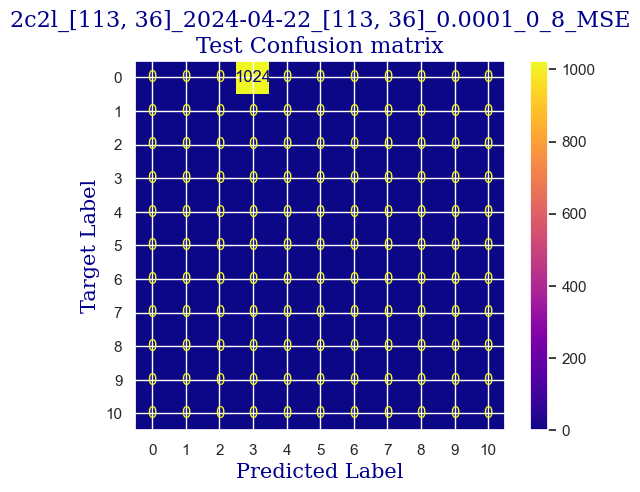

 
 END 2c2l [113, 36] Run Time:  8.010248515000058
Model:  2c2l  idx: 0 / 1
resolution:  [113, 36]  idx: 2 / 7
learning rate:  0.0001  idx: 0 / 2
weight decay:  0  idx: 0 / 2
scheduler:  0  idx: 0 / 1
seed:  8  idx: 0 / 2
loss function:  CrossEntropy  idx: 1 / 2
Batch size:  64
Training epochs:  2
start time:  6631.262858344
6618.8225464570005
Before model init - Current allocated memory (GB): 0.11574554443359375
After model init, Before data loading - Current allocated memory (GB): 0.13990449905395508
After data loading - Current allocated memory (GB): 0.13990449905395508


  0%|                                                        | 0/2 [00:00<?, ?it/s]

Training...


/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


training..  2
train accuracy:  9.254807692307693
validating...


 50%|████████████████████████                        | 1/2 [00:02<00:02,  2.06s/it]

validation accuracy:  8.806818181818182
Training...


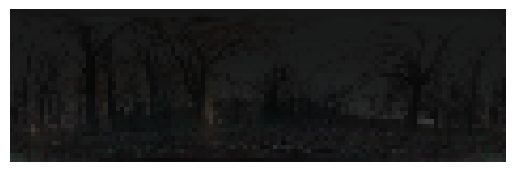

training..  2
train accuracy:  10.276442307692307
validating...


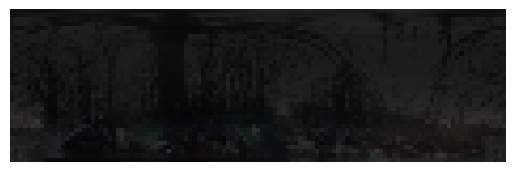

100%|████████████████████████████████████████████████| 2/2 [00:04<00:00,  2.08s/it]

validation accuracy:  8.948863636363637


9.9609375
 
 train Acc:  10.276442307692307
 
 val Acc:  8.948863636363637
 
 test Acc:  9.9609375


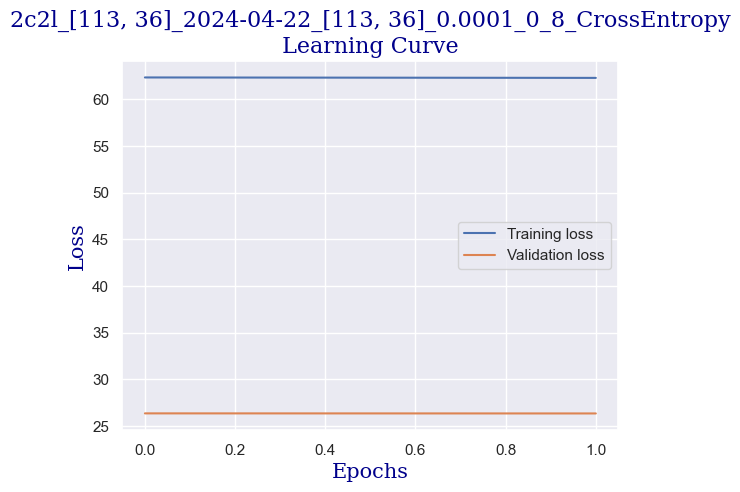

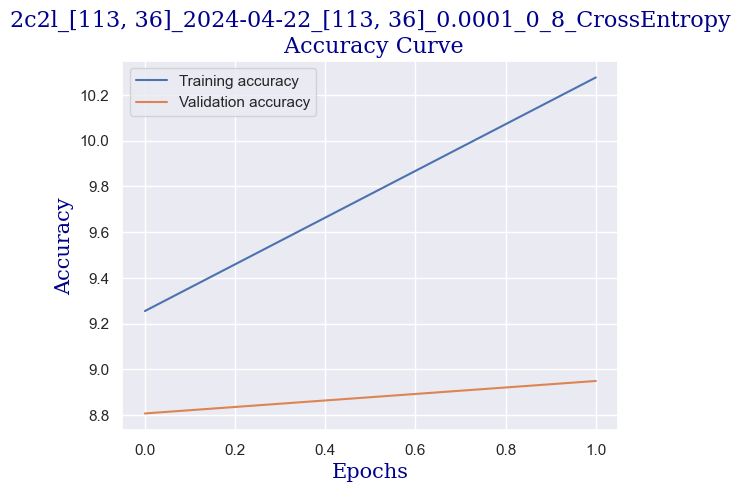

1024 1024
1024 1024


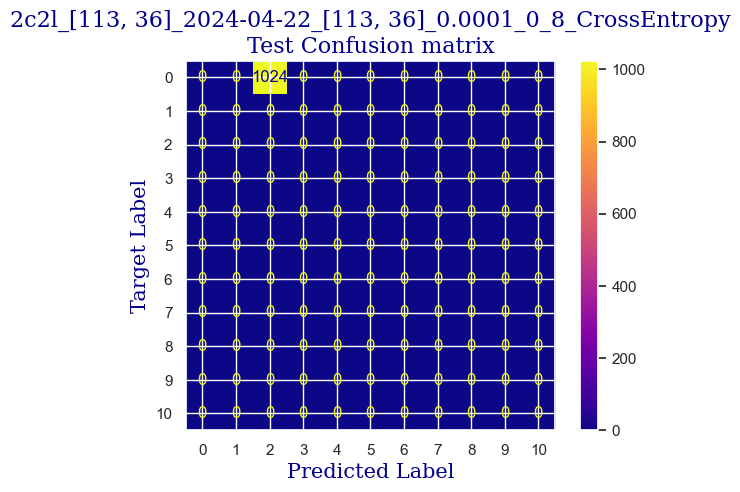

 
 END 2c2l [113, 36] Run Time:  8.10323649699967
Model:  2c2l  idx: 0 / 1
resolution:  [113, 36]  idx: 2 / 7
learning rate:  0.0001  idx: 0 / 2
weight decay:  0  idx: 0 / 2
scheduler:  0  idx: 0 / 1
seed:  2  idx: 1 / 2
loss function:  MSE  idx: 0 / 2
Batch size:  64
Training epochs:  2
start time:  6639.36827608
6626.9281393090005
Before model init - Current allocated memory (GB): 0.11574554443359375
After model init, Before data loading - Current allocated memory (GB): 0.13990449905395508
After data loading - Current allocated memory (GB): 0.13990449905395508


  0%|                                                        | 0/2 [00:00<?, ?it/s]

Training...


/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


training..  2
train accuracy:  9.375
validating...


 50%|████████████████████████                        | 1/2 [00:01<00:01,  1.99s/it]

validation accuracy:  8.238636363636363
Training...


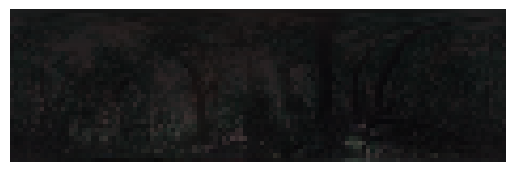

training..  2
train accuracy:  10.997596153846153
validating...


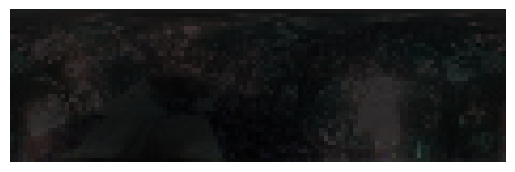

100%|████████████████████████████████████████████████| 2/2 [00:04<00:00,  2.02s/it]

validation accuracy:  8.096590909090908


8.984375
 
 train Acc:  10.997596153846153
 
 val Acc:  8.096590909090908
 
 test Acc:  8.984375


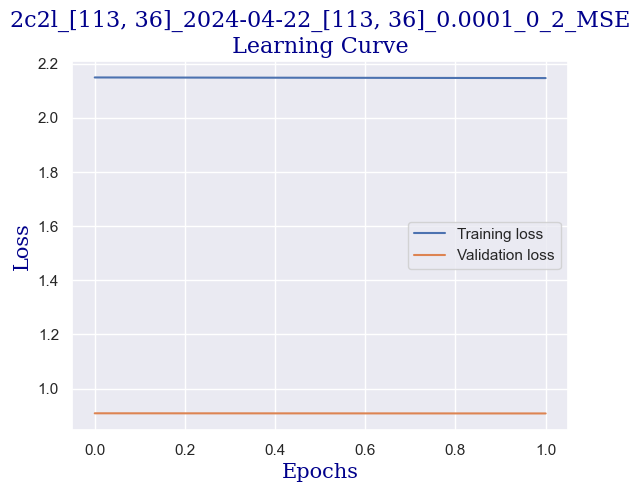

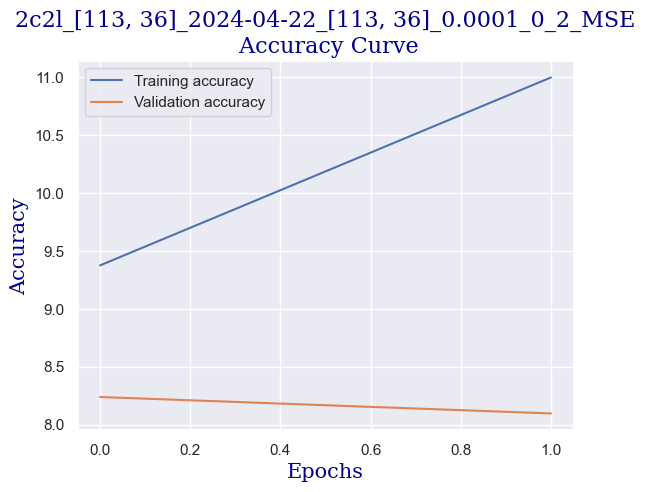

1024 1024
1024 1024


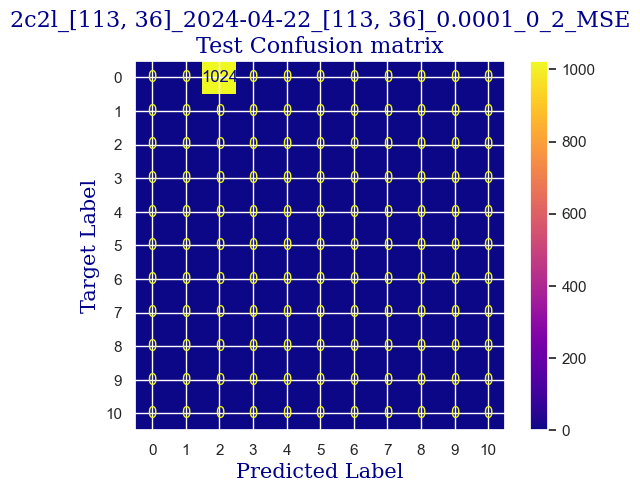

 
 END 2c2l [113, 36] Run Time:  8.093275223999626
Model:  2c2l  idx: 0 / 1
resolution:  [113, 36]  idx: 2 / 7
learning rate:  0.0001  idx: 0 / 2
weight decay:  0  idx: 0 / 2
scheduler:  0  idx: 0 / 1
seed:  2  idx: 1 / 2
loss function:  CrossEntropy  idx: 1 / 2
Batch size:  64
Training epochs:  2
start time:  6647.46280926
6635.022498262
Before model init - Current allocated memory (GB): 0.115997314453125
After model init, Before data loading - Current allocated memory (GB): 0.14015626907348633
After data loading - Current allocated memory (GB): 0.14015626907348633


  0%|                                                        | 0/2 [00:00<?, ?it/s]

Training...


/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


training..  2
train accuracy:  9.85576923076923
validating...


 50%|████████████████████████                        | 1/2 [00:01<00:01,  1.99s/it]

validation accuracy:  9.801136363636363
Training...


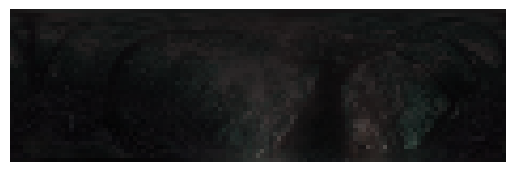

training..  2
train accuracy:  10.336538461538462
validating...


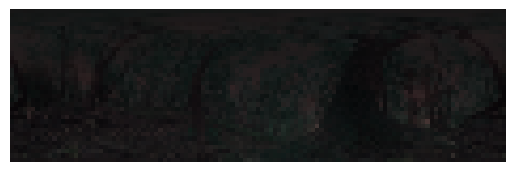

100%|████████████████████████████████████████████████| 2/2 [00:04<00:00,  2.03s/it]

validation accuracy:  8.096590909090908


8.69140625
 
 train Acc:  10.336538461538462
 
 val Acc:  8.096590909090908
 
 test Acc:  8.69140625


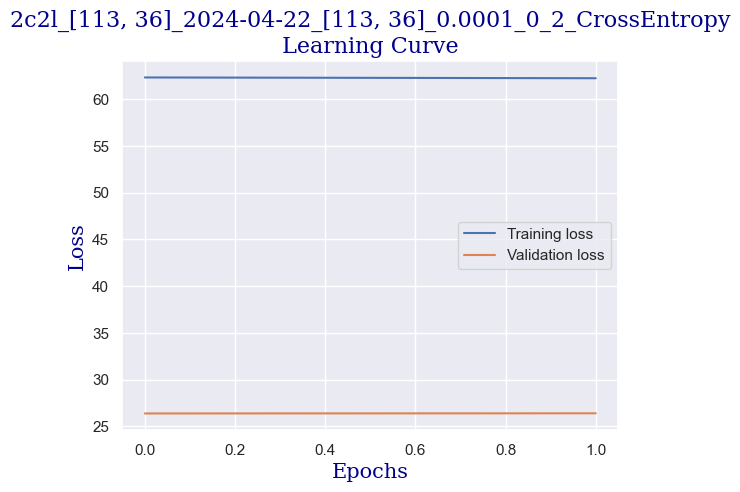

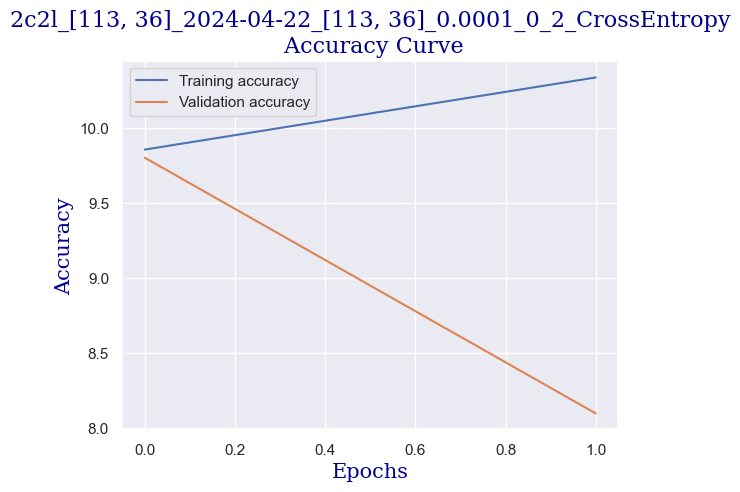

1024 1024
1024 1024


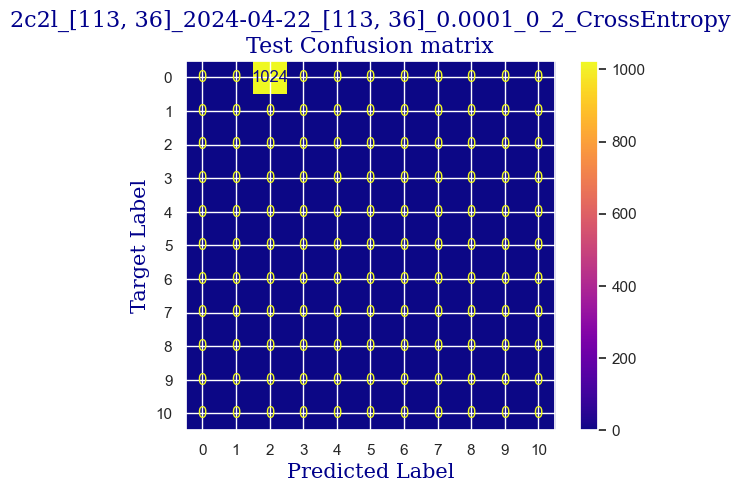

 
 END 2c2l [113, 36] Run Time:  7.974351239000498
Model:  2c2l  idx: 0 / 1
resolution:  [113, 36]  idx: 2 / 7
learning rate:  0.0001  idx: 0 / 2
weight decay:  4e-05  idx: 1 / 2
scheduler:  0  idx: 0 / 1
seed:  8  idx: 0 / 2
loss function:  MSE  idx: 0 / 2
Batch size:  64
Training epochs:  2
start time:  6655.43981131
6642.999588685
Before model init - Current allocated memory (GB): 0.115997314453125
After model init, Before data loading - Current allocated memory (GB): 0.14015626907348633
After data loading - Current allocated memory (GB): 0.14015626907348633


  0%|                                                        | 0/2 [00:00<?, ?it/s]

Training...


/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


training..  2
train accuracy:  8.413461538461538
validating...


 50%|████████████████████████                        | 1/2 [00:01<00:01,  1.94s/it]

validation accuracy:  9.375
Training...


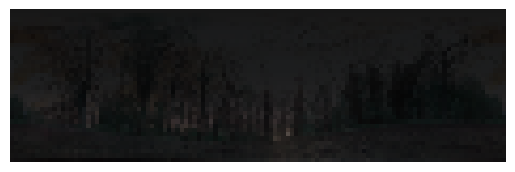

training..  2
train accuracy:  8.834134615384617
validating...


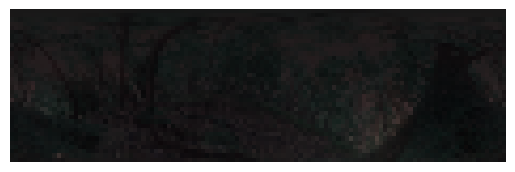

100%|████████████████████████████████████████████████| 2/2 [00:04<00:00,  2.00s/it]

validation accuracy:  9.517045454545455


9.27734375
 
 train Acc:  8.834134615384617
 
 val Acc:  9.517045454545455
 
 test Acc:  9.27734375


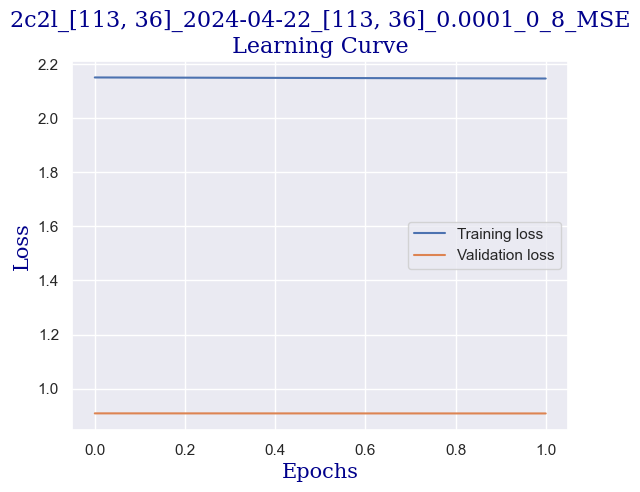

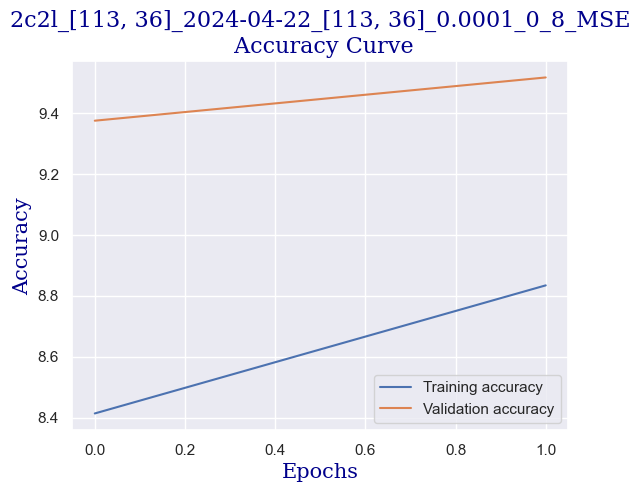

1024 1024
1024 1024


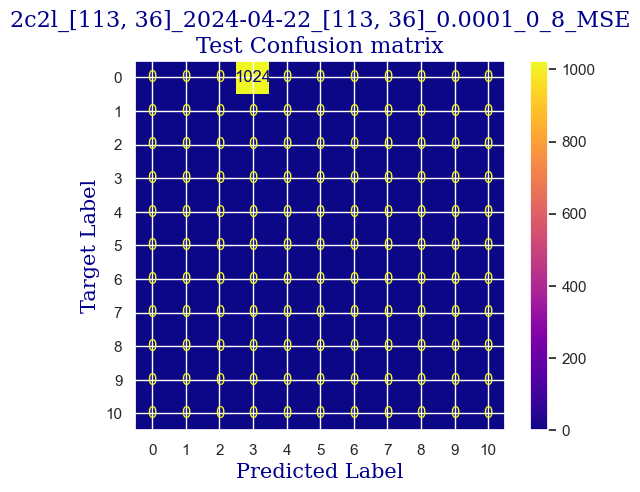

 
 END 2c2l [113, 36] Run Time:  8.0414927060001
Model:  2c2l  idx: 0 / 1
resolution:  [113, 36]  idx: 2 / 7
learning rate:  0.0001  idx: 0 / 2
weight decay:  4e-05  idx: 1 / 2
scheduler:  0  idx: 0 / 1
seed:  8  idx: 0 / 2
loss function:  CrossEntropy  idx: 1 / 2
Batch size:  64
Training epochs:  2
start time:  6663.482555387
6651.042242633001
Before model init - Current allocated memory (GB): 0.11574554443359375
After model init, Before data loading - Current allocated memory (GB): 0.13990449905395508
After data loading - Current allocated memory (GB): 0.13990449905395508


  0%|                                                        | 0/2 [00:00<?, ?it/s]

Training...


/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


training..  2
train accuracy:  7.992788461538461
validating...


 50%|████████████████████████                        | 1/2 [00:01<00:01,  1.95s/it]

validation accuracy:  9.375
Training...


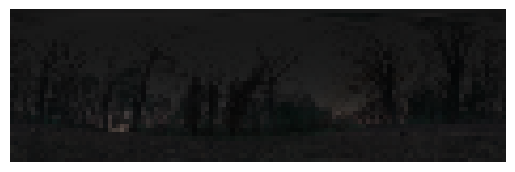

training..  2
train accuracy:  9.495192307692307
validating...


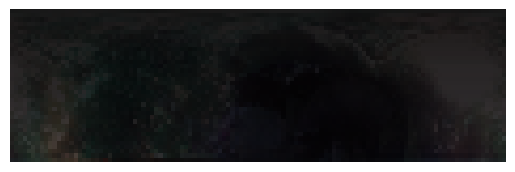

100%|████████████████████████████████████████████████| 2/2 [00:03<00:00,  2.00s/it]

validation accuracy:  8.664772727272728


8.203125
 
 train Acc:  9.495192307692307
 
 val Acc:  8.664772727272728
 
 test Acc:  8.203125


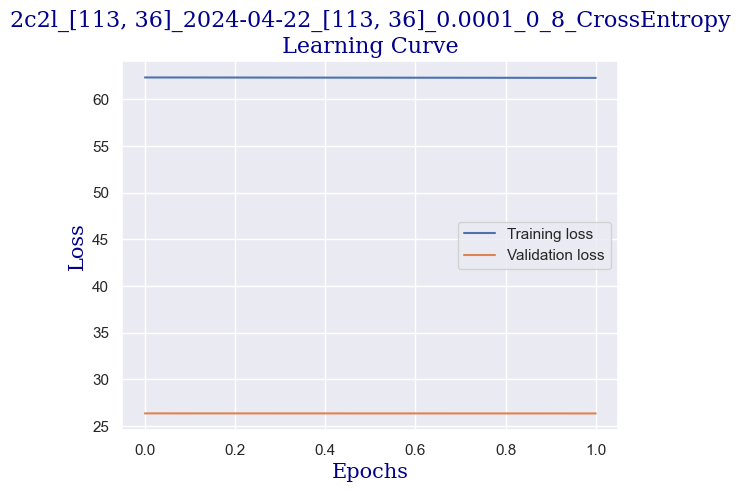

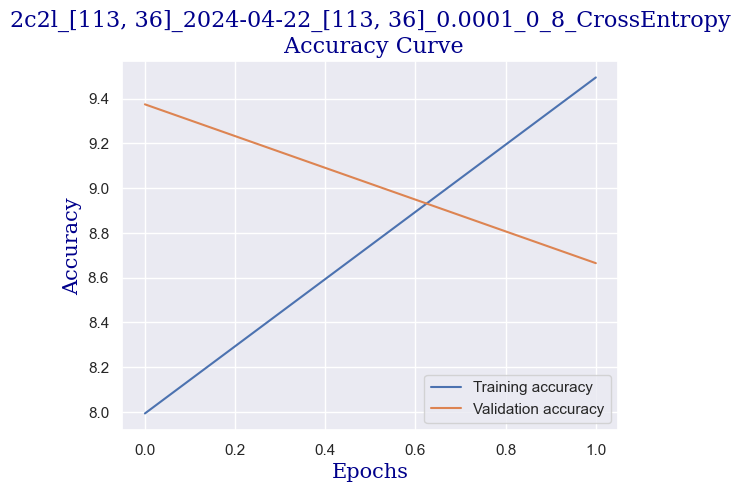

1024 1024
1024 1024


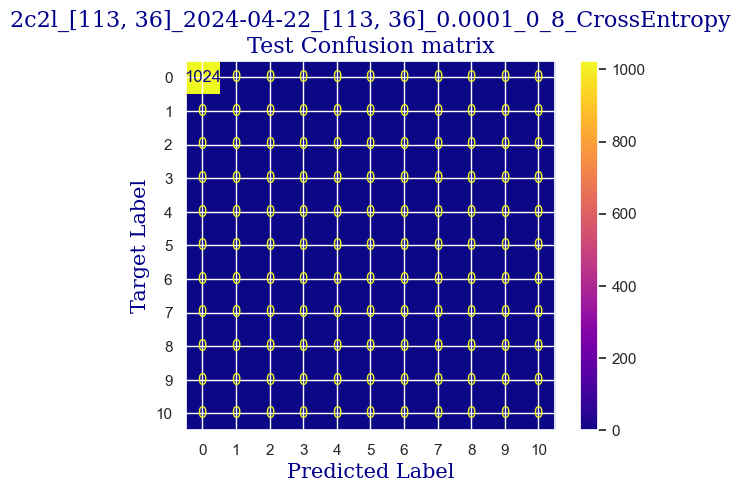

 
 END 2c2l [113, 36] Run Time:  7.949550989000272
Model:  2c2l  idx: 0 / 1
resolution:  [113, 36]  idx: 2 / 7
learning rate:  0.0001  idx: 0 / 2
weight decay:  4e-05  idx: 1 / 2
scheduler:  0  idx: 0 / 1
seed:  2  idx: 1 / 2
loss function:  MSE  idx: 0 / 2
Batch size:  64
Training epochs:  2
start time:  6671.433401568
6658.99308742
Before model init - Current allocated memory (GB): 0.11574554443359375
After model init, Before data loading - Current allocated memory (GB): 0.13990449905395508
After data loading - Current allocated memory (GB): 0.13990449905395508


  0%|                                                        | 0/2 [00:00<?, ?it/s]

Training...


/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


training..  2
train accuracy:  9.735576923076923
validating...


 50%|████████████████████████                        | 1/2 [00:01<00:01,  1.95s/it]

validation accuracy:  8.380681818181818
Training...


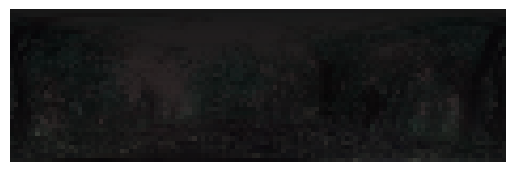

training..  2
train accuracy:  10.276442307692307
validating...


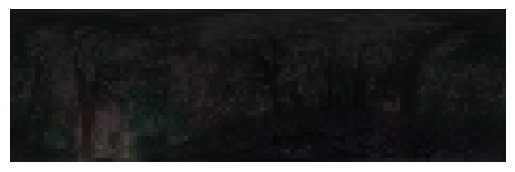

100%|████████████████████████████████████████████████| 2/2 [00:03<00:00,  1.99s/it]

validation accuracy:  8.380681818181818


9.08203125
 
 train Acc:  10.276442307692307
 
 val Acc:  8.380681818181818
 
 test Acc:  9.08203125


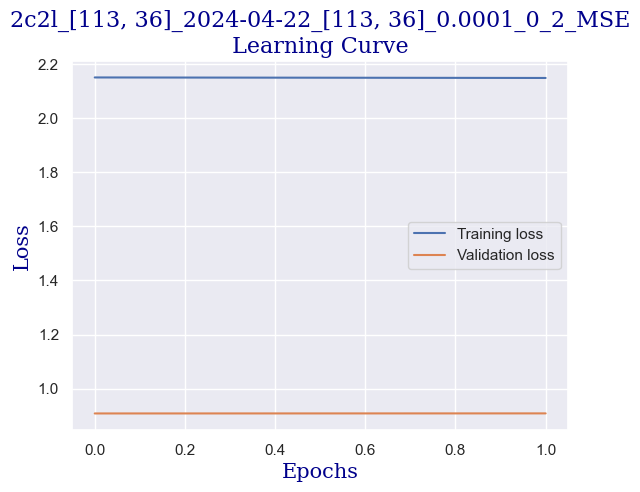

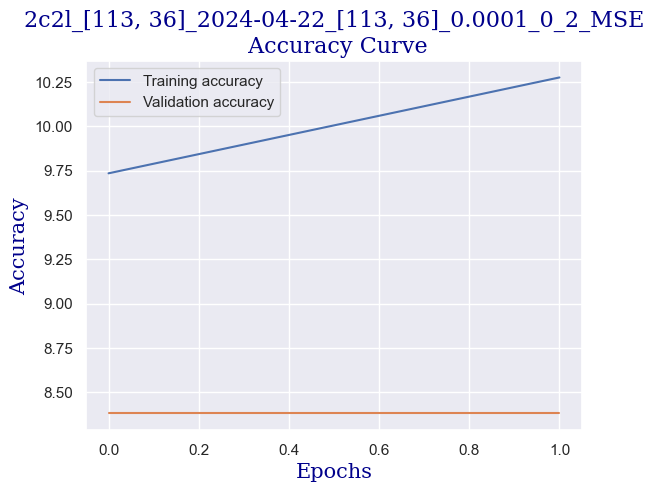

1024 1024
1024 1024


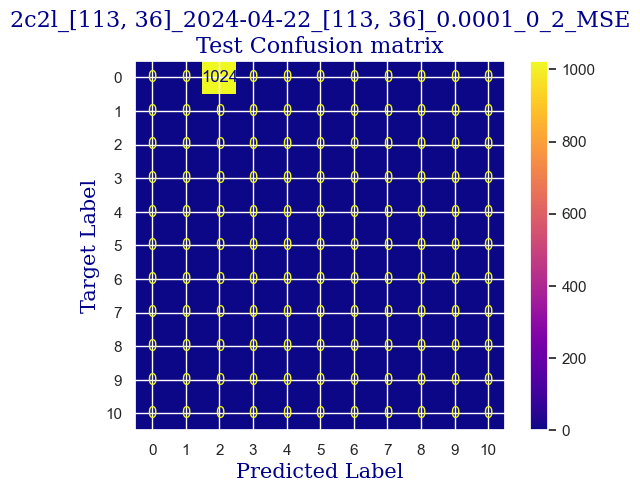

 
 END 2c2l [113, 36] Run Time:  8.044312325000647
Model:  2c2l  idx: 0 / 1
resolution:  [113, 36]  idx: 2 / 7
learning rate:  0.0001  idx: 0 / 2
weight decay:  4e-05  idx: 1 / 2
scheduler:  0  idx: 0 / 1
seed:  2  idx: 1 / 2
loss function:  CrossEntropy  idx: 1 / 2
Batch size:  64
Training epochs:  2
start time:  6679.478852803
6667.038540999
Before model init - Current allocated memory (GB): 0.11574554443359375
After model init, Before data loading - Current allocated memory (GB): 0.13990449905395508
After data loading - Current allocated memory (GB): 0.13990449905395508


  0%|                                                        | 0/2 [00:00<?, ?it/s]

Training...


/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


training..  2
train accuracy:  9.07451923076923
validating...


 50%|████████████████████████                        | 1/2 [00:01<00:01,  1.96s/it]

validation accuracy:  10.227272727272728
Training...


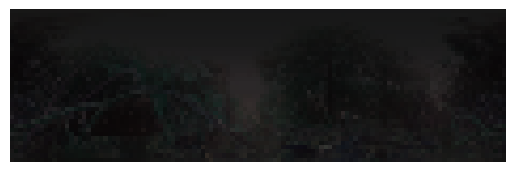

training..  2
train accuracy:  9.975961538461538
validating...


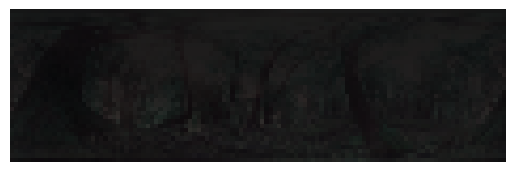

100%|████████████████████████████████████████████████| 2/2 [00:03<00:00,  1.99s/it]

validation accuracy:  10.085227272727272


10.05859375
 
 train Acc:  9.975961538461538
 
 val Acc:  10.085227272727272
 
 test Acc:  10.05859375


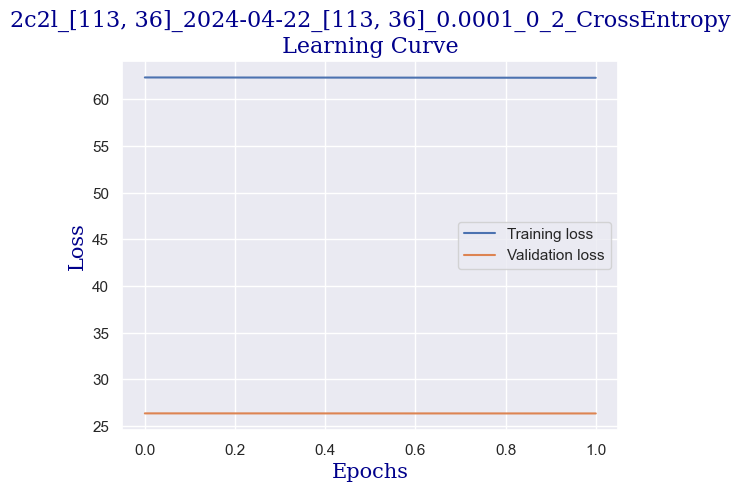

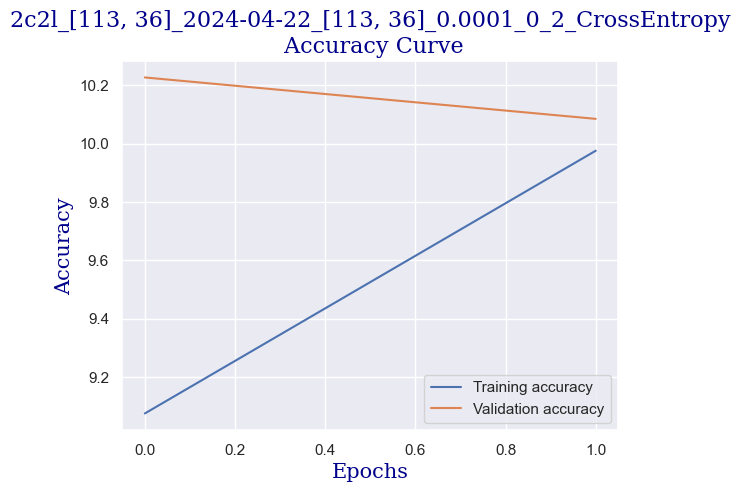

1024 1024
1024 1024


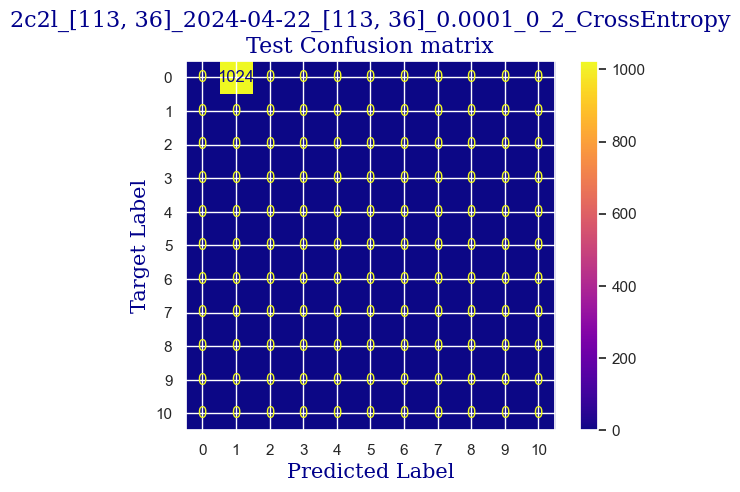

 
 END 2c2l [113, 36] Run Time:  8.053374303000055
Model:  2c2l  idx: 0 / 1
resolution:  [113, 36]  idx: 2 / 7
learning rate:  6e-05  idx: 1 / 2
weight decay:  0  idx: 0 / 2
scheduler:  0  idx: 0 / 1
seed:  8  idx: 0 / 2
loss function:  MSE  idx: 0 / 2
Batch size:  64
Training epochs:  2
start time:  6687.533913797
6675.093609797
Before model init - Current allocated memory (GB): 0.11574554443359375
After model init, Before data loading - Current allocated memory (GB): 0.13990449905395508
After data loading - Current allocated memory (GB): 0.13990449905395508


  0%|                                                        | 0/2 [00:00<?, ?it/s]

Training...


/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


training..  2
train accuracy:  9.194711538461538
validating...


 50%|████████████████████████                        | 1/2 [00:02<00:02,  2.00s/it]

validation accuracy:  9.659090909090908
Training...


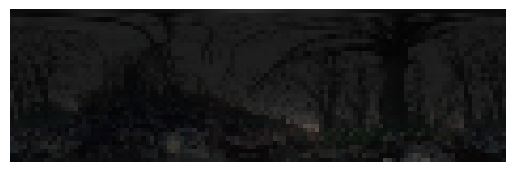

training..  2
train accuracy:  9.314903846153847
validating...


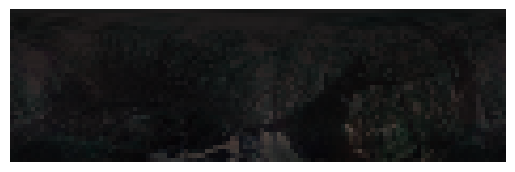

100%|████████████████████████████████████████████████| 2/2 [00:04<00:00,  2.07s/it]

validation accuracy:  9.232954545454545


7.421875
 
 train Acc:  9.314903846153847
 
 val Acc:  9.232954545454545
 
 test Acc:  7.421875


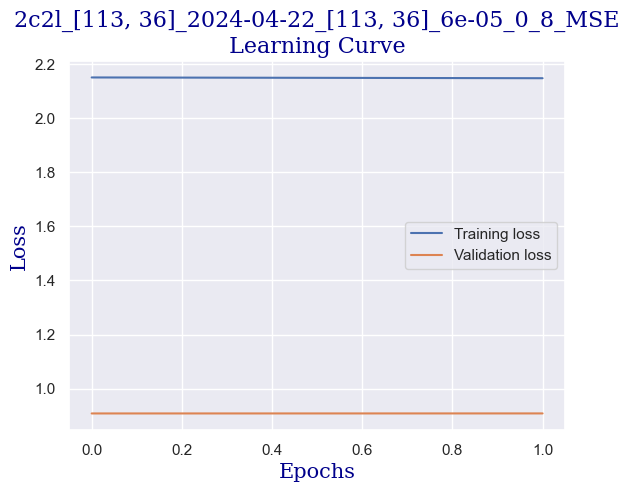

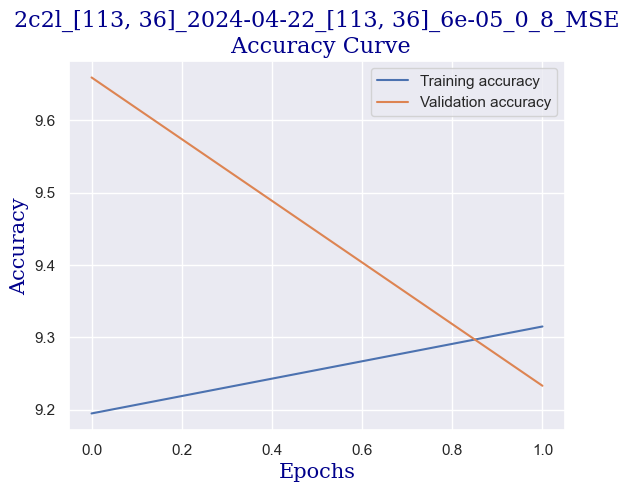

1024 1024
1024 1024


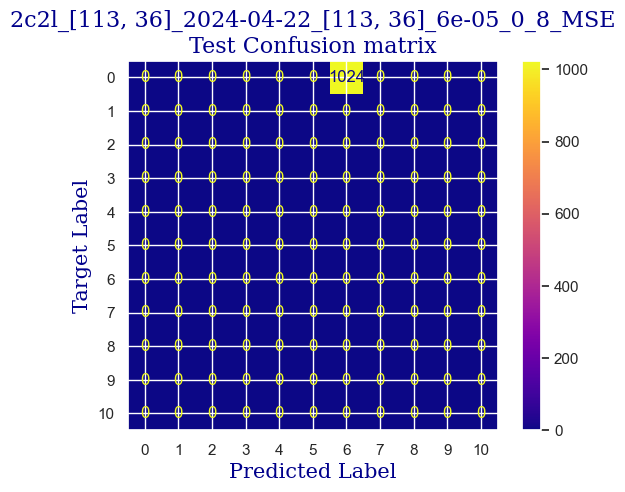

 
 END 2c2l [113, 36] Run Time:  8.063907741999174
Model:  2c2l  idx: 0 / 1
resolution:  [113, 36]  idx: 2 / 7
learning rate:  6e-05  idx: 1 / 2
weight decay:  0  idx: 0 / 2
scheduler:  0  idx: 0 / 1
seed:  8  idx: 0 / 2
loss function:  CrossEntropy  idx: 1 / 2
Batch size:  64
Training epochs:  2
start time:  6695.598941583
6683.15862843
Before model init - Current allocated memory (GB): 0.11574554443359375
After model init, Before data loading - Current allocated memory (GB): 0.13990449905395508
After data loading - Current allocated memory (GB): 0.13990449905395508


  0%|                                                        | 0/2 [00:00<?, ?it/s]

Training...


/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


training..  2
train accuracy:  9.375
validating...


 50%|████████████████████████                        | 1/2 [00:02<00:02,  2.04s/it]

validation accuracy:  10.369318181818182
Training...


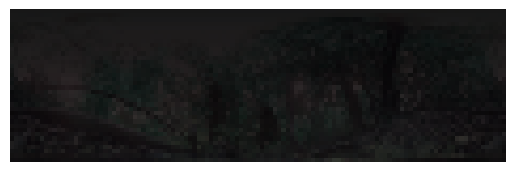

training..  2
train accuracy:  9.254807692307693
validating...


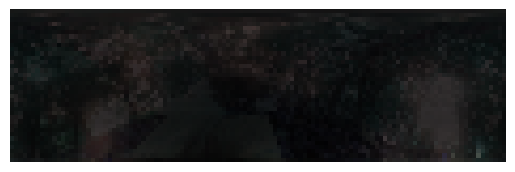

100%|████████████████████████████████████████████████| 2/2 [00:04<00:00,  2.03s/it]

validation accuracy:  9.375


8.984375
 
 train Acc:  9.254807692307693
 
 val Acc:  9.375
 
 test Acc:  8.984375


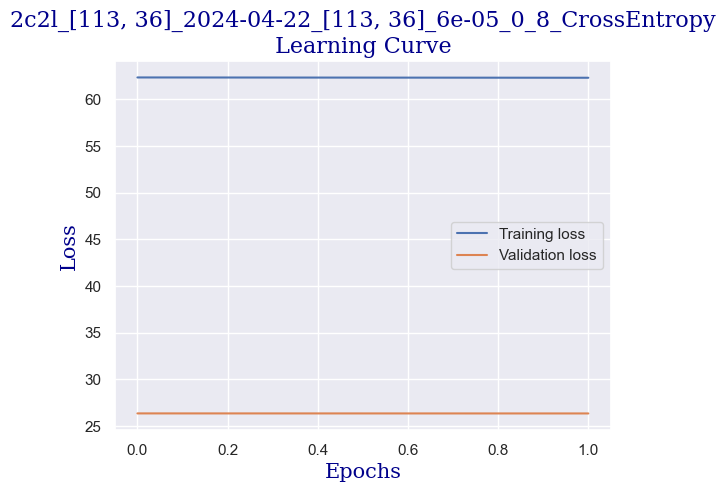

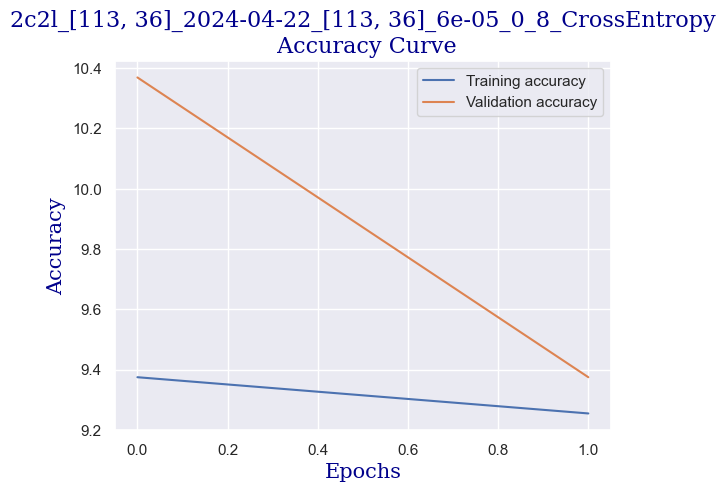

1024 1024
1024 1024


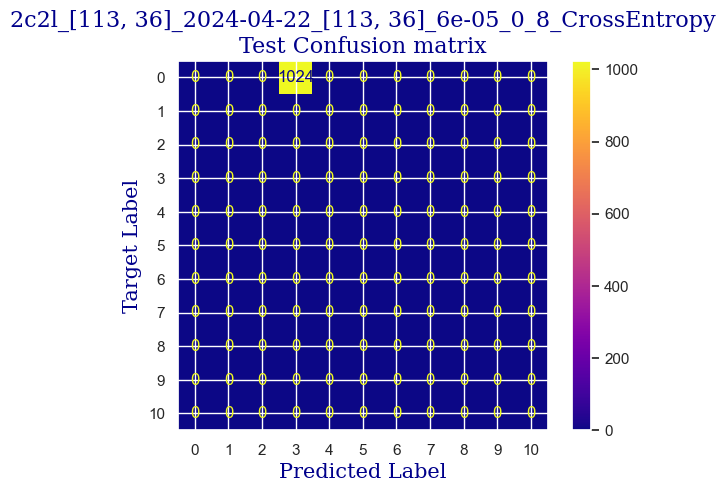

 
 END 2c2l [113, 36] Run Time:  8.123262981000153
Model:  2c2l  idx: 0 / 1
resolution:  [113, 36]  idx: 2 / 7
learning rate:  6e-05  idx: 1 / 2
weight decay:  0  idx: 0 / 2
scheduler:  0  idx: 0 / 1
seed:  2  idx: 1 / 2
loss function:  MSE  idx: 0 / 2
Batch size:  64
Training epochs:  2
start time:  6703.723454318
6691.2831417590005
Before model init - Current allocated memory (GB): 0.11574554443359375
After model init, Before data loading - Current allocated memory (GB): 0.13990449905395508
After data loading - Current allocated memory (GB): 0.13990449905395508


  0%|                                                        | 0/2 [00:00<?, ?it/s]

Training...


/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


training..  2
train accuracy:  9.194711538461538
validating...


 50%|████████████████████████                        | 1/2 [00:01<00:01,  1.99s/it]

validation accuracy:  8.380681818181818
Training...


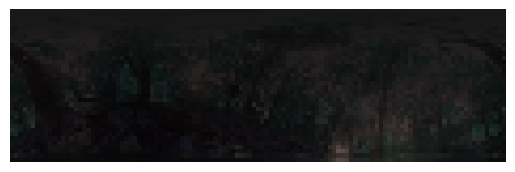

training..  2
train accuracy:  10.576923076923077
validating...


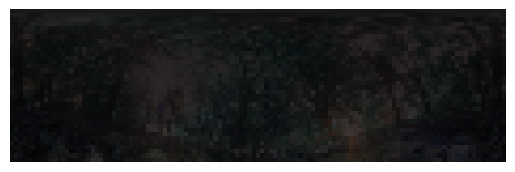

100%|████████████████████████████████████████████████| 2/2 [00:04<00:00,  2.04s/it]

validation accuracy:  8.380681818181818


8.984375
 
 train Acc:  10.576923076923077
 
 val Acc:  8.380681818181818
 
 test Acc:  8.984375


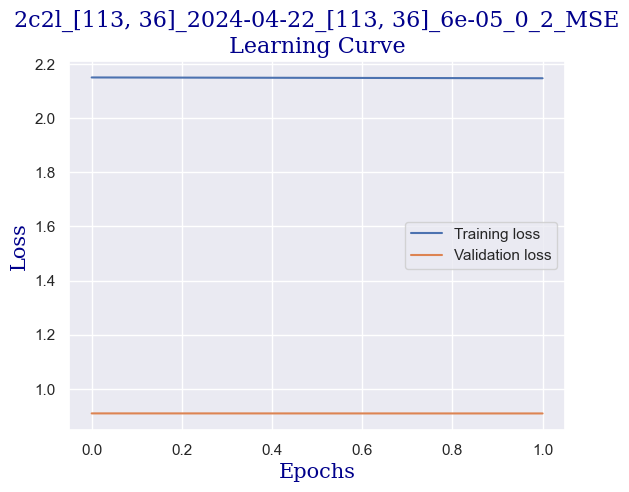

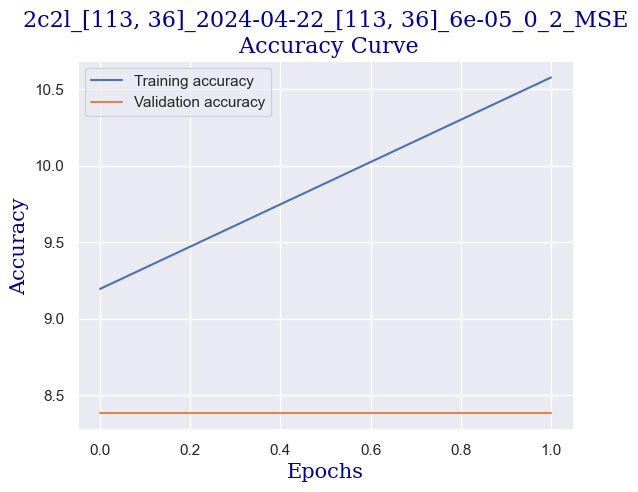

1024 1024
1024 1024


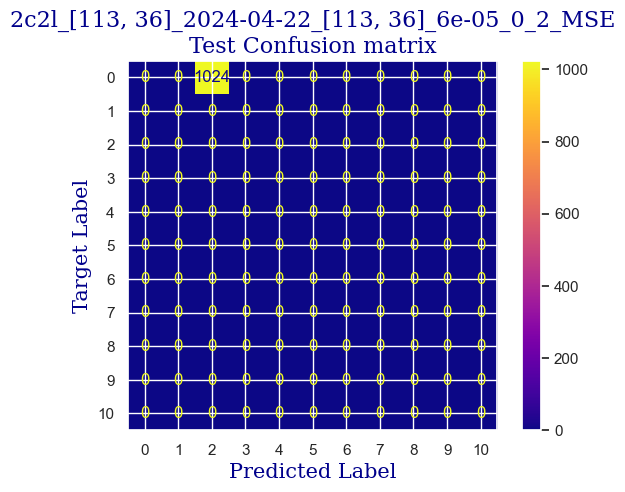

 
 END 2c2l [113, 36] Run Time:  8.00033208700006
Model:  2c2l  idx: 0 / 1
resolution:  [113, 36]  idx: 2 / 7
learning rate:  6e-05  idx: 1 / 2
weight decay:  0  idx: 0 / 2
scheduler:  0  idx: 0 / 1
seed:  2  idx: 1 / 2
loss function:  CrossEntropy  idx: 1 / 2
Batch size:  64
Training epochs:  2
start time:  6711.724904376
6699.284590226001
Before model init - Current allocated memory (GB): 0.11574554443359375
After model init, Before data loading - Current allocated memory (GB): 0.13990449905395508
After data loading - Current allocated memory (GB): 0.13990449905395508


  0%|                                                        | 0/2 [00:00<?, ?it/s]

Training...


/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


training..  2
train accuracy:  9.615384615384617
validating...


 50%|████████████████████████                        | 1/2 [00:01<00:01,  1.96s/it]

validation accuracy:  8.380681818181818
Training...


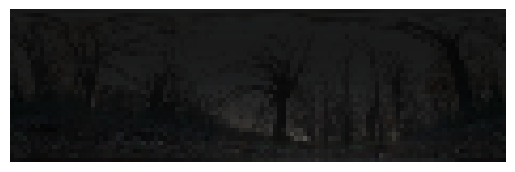

training..  2
train accuracy:  11.057692307692307
validating...


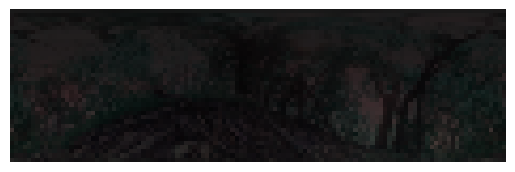

100%|████████████████████████████████████████████████| 2/2 [00:04<00:00,  2.02s/it]

validation accuracy:  8.522727272727272


8.7890625
 
 train Acc:  11.057692307692307
 
 val Acc:  8.522727272727272
 
 test Acc:  8.7890625


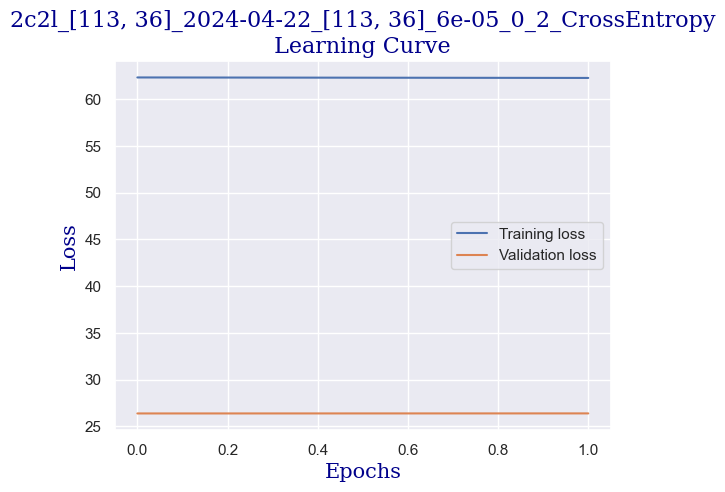

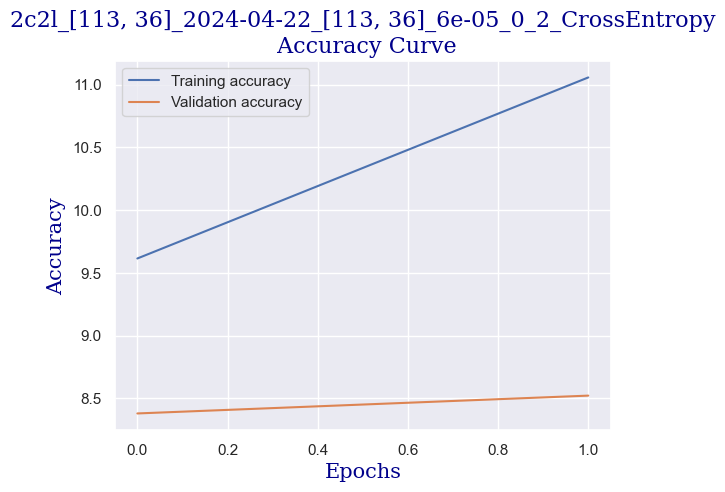

1024 1024
1024 1024


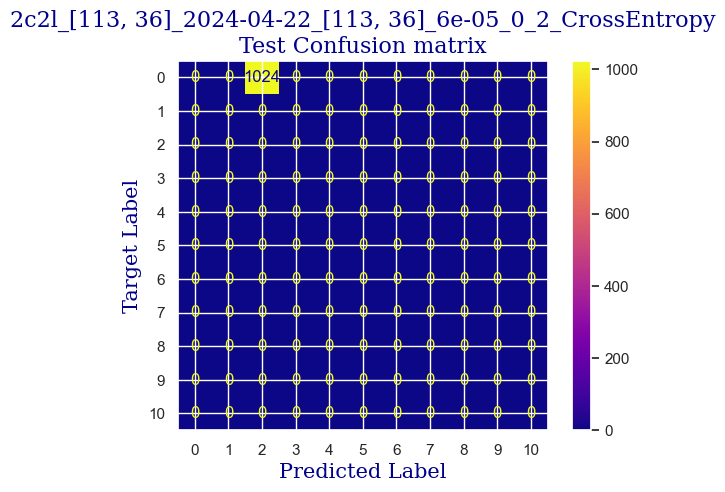

 
 END 2c2l [113, 36] Run Time:  8.089956867999717
Model:  2c2l  idx: 0 / 1
resolution:  [113, 36]  idx: 2 / 7
learning rate:  6e-05  idx: 1 / 2
weight decay:  4e-05  idx: 1 / 2
scheduler:  0  idx: 0 / 1
seed:  8  idx: 0 / 2
loss function:  MSE  idx: 0 / 2
Batch size:  64
Training epochs:  2
start time:  6719.815986266
6707.375671201
Before model init - Current allocated memory (GB): 0.11574554443359375
After model init, Before data loading - Current allocated memory (GB): 0.13990449905395508
After data loading - Current allocated memory (GB): 0.13990449905395508


  0%|                                                        | 0/2 [00:00<?, ?it/s]

Training...


/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


training..  2
train accuracy:  10.45673076923077
validating...


 50%|████████████████████████                        | 1/2 [00:01<00:01,  1.96s/it]

validation accuracy:  9.090909090909092
Training...


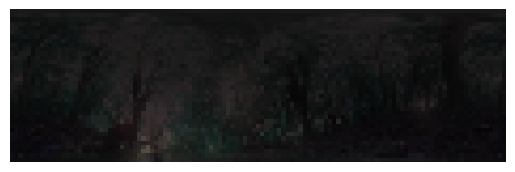

training..  2
train accuracy:  9.975961538461538
validating...


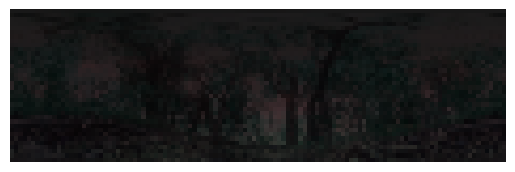

100%|████████████████████████████████████████████████| 2/2 [00:04<00:00,  2.03s/it]

validation accuracy:  9.375


9.9609375
 
 train Acc:  9.975961538461538
 
 val Acc:  9.375
 
 test Acc:  9.9609375


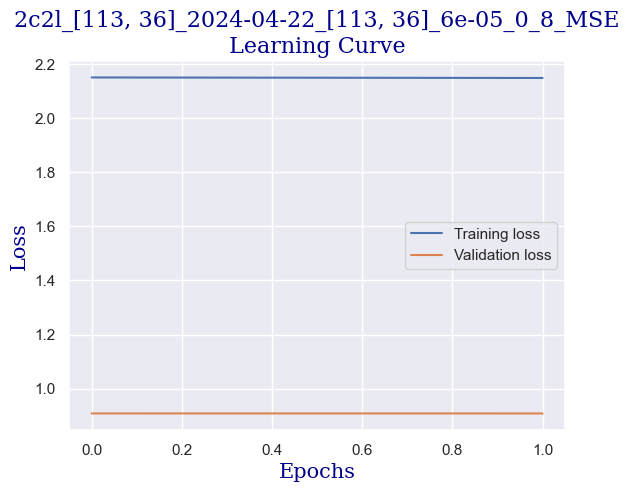

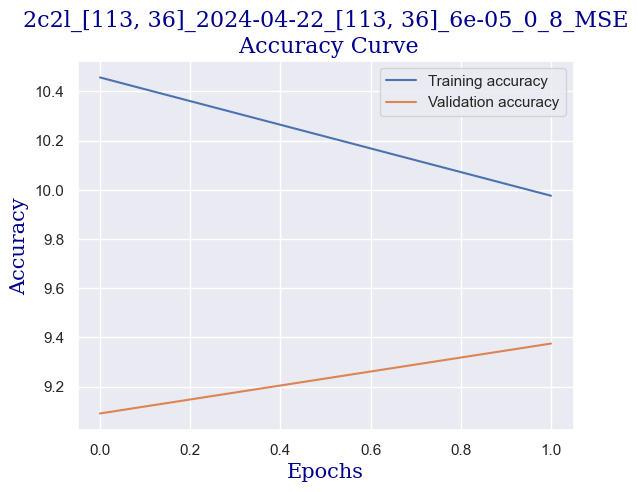

1024 1024
1024 1024


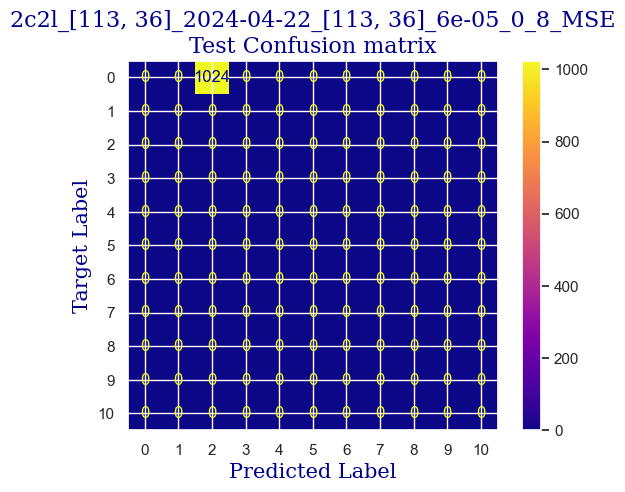

 
 END 2c2l [113, 36] Run Time:  8.115418447999218
Model:  2c2l  idx: 0 / 1
resolution:  [113, 36]  idx: 2 / 7
learning rate:  6e-05  idx: 1 / 2
weight decay:  4e-05  idx: 1 / 2
scheduler:  0  idx: 0 / 1
seed:  8  idx: 0 / 2
loss function:  CrossEntropy  idx: 1 / 2
Batch size:  64
Training epochs:  2
start time:  6727.932784596
6715.492473570001
Before model init - Current allocated memory (GB): 0.11574554443359375
After model init, Before data loading - Current allocated memory (GB): 0.13990449905395508
After data loading - Current allocated memory (GB): 0.13990449905395508


  0%|                                                        | 0/2 [00:00<?, ?it/s]

Training...


/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


training..  2
train accuracy:  8.473557692307693
validating...


 50%|████████████████████████                        | 1/2 [00:01<00:01,  1.98s/it]

validation accuracy:  8.522727272727272
Training...


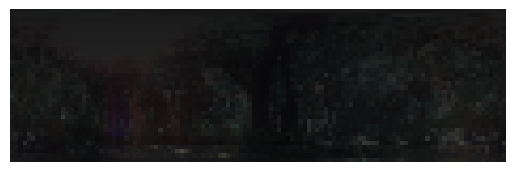

training..  2
train accuracy:  8.89423076923077
validating...


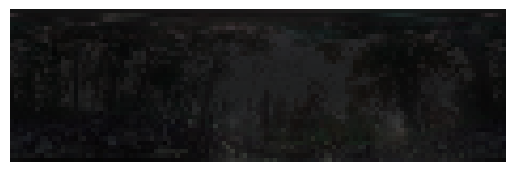

100%|████████████████████████████████████████████████| 2/2 [00:04<00:00,  2.02s/it]

validation accuracy:  9.517045454545455


9.47265625
 
 train Acc:  8.89423076923077
 
 val Acc:  9.517045454545455
 
 test Acc:  9.47265625


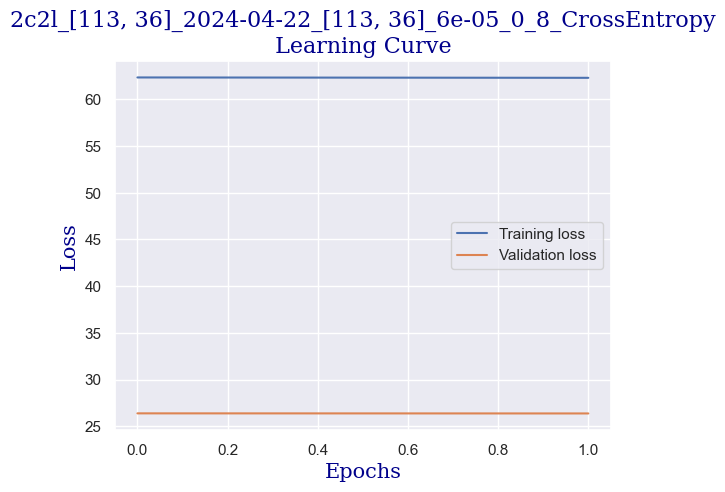

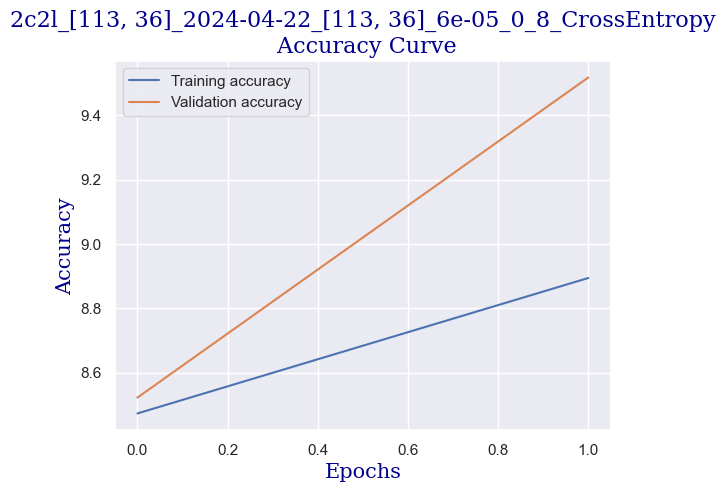

1024 1024
1024 1024


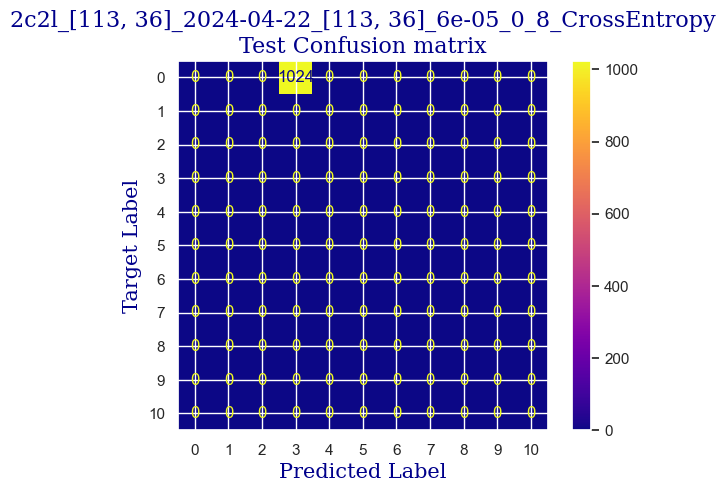

 
 END 2c2l [113, 36] Run Time:  7.9825709030001235
Model:  2c2l  idx: 0 / 1
resolution:  [113, 36]  idx: 2 / 7
learning rate:  6e-05  idx: 1 / 2
weight decay:  4e-05  idx: 1 / 2
scheduler:  0  idx: 0 / 1
seed:  2  idx: 1 / 2
loss function:  MSE  idx: 0 / 2
Batch size:  64
Training epochs:  2
start time:  6735.918091772
6723.477820914
Before model init - Current allocated memory (GB): 0.11574554443359375
After model init, Before data loading - Current allocated memory (GB): 0.13990449905395508
After data loading - Current allocated memory (GB): 0.13990449905395508


  0%|                                                        | 0/2 [00:00<?, ?it/s]

Training...


/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


training..  2
train accuracy:  9.014423076923077
validating...


 50%|████████████████████████                        | 1/2 [00:01<00:01,  1.95s/it]

validation accuracy:  9.943181818181818
Training...


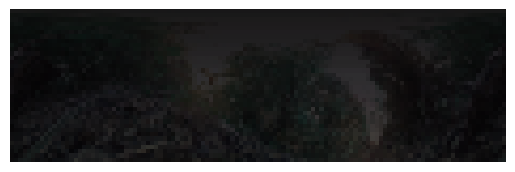

training..  2
train accuracy:  10.697115384615383
validating...


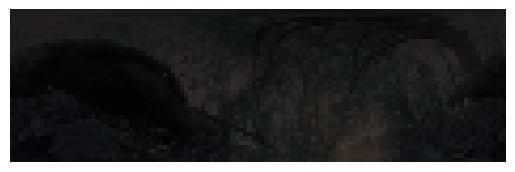

100%|████████████████████████████████████████████████| 2/2 [00:03<00:00,  1.98s/it]

validation accuracy:  10.085227272727272


10.15625
 
 train Acc:  10.697115384615383
 
 val Acc:  10.085227272727272
 
 test Acc:  10.15625


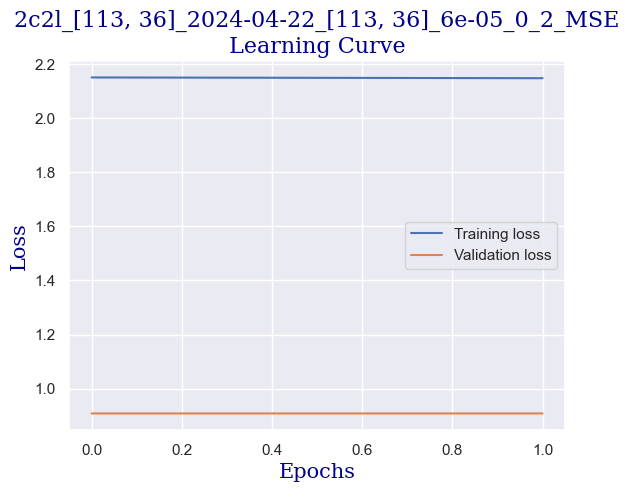

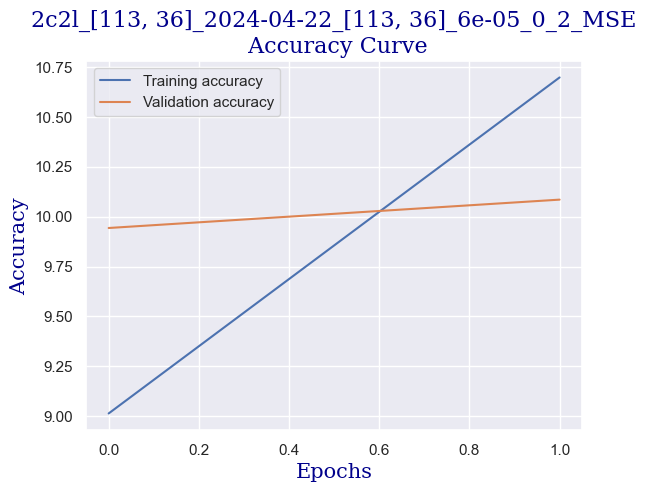

1024 1024
1024 1024


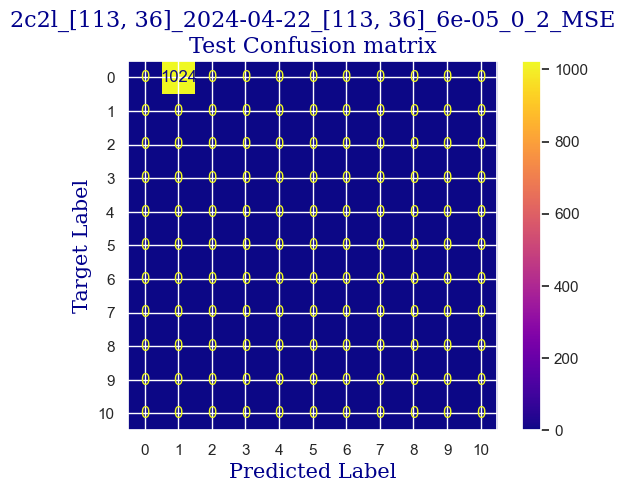

 
 END 2c2l [113, 36] Run Time:  8.052914294000402
Model:  2c2l  idx: 0 / 1
resolution:  [113, 36]  idx: 2 / 7
learning rate:  6e-05  idx: 1 / 2
weight decay:  4e-05  idx: 1 / 2
scheduler:  0  idx: 0 / 1
seed:  2  idx: 1 / 2
loss function:  CrossEntropy  idx: 1 / 2
Batch size:  64
Training epochs:  2
start time:  6743.972380419
6731.532068495
Before model init - Current allocated memory (GB): 0.11574554443359375
After model init, Before data loading - Current allocated memory (GB): 0.13990449905395508
After data loading - Current allocated memory (GB): 0.13990449905395508


  0%|                                                        | 0/2 [00:00<?, ?it/s]

Training...


/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


training..  2
train accuracy:  10.63701923076923
validating...


 50%|████████████████████████                        | 1/2 [00:01<00:01,  1.98s/it]

validation accuracy:  8.238636363636363
Training...


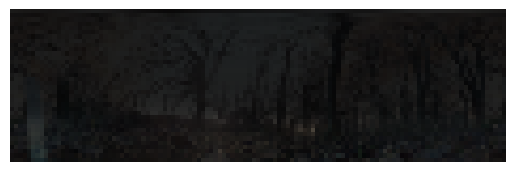

training..  2
train accuracy:  10.757211538461538
validating...


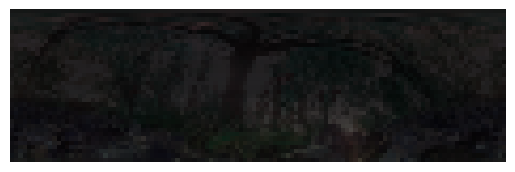

100%|████████████████████████████████████████████████| 2/2 [00:04<00:00,  2.03s/it]

validation accuracy:  8.522727272727272


8.88671875
 
 train Acc:  10.757211538461538
 
 val Acc:  8.522727272727272
 
 test Acc:  8.88671875


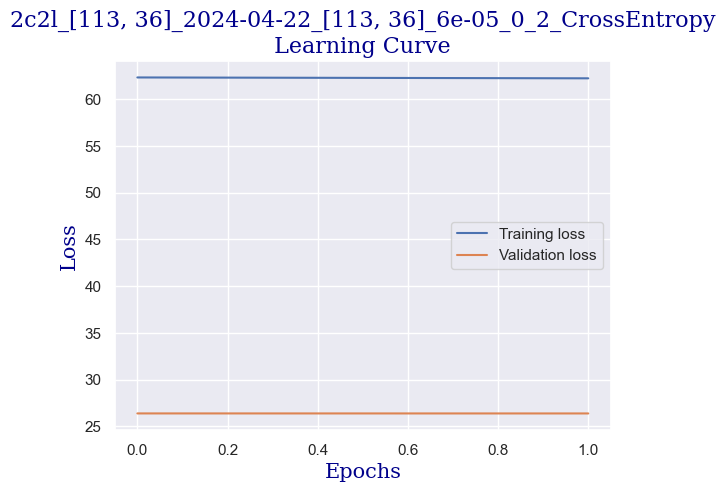

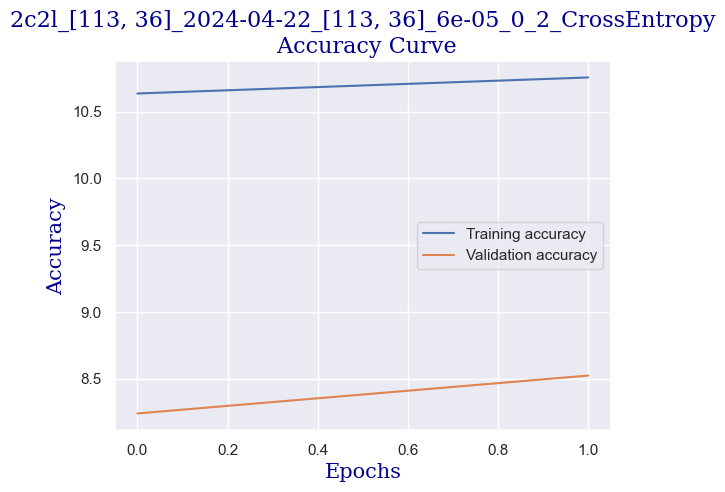

1024 1024
1024 1024


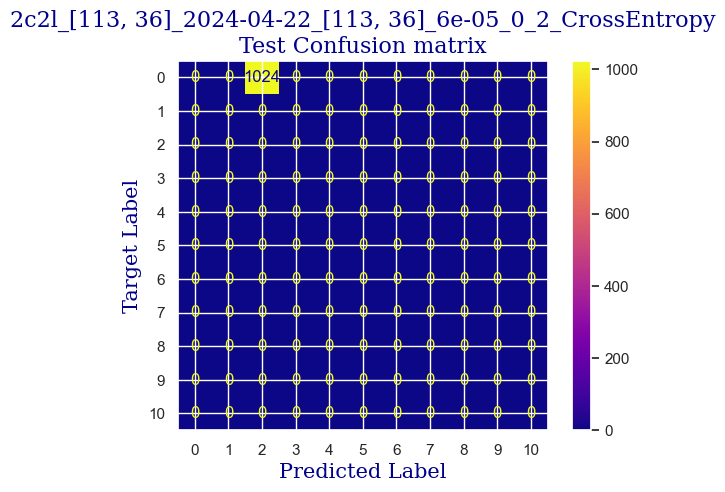

 
 END 2c2l [113, 36] Run Time:  8.022034845000235
lin lay 15552
Model:  2c2l  idx: 0 / 1
resolution:  [57, 18]  idx: 3 / 7
learning rate:  0.0001  idx: 0 / 2
weight decay:  0  idx: 0 / 2
scheduler:  0  idx: 0 / 1
seed:  8  idx: 0 / 2
loss function:  MSE  idx: 0 / 2
Batch size:  64
Training epochs:  2
start time:  6751.995564837
6739.555250519
Before model init - Current allocated memory (GB): 0.11574554443359375
After model init, Before data loading - Current allocated memory (GB): 0.12166547775268555
After data loading - Current allocated memory (GB): 0.12166547775268555


  0%|                                                        | 0/2 [00:00<?, ?it/s]

Training...


/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


training..  2
train accuracy:  8.954326923076923
validating...


 50%|████████████████████████                        | 1/2 [00:01<00:01,  1.78s/it]

validation accuracy:  9.517045454545455
Training...


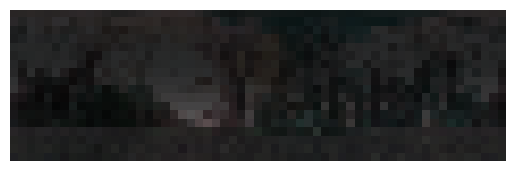

training..  2
train accuracy:  9.85576923076923
validating...


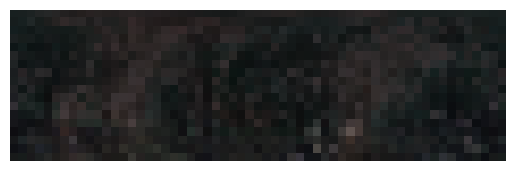

100%|████████████████████████████████████████████████| 2/2 [00:03<00:00,  1.82s/it]

validation accuracy:  9.801136363636363


9.47265625
 
 train Acc:  9.85576923076923
 
 val Acc:  9.801136363636363
 
 test Acc:  9.47265625


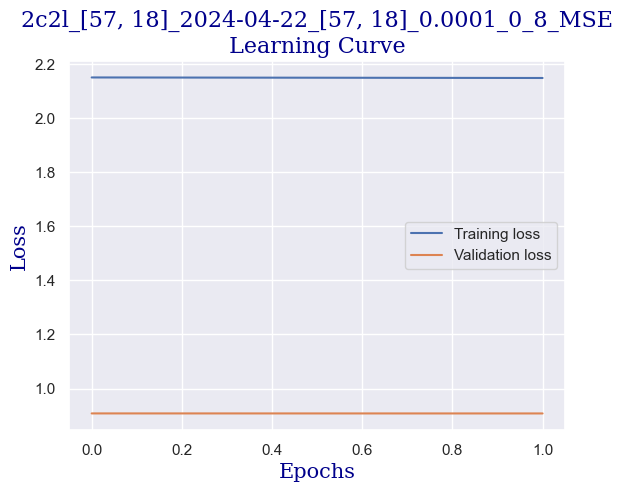

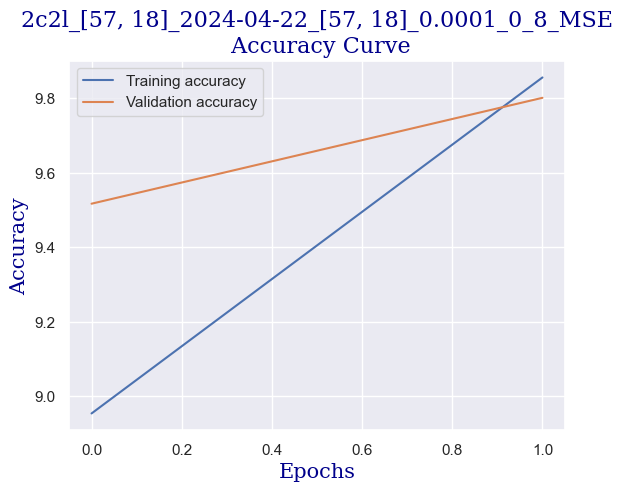

1024 1024
1024 1024


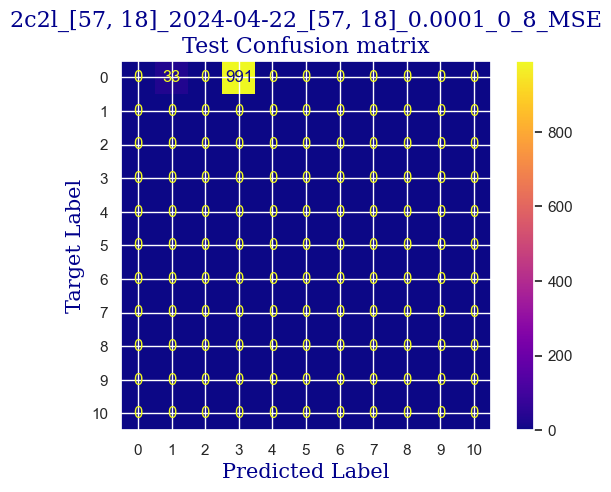

 
 END 2c2l [57, 18] Run Time:  7.598484104000818
Model:  2c2l  idx: 0 / 1
resolution:  [57, 18]  idx: 3 / 7
learning rate:  0.0001  idx: 0 / 2
weight decay:  0  idx: 0 / 2
scheduler:  0  idx: 0 / 1
seed:  8  idx: 0 / 2
loss function:  CrossEntropy  idx: 1 / 2
Batch size:  64
Training epochs:  2
start time:  6759.595299361
6747.154989616
Before model init - Current allocated memory (GB): 0.042789459228515625
After model init, Before data loading - Current allocated memory (GB): 0.04870939254760742
After data loading - Current allocated memory (GB): 0.04870939254760742


  0%|                                                        | 0/2 [00:00<?, ?it/s]

Training...


/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


training..  2
train accuracy:  8.052884615384617
validating...


 50%|████████████████████████                        | 1/2 [00:01<00:01,  1.79s/it]

validation accuracy:  8.806818181818182
Training...


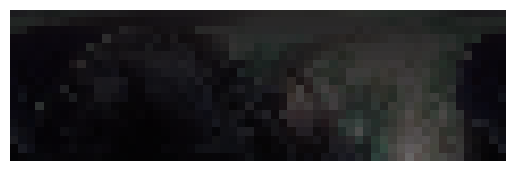

training..  2
train accuracy:  9.975961538461538
validating...


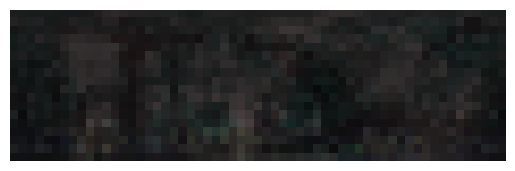

100%|████████████████████████████████████████████████| 2/2 [00:03<00:00,  1.83s/it]

validation accuracy:  10.369318181818182


11.5234375
 
 train Acc:  9.975961538461538
 
 val Acc:  10.369318181818182
 
 test Acc:  11.5234375


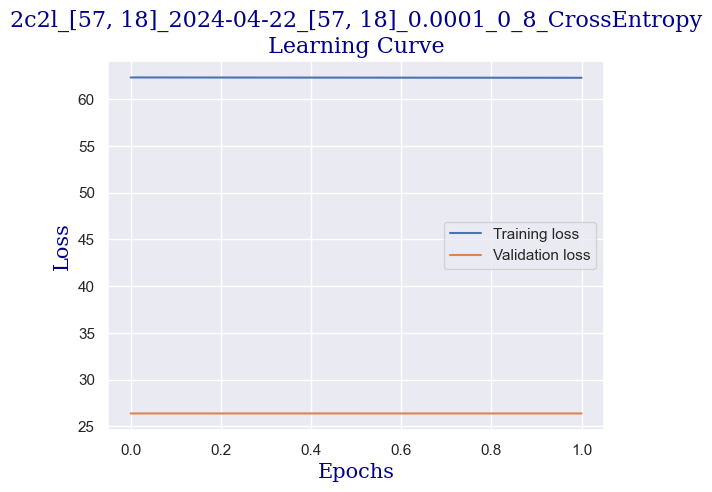

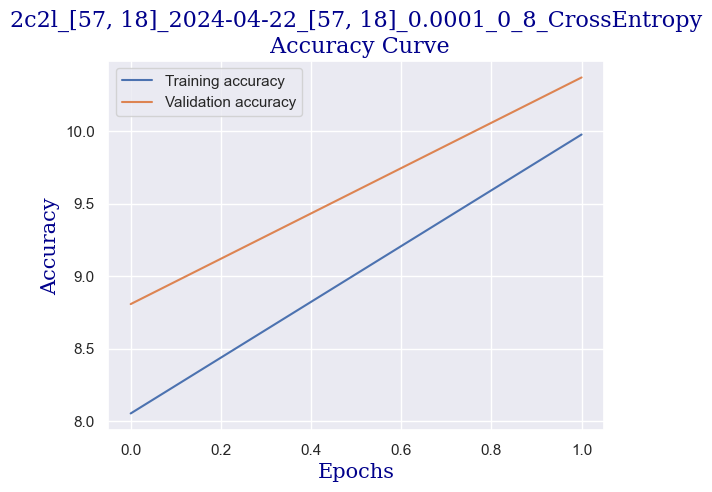

1024 1024
1024 1024


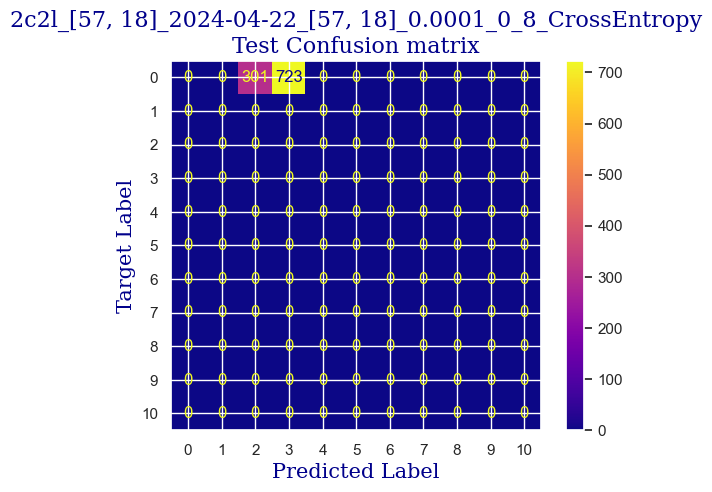

 
 END 2c2l [57, 18] Run Time:  7.654325671999686
Model:  2c2l  idx: 0 / 1
resolution:  [57, 18]  idx: 3 / 7
learning rate:  0.0001  idx: 0 / 2
weight decay:  0  idx: 0 / 2
scheduler:  0  idx: 0 / 1
seed:  2  idx: 1 / 2
loss function:  MSE  idx: 0 / 2
Batch size:  64
Training epochs:  2
start time:  6767.252302602
6754.812161565
Before model init - Current allocated memory (GB): 0.042789459228515625
After model init, Before data loading - Current allocated memory (GB): 0.04870939254760742
After data loading - Current allocated memory (GB): 0.04870939254760742


  0%|                                                        | 0/2 [00:00<?, ?it/s]

Training...


/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


training..  2
train accuracy:  9.85576923076923
validating...


 50%|████████████████████████                        | 1/2 [00:01<00:01,  1.78s/it]

validation accuracy:  8.380681818181818
Training...


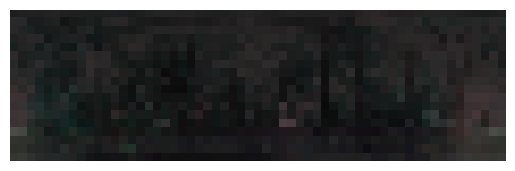

training..  2
train accuracy:  10.9375
validating...


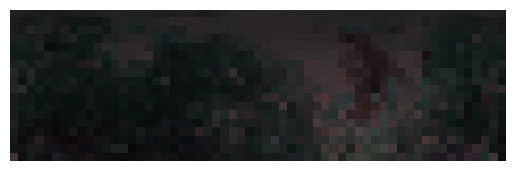

100%|████████████████████████████████████████████████| 2/2 [00:03<00:00,  1.83s/it]

validation accuracy:  8.522727272727272


9.08203125
 
 train Acc:  10.9375
 
 val Acc:  8.522727272727272
 
 test Acc:  9.08203125


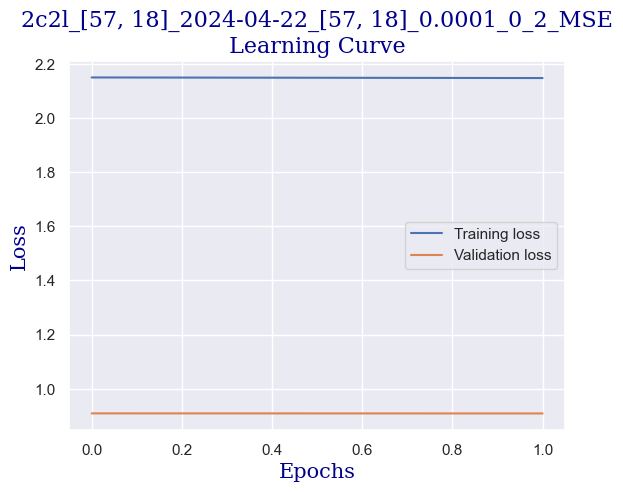

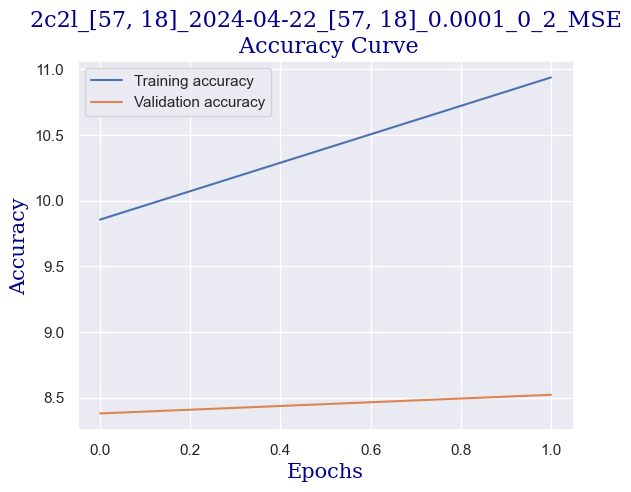

1024 1024
1024 1024


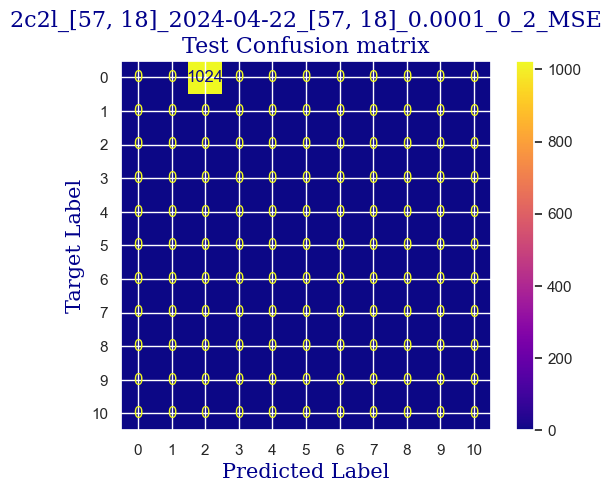

 
 END 2c2l [57, 18] Run Time:  7.549314232999677
Model:  2c2l  idx: 0 / 1
resolution:  [57, 18]  idx: 3 / 7
learning rate:  0.0001  idx: 0 / 2
weight decay:  0  idx: 0 / 2
scheduler:  0  idx: 0 / 1
seed:  2  idx: 1 / 2
loss function:  CrossEntropy  idx: 1 / 2
Batch size:  64
Training epochs:  2
start time:  6774.802788711
6762.3624755890005
Before model init - Current allocated memory (GB): 0.042789459228515625
After model init, Before data loading - Current allocated memory (GB): 0.04870939254760742
After data loading - Current allocated memory (GB): 0.04870939254760742


  0%|                                                        | 0/2 [00:00<?, ?it/s]

Training...


/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


training..  2
train accuracy:  10.036057692307693
validating...


 50%|████████████████████████                        | 1/2 [00:01<00:01,  1.77s/it]

validation accuracy:  9.232954545454545
Training...


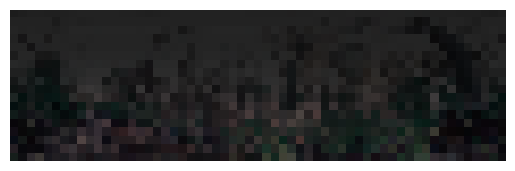

training..  2
train accuracy:  10.576923076923077
validating...


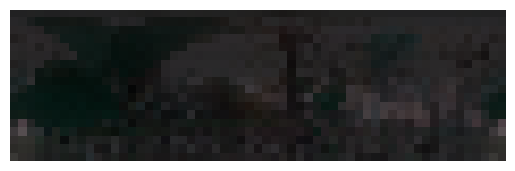

100%|████████████████████████████████████████████████| 2/2 [00:03<00:00,  1.81s/it]

validation accuracy:  9.517045454545455


10.3515625
 
 train Acc:  10.576923076923077
 
 val Acc:  9.517045454545455
 
 test Acc:  10.3515625


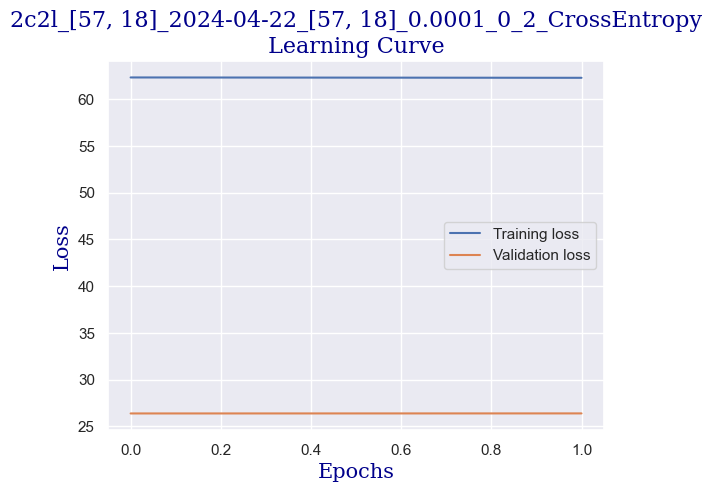

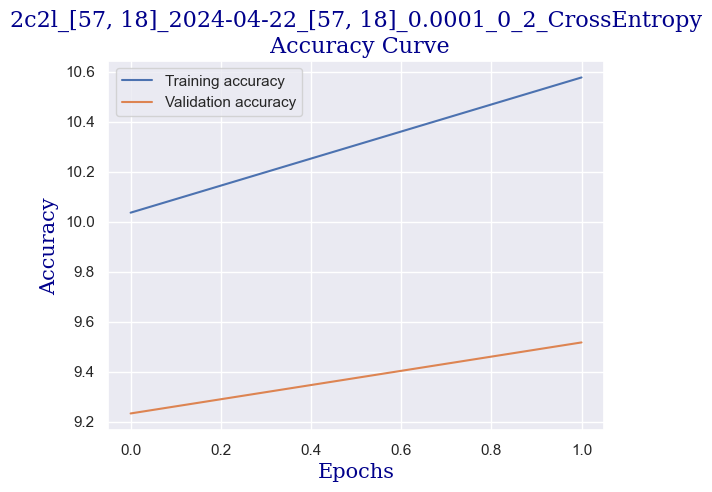

1024 1024
1024 1024


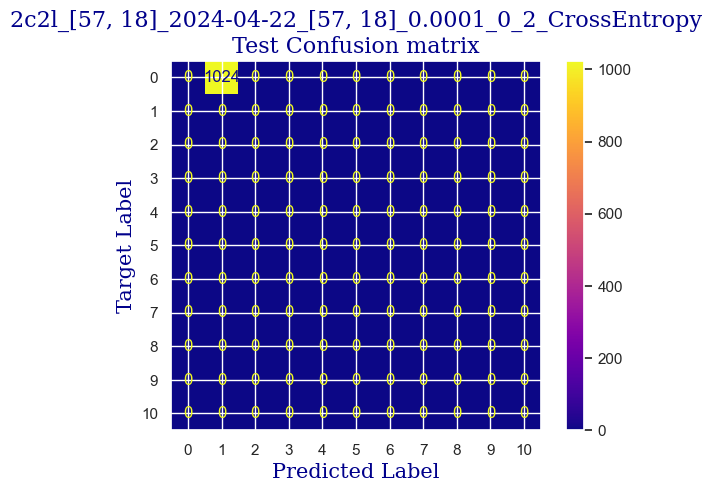

 
 END 2c2l [57, 18] Run Time:  7.605546746000073
Model:  2c2l  idx: 0 / 1
resolution:  [57, 18]  idx: 3 / 7
learning rate:  0.0001  idx: 0 / 2
weight decay:  4e-05  idx: 1 / 2
scheduler:  0  idx: 0 / 1
seed:  8  idx: 0 / 2
loss function:  MSE  idx: 0 / 2
Batch size:  64
Training epochs:  2
start time:  6782.409722304
6769.969411746
Before model init - Current allocated memory (GB): 0.042789459228515625
After model init, Before data loading - Current allocated memory (GB): 0.04870939254760742
After data loading - Current allocated memory (GB): 0.04870939254760742


  0%|                                                        | 0/2 [00:00<?, ?it/s]

Training...


/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


training..  2
train accuracy:  8.29326923076923
validating...


 50%|████████████████████████                        | 1/2 [00:01<00:01,  1.79s/it]

validation accuracy:  9.090909090909092
Training...


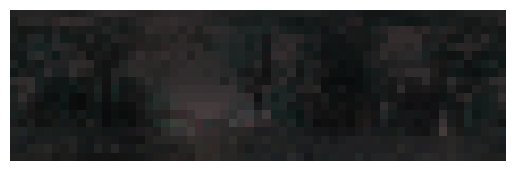

training..  2
train accuracy:  9.014423076923077
validating...


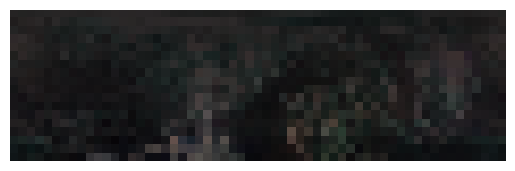

100%|████████████████████████████████████████████████| 2/2 [00:03<00:00,  1.85s/it]

validation accuracy:  8.806818181818182


9.9609375
 
 train Acc:  9.014423076923077
 
 val Acc:  8.806818181818182
 
 test Acc:  9.9609375


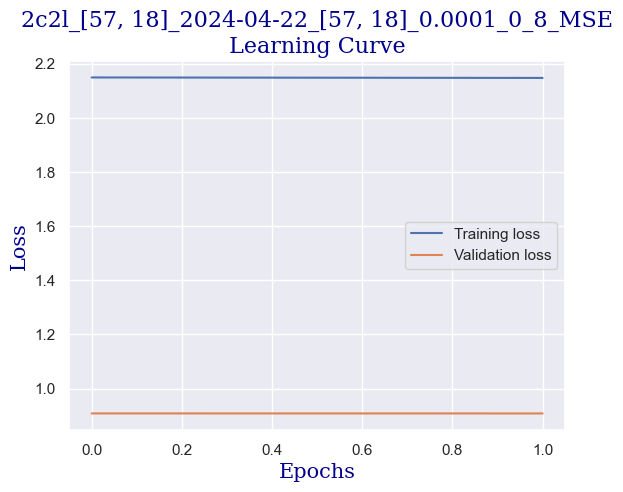

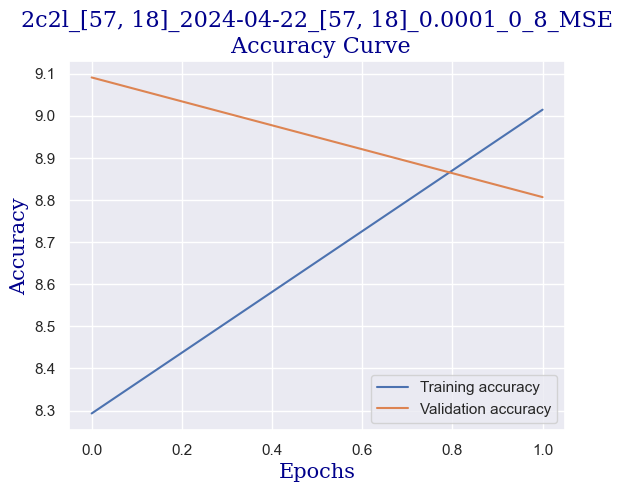

1024 1024
1024 1024


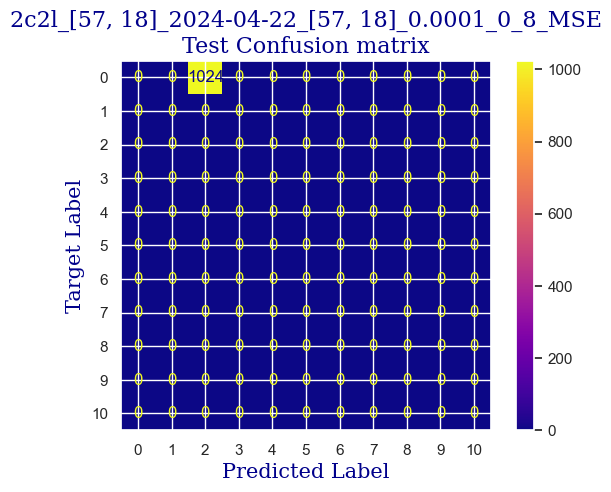

 
 END 2c2l [57, 18] Run Time:  7.561695088000306
Model:  2c2l  idx: 0 / 1
resolution:  [57, 18]  idx: 3 / 7
learning rate:  0.0001  idx: 0 / 2
weight decay:  4e-05  idx: 1 / 2
scheduler:  0  idx: 0 / 1
seed:  8  idx: 0 / 2
loss function:  CrossEntropy  idx: 1 / 2
Batch size:  64
Training epochs:  2
start time:  6789.972667102
6777.532356119
Before model init - Current allocated memory (GB): 0.042789459228515625
After model init, Before data loading - Current allocated memory (GB): 0.04870939254760742


Traceback (most recent call last):
  File "/tmp/ipykernel_165225/3207277189.py", line 87, in _go
    av_lum = IP.new_luminance(x_train)
  File "/its/home/nn268/antvis/antvis/optics/Batchcode/.././functions.py", line 146, in new_luminance
    d = cv2.imread(img_path)
KeyboardInterrupt
wandb: ERROR Control-C detected -- Run data was not synced


KeyboardInterrupt: 

In [11]:
_go(config)

In [ ]:
# 12.58 GiB. GPU 0 has a total capacty of 23.65 GiB of which 8.04 GiB is free
23.65-8.04


pred torch.Size([11])

lab  torch.Size([5, 11])